In [3]:
!pip install pmdarima
!pip install git+https://github.com/amazon-science/chronos-forecasting.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.4 MB/s eta 0:00:00
  Cloning https://github.com/amazon-science/chronos-forecasting.git to /tmp/pip-req-build-ssbv2v65
  Running command git clone --filter=blob:none --quiet https://github.com/amazon-science/chronos-forecasting.git /tmp/pip-req-build-ssbv2v65
  Resolved https://github.com/amazon-science/chronos-forecasting.git to commit 7a019b3432a62ae8827d73daa5b2163b084dfd37
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 3.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 

In [4]:
# Import statements
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mtick
import seaborn as sns
import random as python_random

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.graphics.gofplots import qqplot

from pmdarima import auto_arima

from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel as C

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.regularizers import l1_l2
import tensorflow as tf
from math import sqrt

import torch
from chronos import ChronosPipeline

# Define the Mean Absolute Percentage Error (MAPE) function
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero = y_true != 0
    return np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100

# Datasets

    OWID Covid data

**Loading and Filtering**

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Loading the dataset, replacing NaN values with 0, and suppressing the DtypeWarning by setting low_memory=False
nl_covid_data = pd.read_csv('/content/drive/My Drive/Thesis/Data/owid_covid-data_28022020-05032022_daily-updated.csv', delimiter=';', low_memory=False).fillna(0)

# Filter for the Netherlands and explicitly create a copy to avoid the SettingWithCopyWarning
nl_covid_data = nl_covid_data[nl_covid_data['location'] == 'Netherlands'].copy()

# Convert 'date' from string to datetime with the correct format
nl_covid_data['date'] = pd.to_datetime(nl_covid_data['date'], format='%d/%m/%Y')

# Filter the data for the date range from 27 February 2020 to 2nd March 2022
filtered_nl_covid_data = nl_covid_data[(nl_covid_data['date'] >= pd.Timestamp(2020, 2, 27)) & (nl_covid_data['date'] <= pd.Timestamp(2022, 3, 2))]

# Define the list of columns to keep
columns_to_keep = [
    'date', 'new_cases_smoothed', 'new_tests_smoothed', 'tests_units', 'new_vaccinations_smoothed'
    # 'new_deaths_smoothed', 'icu_patients','hosp_patients', 'reproduction_rate', 'total_cases', 'total_deaths', 'new_deaths', 'new_cases', 'new_cases_smoothed_per_million', 'new_deaths_smoothed_per_million', 'positive_rate', 'tests_per_case', 'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed'
]

# Select only the specified columns to keep
filtered_nl_covid_data = filtered_nl_covid_data[columns_to_keep]

# Extract date features directly from the 'date' column
filtered_nl_covid_data['year'] = filtered_nl_covid_data['date'].dt.year
filtered_nl_covid_data['month'] = filtered_nl_covid_data['date'].dt.month
filtered_nl_covid_data['day'] = filtered_nl_covid_data['date'].dt.day
filtered_nl_covid_data['day_of_week'] = filtered_nl_covid_data['date'].dt.dayofweek
filtered_nl_covid_data['day_of_year'] = filtered_nl_covid_data['date'].dt.dayofyear

# # List of columns to convert to floats
# columns_to_float = [
#     'reproduction_rate', 'positive_rate', 'tests_per_case'
# ]

# List of columns to convert to integers
columns_to_int = [
    'new_cases_smoothed', 'new_tests_smoothed',  'new_vaccinations_smoothed'

    # 'new_deaths_smoothed', 'icu_patients', 'hosp_patients','total_cases', 'new_cases', 'total_deaths', 'new_deaths', 'new_cases_smoothed_per_million', 'new_deaths_smoothed_per_million', 'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed'
]

# # Convert columns to the appropriate types
# for column in columns_to_float:
#     filtered_nl_covid_data[column] = pd.to_numeric(filtered_nl_covid_data[column], errors='coerce').fillna(0).astype(float)

for column in columns_to_int:
    filtered_nl_covid_data[column] = pd.to_numeric(filtered_nl_covid_data[column], errors='coerce').fillna(0).astype(int)

# Adjust the 'tests_units' column to be 1 where "tests performed" is found, otherwise 0
filtered_nl_covid_data['tests_units'] = filtered_nl_covid_data['tests_units'].apply(lambda x: 1 if "tests performed" in str(x).lower() else 0)

# Create a new lagged column for new_cases_smoothed by 14 days
filtered_nl_covid_data['new_cases_smoothed_lagged_14'] = filtered_nl_covid_data['new_cases_smoothed'].shift(14).fillna(0).astype(int)

# Sort the DataFrame by the 'date' column
filtered_nl_covid_data.sort_values('date', inplace=True)

filtered_nl_covid_data.head

<bound method NDFrame.head of              date  new_cases_smoothed  new_tests_smoothed  tests_units  \
106791 2020-02-27                   0                   0            0   
106792 2020-02-28                   0                   0            0   
106793 2020-02-29                   0                   0            0   
106794 2020-03-01                   0                   0            0   
106795 2020-03-02                   0                   0            0   
...           ...                 ...                 ...          ...   
107521 2022-02-26               34610               54255            1   
107522 2022-02-27               33595               53193            1   
107523 2022-02-28               41796               53110            1   
107524 2022-03-01               42337               54684            1   
107525 2022-03-02               43391               58861            1   

        new_vaccinations_smoothed  year  month  day  day_of_week  day_of_year  \
106791                          0  2020      2   27            3           58   
106792                          0  2020      2   28            4           59   
106793                          0  2020      2   29            5           60   
106794                          0  2020      3    1            6           61   
106795                          0  2020      3    2            0           62   
...                           ...   ...    ...  ...          ...          ...   
107521                       8441  2022      2   26            5           57   
107522                       7667  2022      2   27            6           58   
107523                       6894  2022      2   28            0           59   
107524                       6120  2022      3    1            1           60   
107525                       5346  2022      3    2            2           61   

        new_cases_smoothed_lagged_14  
106791                             0  
106792                             0  
106793                             0  
106794                             0  
106795                             0  
...                              ...  
107521                        120360  
107522                        117130  
107523                         70433  
107524                         67193  
107525                         62849  

[735 rows x 11 columns]>

In [8]:
# Assuming 'filtered_nl_covid_data' is your DataFrame that has already been filtered for the date range and columns of interest
descriptive_statistics = filtered_nl_covid_data.describe()

# To display the descriptive statistics
print(descriptive_statistics)

                                date  new_cases_smoothed  new_tests_smoothed  \
count                            735          735.000000          735.000000   
mean   2021-02-28 00:00:00.000000256         8700.865306        38294.708844   
min              2020-02-27 00:00:00            0.000000            0.000000   
25%              2020-08-28 12:00:00          887.000000        16160.000000   
50%              2021-02-28 00:00:00         3927.000000        31496.000000   
75%              2021-08-30 12:00:00         7698.000000        54293.500000   
max              2022-03-02 00:00:00       125321.000000       146399.000000   
std                              NaN        16722.998494        31526.524523   

       tests_units  new_vaccinations_smoothed         year       month  \
count   735.000000                 735.000000   735.000000  735.000000   
mean      0.870748               46131.680272  2020.662585    6.497959   
min       0.000000                   0.000000  2020.00000

**EDA**

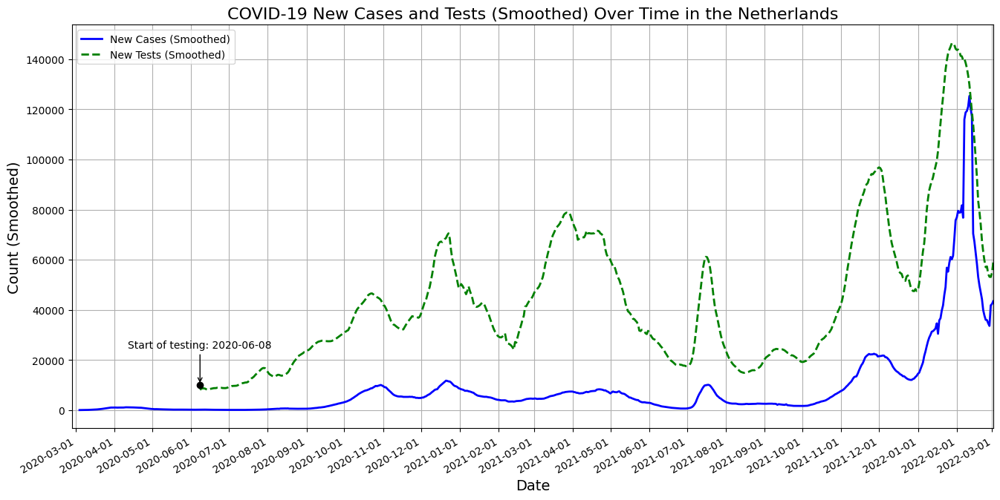

In [9]:
# Ensure 'date' column is sorted
filtered_nl_covid_data.sort_values('date', inplace=True)

# Convert 'date' to NumPy array
dates_np = filtered_nl_covid_data['date'].to_numpy()

# Apply masks and convert to NumPy arrays
mask_cases_np = filtered_nl_covid_data['new_cases_smoothed'].to_numpy() != 0
mask_tests_np = filtered_nl_covid_data['new_tests_smoothed'].to_numpy() != 0

dates_cases_np = dates_np[mask_cases_np]
new_cases_smoothed_np = filtered_nl_covid_data['new_cases_smoothed'].to_numpy()[mask_cases_np]

dates_tests_np = dates_np[mask_tests_np]
new_tests_smoothed_np = filtered_nl_covid_data['new_tests_smoothed'].to_numpy()[mask_tests_np]

# Create the plot for new_cases_smoothed and new_tests_smoothed
plt.figure(figsize=(16, 8))

# Plotting on the same y-axis
plt.plot(dates_cases_np, new_cases_smoothed_np, color='blue', linewidth=2, label='New Cases (Smoothed)')
plt.plot(dates_tests_np, new_tests_smoothed_np, color='green', linewidth=2, label='New Tests (Smoothed)', linestyle='--')

# Find the first date where testing is non-zero for the annotation
first_test_idx = np.where(mask_tests_np)[0][0]
start_testing_date = dates_np[first_test_idx]
start_testing_value = 10000

# Add a small marker for the start of testing
plt.plot(start_testing_date, start_testing_value, 'ko')  # Black circle marker

# Annotate the start of testing date, positioned straight above the marker
plt.annotate('Start of testing: {}'.format(pd.to_datetime(start_testing_date).strftime('%Y-%m-%d')),
             xy=(start_testing_date, start_testing_value),
             xytext=(start_testing_date, start_testing_value + max(new_tests_smoothed_np) * 0.1),  # Slightly above the point
             ha='center',  # Center the annotation horizontally
             arrowprops=dict(facecolor='black', arrowstyle='->'))

# Format the plot
plt.title('COVID-19 New Cases and Tests (Smoothed) Over Time in the Netherlands', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Count (Smoothed)', fontsize=14)

# Improve date x-ticks readability
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()

# Set the x-axis limits to the full date range
plt.xlim([dates_np.min(), dates_np.max()])

plt.legend(loc='upper left')
plt.grid(True)
plt.show()

Deaths

In [10]:
"""New deaths smoothed is left out"""
# # Ensure 'date' column is sorted
# filtered_nl_covid_data.sort_values('date', inplace=True)

# # Create masks for non-zero values
# mask_deaths = filtered_nl_covid_data['new_deaths_smoothed'] != 0
# mask_vaccinations = filtered_nl_covid_data['new_vaccinations_smoothed'] != 0

# # Find the first non-zero vaccination date for the annotation
# start_vaccinations_date = filtered_nl_covid_data[mask_vaccinations]['date'].iloc[0]
# start_vaccinations_value = filtered_nl_covid_data[mask_vaccinations]['new_vaccinations_smoothed'].iloc[0]

# # Convert to NumPy arrays for plotting, using masks to only include non-zero values
# dates_np = filtered_nl_covid_data['date'].to_numpy()
# new_deaths_smoothed_np = filtered_nl_covid_data['new_deaths_smoothed'].to_numpy()[mask_deaths]
# new_vaccinations_smoothed_np = filtered_nl_covid_data['new_vaccinations_smoothed'].to_numpy()[mask_vaccinations]

# # Create the plot for new_deaths_smoothed and new_vaccinations_smoothed
# plt.figure(figsize=(16, 8))

# # Primary y-axis for new_deaths_smoothed
# ax = plt.gca()
# ax.plot(dates_np[mask_deaths], new_deaths_smoothed_np, color='red', linewidth=2, label='New Deaths (Smoothed)')
# ax.set_ylabel('New Deaths (Smoothed)', color='red', fontsize=14)
# ax.tick_params(axis='y', colors='red')

# # Secondary y-axis for new_vaccinations_smoothed
# ax2 = ax.twinx()
# ax2.plot(dates_np[mask_vaccinations], new_vaccinations_smoothed_np, color='green', linewidth=2, label='New Vaccinations (Smoothed)', linestyle='--')
# ax2.set_ylabel('New Vaccinations (Smoothed)', color='green', fontsize=14)
# ax2.tick_params(axis='y', colors='green')

# # Adding a marker and annotation for the start of vaccinations
# ax2.plot(start_vaccinations_date, start_vaccinations_value, 'ko')  # Black circle marker
# ax2.annotate('Start of vaccinations: {}'.format(start_vaccinations_date.strftime('%Y-%m-%d')),
#              xy=(start_vaccinations_date, start_vaccinations_value),
#              xytext=(start_vaccinations_date, start_vaccinations_value + max(new_vaccinations_smoothed_np) * 0.1),  # Slightly above the point
#              ha='center',  # Center the annotation horizontally
#              arrowprops=dict(facecolor='black', arrowstyle='->'))

# # Format the plot
# plt.title('COVID-19 New Deaths and Vaccinations (Smoothed) Over Time in the Netherlands', fontsize=16)
# ax.set_xlabel('Date', fontsize=14)

# # Improve date x-ticks readability
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
# ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
# plt.gcf().autofmt_xdate()

# # Add legend
# lines, labels = ax.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax.legend(lines + lines2, labels + labels2, loc='upper left')

# # Set the x-axis limits to the full date range
# plt.xlim([filtered_nl_covid_data['date'].min(), filtered_nl_covid_data['date'].max()])

# plt.grid(True)
# plt.show()

'New deaths smoothed is left out'

    Oxfort Policy dataset

In [11]:
# Load the dataset
OX_policy_data = pd.read_csv(
    "/content/drive/My Drive/Thesis/Data/OxCGRT_compact_national_01012020-31122022.csv", delimiter=";"
)

# Select the required columns, excluding CountryCode
columns_to_keep = [
    "CountryName", "Date", "C1M_School closing",
    "C2M_Workplace closing", "C3M_Cancel public events",
    "C4M_Restrictions on gatherings", "C5M_Close public transport",
    "C6M_Stay at home requirements", "C7M_Restrictions on internal movement",
    "C8EV_International travel controls", "E1_Income support",
    "E2_Debt/contract relief", "H1_Public information campaigns",
    "H2_Testing policy", "H3_Contact tracing", "H6M_Facial Coverings",
    "H7_Vaccination policy", "H8M_Protection of elderly people",
]
OX_policy_data = OX_policy_data[columns_to_keep]

# Filter for the Netherlands
OX_policy_data = OX_policy_data[OX_policy_data['CountryName'] == 'Netherlands']

# Convert the Date column to datetime format
OX_policy_data['Date'] = pd.to_datetime(OX_policy_data['Date'], format='%Y%m%d')

# Filter dates from 27 February 2020 to 02 March 2022
start_date = pd.to_datetime("2020-02-27")
end_date = pd.to_datetime("2022-03-02")
OX_policy_data = OX_policy_data[(OX_policy_data['Date'] >= start_date) & (OX_policy_data['Date'] <= end_date)]

# Convert selected columns to integers, except for StringencyIndex_Average
integer_columns = columns_to_keep[2:-1]  # Exclude CountryName, Date, and StringencyIndex_Average
OX_policy_data[integer_columns] = OX_policy_data[integer_columns].fillna(0).astype(int)

# Proceed with your EDA here...
OX_policy_data

<ipython-input-11-11df115b11aa>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OX_policy_data['Date'] = pd.to_datetime(OX_policy_data['Date'], format='%Y%m%d')


,CountryName,Date,C1M_School closing,C2M_Workplace closing,C3M_Cancel public events,C4M_Restrictions on gatherings,C5M_Close public transport,C6M_Stay at home requirements,C7M_Restrictions on internal movement,C8EV_International travel controls,E1_Income support,E2_Debt/contract relief,H1_Public information campaigns,H2_Testing policy,H3_Contact tracing,H6M_Facial Coverings,H7_Vaccination policy,H8M_Protection of elderly people
133769,Netherlands,2020-02-27,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,0.0
133770,Netherlands,2020-02-28,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,0.0
133771,Netherlands,2020-02-29,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,0.0
133772,Netherlands,2020-03-01,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,0.0
133773,Netherlands,2020-03-02,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134499,Netherlands,2022-02-26,0,0,1,0,0,1,1,1,2,0,2,3,2,2,5,2.0
134500,Netherlands,2022-02-27,0,0,1,0,0,1,1,1,2,0,2,3,2,2,5,2.0
134501,Netherlands,2022-02-28,0,0,1,0,0,1,1,1,2,0,2,3,2,2,5,2.0
134502,Netherlands,2022-03-01,0,0,1,0,0,1,1,1,2,0,2,3,2,2,5,2.0


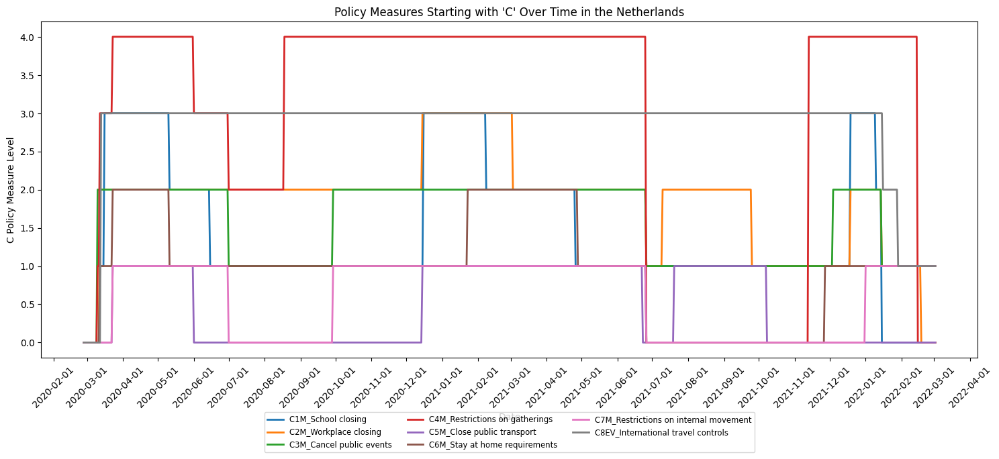

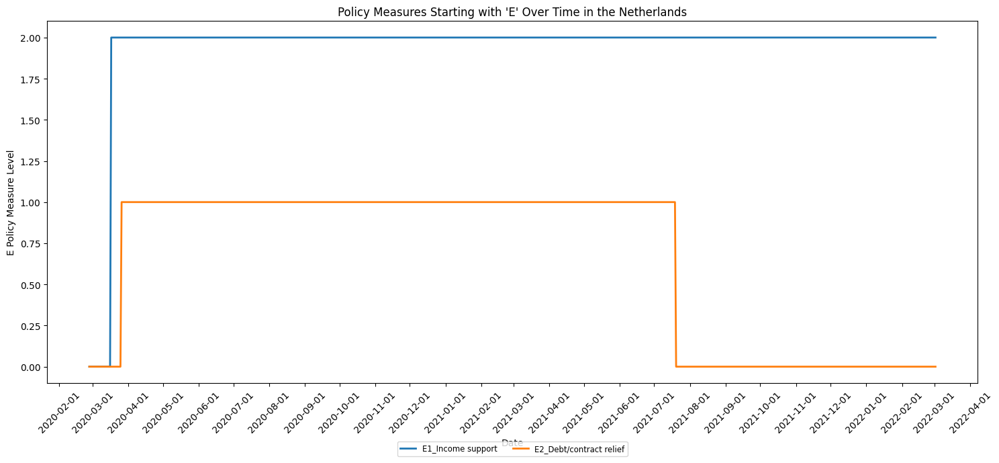

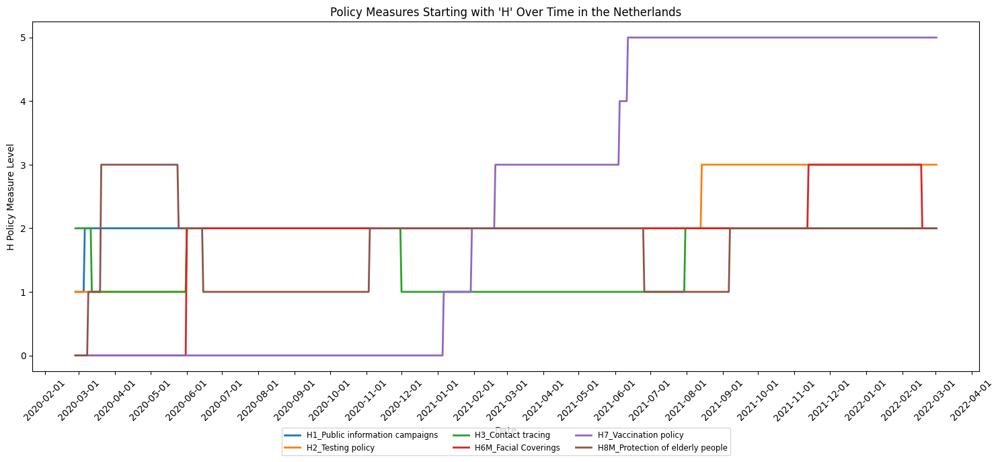

In [12]:
# Define the policy measure groups
policies_by_letter = {
    'C': ["C1M_School closing", "C2M_Workplace closing", "C3M_Cancel public events",
          "C4M_Restrictions on gatherings", "C5M_Close public transport",
          "C6M_Stay at home requirements", "C7M_Restrictions on internal movement",
          "C8EV_International travel controls"],
    'E': ["E1_Income support", "E2_Debt/contract relief"],
    'H': ["H1_Public information campaigns", "H2_Testing policy", "H3_Contact tracing",
          "H6M_Facial Coverings", "H7_Vaccination policy",
          "H8M_Protection of elderly people"]  # Adding StringencyIndex_Average as its own group for plotting
}

# Select distinct colors for each policy
colors = plt.cm.tab10(np.linspace(0, 1, 10))

# Plot each group of policies in its own figure
for letter, policies in policies_by_letter.items():
    fig, ax = plt.subplots(figsize=(15, 7))

    for i, policy in enumerate(policies):
        # Convert the pandas Series to numpy arrays
        dates = OX_policy_data['Date'].to_numpy()
        values = OX_policy_data[policy].to_numpy()

        # Plot with a thicker line
        ax.plot(dates, values, label=policy, color=colors[i % len(colors)], linewidth=2)

    # Format the x-axis to show full dates and adjust tick frequency
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

    ax.set_xlabel("Date")
    ax.set_ylabel(f"{letter} Policy Measure Level" if letter != 'S' else "Stringency Index")
    ax.set_title(f"{'Policy Measures' if letter != 'S' else 'Stringency Index'} Starting with '{letter}' Over Time in the Netherlands")
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3, fontsize='small')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


**Combine Datasets**

In [13]:
# Merge the datasets on the date columns
df_covid_full = pd.merge(filtered_nl_covid_data, OX_policy_data, left_on='date', right_on='Date', how='inner')

# Optionally, you can drop one of the date columns if they're duplicates post-merge
df_covid_full.drop(columns=['Date', 'CountryName'], inplace=True)

# Now, df_covid_full contains the combined data from both datasets
df_covid_full

,date,new_cases_smoothed,new_tests_smoothed,tests_units,new_vaccinations_smoothed,year,month,day,day_of_week,day_of_year,...,C7M_Restrictions on internal movement,C8EV_International travel controls,E1_Income support,E2_Debt/contract relief,H1_Public information campaigns,H2_Testing policy,H3_Contact tracing,H6M_Facial Coverings,H7_Vaccination policy,H8M_Protection of elderly people
0,2020-02-27,0,0,0,0,2020,2,27,3,58,...,0,0,0,0,1,1,2,0,0,0.0
1,2020-02-28,0,0,0,0,2020,2,28,4,59,...,0,0,0,0,1,1,2,0,0,0.0
2,2020-02-29,0,0,0,0,2020,2,29,5,60,...,0,0,0,0,1,1,2,0,0,0.0
3,2020-03-01,0,0,0,0,2020,3,1,6,61,...,0,0,0,0,1,1,2,0,0,0.0
4,2020-03-02,0,0,0,0,2020,3,2,0,62,...,0,0,0,0,1,1,2,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,2022-02-26,34610,54255,1,8441,2022,2,26,5,57,...,1,1,2,0,2,3,2,2,5,2.0
731,2022-02-27,33595,53193,1,7667,2022,2,27,6,58,...,1,1,2,0,2,3,2,2,5,2.0
732,2022-02-28,41796,53110,1,6894,2022,2,28,0,59,...,1,1,2,0,2,3,2,2,5,2.0
733,2022-03-01,42337,54684,1,6120,2022,3,1,1,60,...,1,1,2,0,2,3,2,2,5,2.0


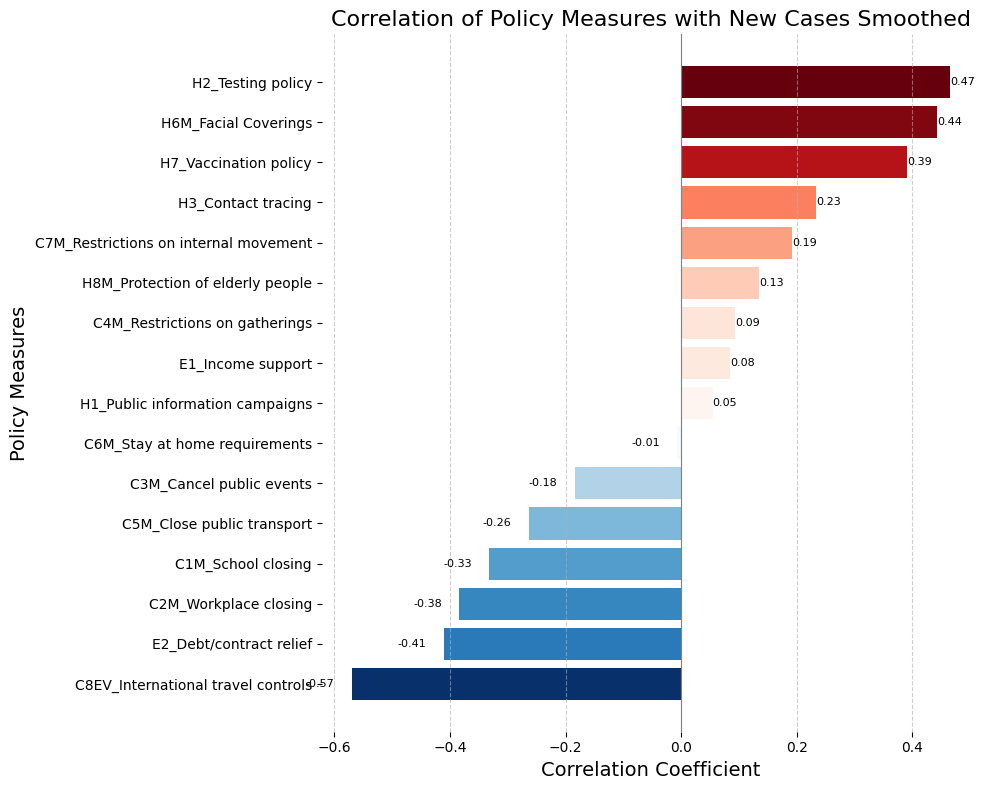

In [14]:

# List of policy columns
policy_columns = [
    "C1M_School closing", "C2M_Workplace closing", "C3M_Cancel public events",
    "C4M_Restrictions on gatherings", "C5M_Close public transport",
    "C6M_Stay at home requirements", "C7M_Restrictions on internal movement",
    "C8EV_International travel controls", "E1_Income support",
    "E2_Debt/contract relief", "H1_Public information campaigns",
    "H2_Testing policy", "H3_Contact tracing", "H6M_Facial Coverings",
    "H7_Vaccination policy", "H8M_Protection of elderly people"
]

# Calculate the correlation matrix for these columns and 'new_cases_smoothed'
correlation_matrix = df_covid_full[policy_columns + ['new_cases_smoothed']].corr()

# Extract the correlations of all items against 'new_cases_smoothed', excluding its own correlation
correlations_with_new_cases = correlation_matrix['new_cases_smoothed'].drop('new_cases_smoothed', axis=0)

# Sort the correlations for visualization clarity
correlations_with_new_cases_sorted = correlations_with_new_cases.sort_values(ascending=True)

# Separate positive and negative correlations for color mapping
positive_corrs = correlations_with_new_cases_sorted[correlations_with_new_cases_sorted >= 0]
negative_corrs = correlations_with_new_cases_sorted[correlations_with_new_cases_sorted < 0]

# Normalize the absolute values of correlations to [0, 1] for positive
# Positive stays the same: Darker as it gets higher
norm_pos_corrs = (positive_corrs - positive_corrs.min()) / (positive_corrs.max() - positive_corrs.min())

# For negative, reverse the effect: Darker as it gets further from zero
norm_neg_corrs = 1 - ((negative_corrs - negative_corrs.min()) / (negative_corrs.max() - negative_corrs.min()))

# Create color maps
pos_cmap = sns.color_palette("Reds", as_cmap=True)
neg_cmap = sns.color_palette("Blues", as_cmap=True)  # Using 'Blues' instead of 'Blues_r' for correct gradient

# Mapping normalized values to colors
colors_pos = [pos_cmap(x) for x in norm_pos_corrs]
colors_neg = [neg_cmap(x) for x in norm_neg_corrs]

# Combine colors for negative and positive correlations
colors = np.concatenate([colors_neg, colors_pos])

# Plotting
plt.figure(figsize=(10, 8))
bars = plt.barh(np.concatenate([negative_corrs.index, positive_corrs.index]),
                np.concatenate([negative_corrs.values, positive_corrs.values]),
                color=colors)

# Add value labels to each bar
for bar, value in zip(bars, np.concatenate([negative_corrs.values, positive_corrs.values])):
    plt.text(value if value > 0 else value - 0.03, bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha='right' if value < 0 else 'left', color='black', fontsize=8)

plt.title('Correlation of Policy Measures with New Cases Smoothed', fontsize=16)
plt.xlabel('Correlation Coefficient', fontsize=14)
plt.ylabel('Policy Measures', fontsize=14)
plt.axvline(x=0, color='grey', linewidth=0.8)
plt.grid(axis='x', linestyle='--', alpha=0.6)
sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()


    Mobility data

In [15]:
# Load the dataset
mobility_data = pd.read_csv(
    "/content/drive/My Drive/Thesis/Data/changes-visitors-covid 20022020-15102022.csv", delimiter=";"
)

# Filter by only keeping data from The Netherlands
mobility_data = mobility_data[mobility_data['Entity'] == 'Netherlands']

# Setting the 'days' column in the right format
mobility_data['Date'] = pd.to_datetime(mobility_data['Day'], format='%d/%m/%Y')

# Drop the 'Code' column
mobility_data.drop(columns=['Code', "Day", "Entity", "residential", "grocery_and_pharmacy"], inplace=True)

# Set the start and end dates for the filter
start_date = pd.to_datetime("2020-02-27")
end_date = pd.to_datetime("2022-03-02")

# Filter the DataFrame to only include rows within the specified date range
mobility_data = mobility_data[(mobility_data['Date'] >= start_date) & (mobility_data['Date'] <= end_date)]

# Now, mobility_data is ready for further EDA
mobility_data

<ipython-input-15-34008248b1c6>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mobility_data['Date'] = pd.to_datetime(mobility_data['Day'], format='%d/%m/%Y')
<ipython-input-15-34008248b1c6>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mobility_data.drop(columns=['Code', "Day", "Entity", "residential", "grocery_and_pharmacy"], inplace=True)


,retail_and_recreation,transit_stations,parks,workplaces,Date
79514,5.286,-1.429,4.714,-11.429,2020-02-27
79515,4.429,-2.286,3.143,-12.000,2020-02-28
79516,3.857,-4.143,2.571,-11.714,2020-02-29
79517,4.143,-4.143,6.571,-11.143,2020-03-01
79518,2.000,-3.714,4.286,-7.857,2020-03-02
...,...,...,...,...,...
80244,-12.286,-31.000,10.571,-19.714,2022-02-26
80245,-7.286,-27.000,27.000,-18.857,2022-02-27
80246,-4.429,-26.000,36.143,-19.714,2022-02-28
80247,-4.000,-26.000,38.000,-20.571,2022-03-01


<ipython-input-16-0e6b71db1898>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:.0f}%'.format(y) for y in y_ticks])


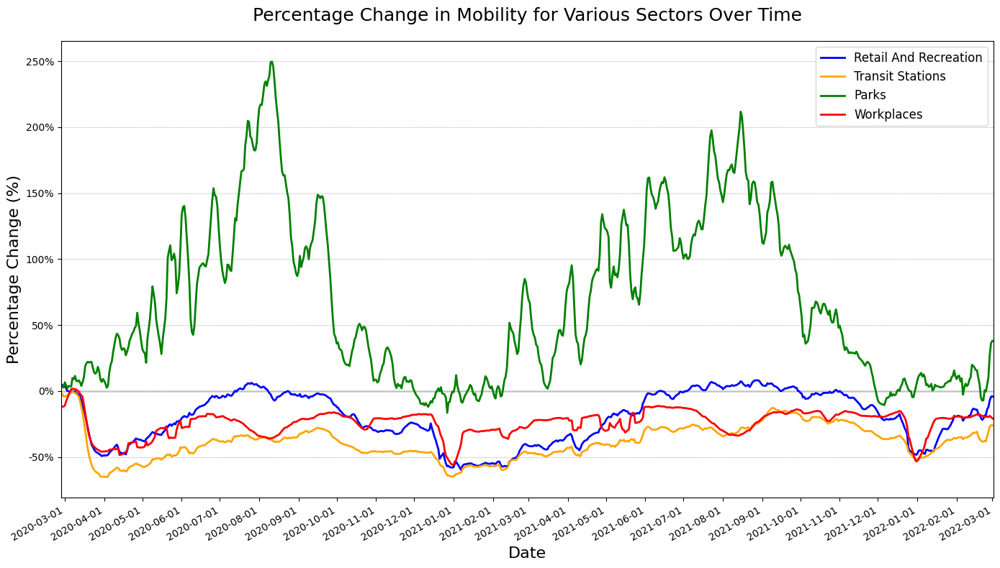

In [16]:
"""get rid of residential and Grocery & Pharmacy because can't restrict those fundamental rights"""

# Sorting 'Date' column just in case
mobility_data.sort_values('Date', inplace=True)

# Convert 'Date' to NumPy array
dates_np = mobility_data['Date'].to_numpy()

plt.figure(figsize=(14, 8))

colors = ['blue', 'orange', 'green', 'red']
columns = ['retail_and_recreation', 'transit_stations', 'parks', 'workplaces']

# Plot the 0% line first to ensure it's in the background
plt.axhline(0, color='lightgrey', linewidth=2, zorder=1)

for column, color in zip(columns, colors):
    plt.plot(dates_np, mobility_data[column].values, label=column.replace('_', ' ').title(), color=color, linewidth=2, zorder=2)

plt.title('Percentage Change in Mobility for Various Sectors Over Time', fontsize=18, pad=20)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Percentage Change (%)', fontsize=16)

# Improving date x-ticks readability
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Auto formats the date labels to fit them better

# Customizing y-axis tick labels to include percentage signs
y_ticks = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}%'.format(y) for y in y_ticks])

plt.grid(True, which='both', axis='y', linestyle='--', linewidth=0.5, zorder=0)
plt.grid(False, which='both', axis='x')

# Moving legend to the top right corner inside the plot
plt.legend(loc='upper right', fontsize=12)

# Set the x-axis limits to the full date range of your dataset
plt.xlim([dates_np.min(), dates_np.max()])

plt.tight_layout()
plt.show()


In [17]:
df_covid_full = pd.merge(df_covid_full, mobility_data, left_on='date', right_on='Date', how='inner')

# Optionally, you can drop one of the date columns if they're duplicates post-merge
df_covid_full.drop(columns=['Date'], inplace=True)

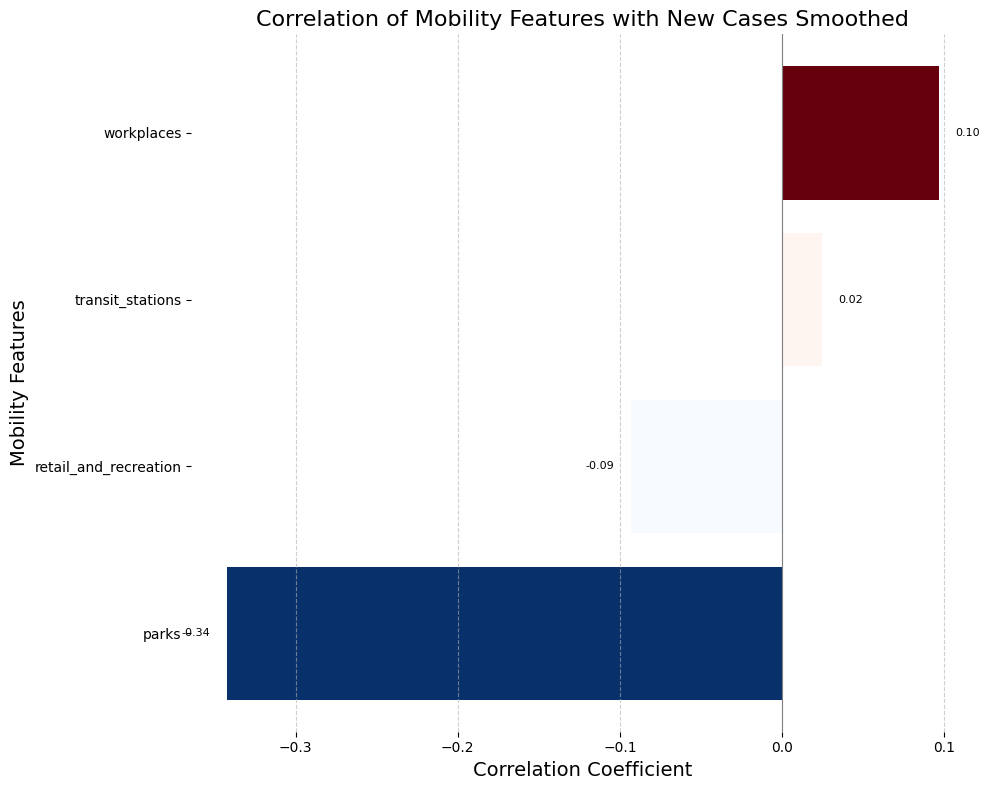

In [18]:
# List of mobility columns (replace with the actual column names from your merged dataset)
mobility_columns = [
    "retail_and_recreation", "transit_stations", "parks", "workplaces"
]

#  Calculate the correlation matrix for these columns and 'new_cases_smoothed'
correlation_matrix = df_covid_full[mobility_columns + ['new_cases_smoothed']].corr()

# Extract the correlations of all mobility features against 'new_cases_smoothed', excluding its own correlation
correlations_with_new_cases = correlation_matrix['new_cases_smoothed'].drop('new_cases_smoothed', axis=0)

# Sort the correlations for visualization clarity
correlations_with_new_cases_sorted = correlations_with_new_cases.sort_values(ascending=True)

# Separate positive and negative correlations for color mapping
positive_corrs = correlations_with_new_cases_sorted[correlations_with_new_cases_sorted >= 0]
negative_corrs = correlations_with_new_cases_sorted[correlations_with_new_cases_sorted < 0]

# Normalize the absolute values of correlations to [0, 1] for both positive and negative
norm_pos_corrs = (positive_corrs - positive_corrs.min()) / (positive_corrs.max() - positive_corrs.min())
norm_neg_corrs = 1 - ((negative_corrs - negative_corrs.min()) / (negative_corrs.max() - negative_corrs.min()))

# Create color maps
pos_cmap = sns.color_palette("Reds", as_cmap=True)
neg_cmap = sns.color_palette("Blues", as_cmap=True)  # Using 'Blues' for correct gradient

# Mapping normalized values to colors
colors_pos = [pos_cmap(x) for x in norm_pos_corrs]
colors_neg = [neg_cmap(x) for x in norm_neg_corrs]

# Combine colors for negative and positive correlations
colors = np.concatenate([colors_neg, colors_pos])

# Plotting
plt.figure(figsize=(10, 8))
bars = plt.barh(np.concatenate([negative_corrs.index, positive_corrs.index]),
                np.concatenate([negative_corrs.values, positive_corrs.values]),
                color=colors)

# Adjusted text positioning
for bar, value in zip(bars, np.concatenate([negative_corrs.values, positive_corrs.values])):
    # Adjust the offset here. Reduce it if it's too far
    offset = 0.01  # Smaller offset for closer text
    if value < 0:
        text_x = value - offset  # Adjust left of the bar for negative values
        ha = 'right'
    else:
        text_x = value + offset  # Adjust right of the bar for positive values
        ha = 'left'
    plt.text(text_x, bar.get_y() + bar.get_height() / 2, f'{value:.2f}',
             va='center', ha=ha, color='black', fontsize=8)

plt.title('Correlation of Mobility Features with New Cases Smoothed', fontsize=16)
plt.xlabel('Correlation Coefficient', fontsize=14)
plt.ylabel('Mobility Features', fontsize=14)
plt.axvline(x=0, color='grey', linewidth=0.8)
plt.grid(axis='x', linestyle='--', alpha=0.6)
sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()


    Temperature data

In [19]:
# Load the dataset, skipping initial non-data lines
temp_data = pd.read_csv('/content/drive/My Drive/Thesis/Data/Etmaalgemiddelde temperatuur Bilt (in 0.1 graden celcius) 01012020-31122022.txt', skiprows=35, usecols=[1, 2], names=['Date', 'average_temperature'], sep=',')

# Convert 'Date' to datetime format
temp_data['Date'] = pd.to_datetime(temp_data['Date'], format='%Y%m%d')

# Convert 'TG' to Celsius (currently in 0.1 degrees Celsius)
temp_data['average_temperature'] = temp_data['average_temperature'] / 10.0

# Filter dates from 27th of February 2020 to 2nd of March 2022
start_date = '2020-02-27'
end_date = '2022-03-02'
temp_data_filtered = temp_data[(temp_data['Date'] >= start_date) & (temp_data['Date'] <= end_date)]

In [20]:
df_covid_full = pd.merge(df_covid_full, temp_data, left_on='date', right_on='Date', how='inner')

# Optionally, you can drop one of the date columns if they're duplicates post-merge
df_covid_full.drop(columns=['Date'], inplace=True)

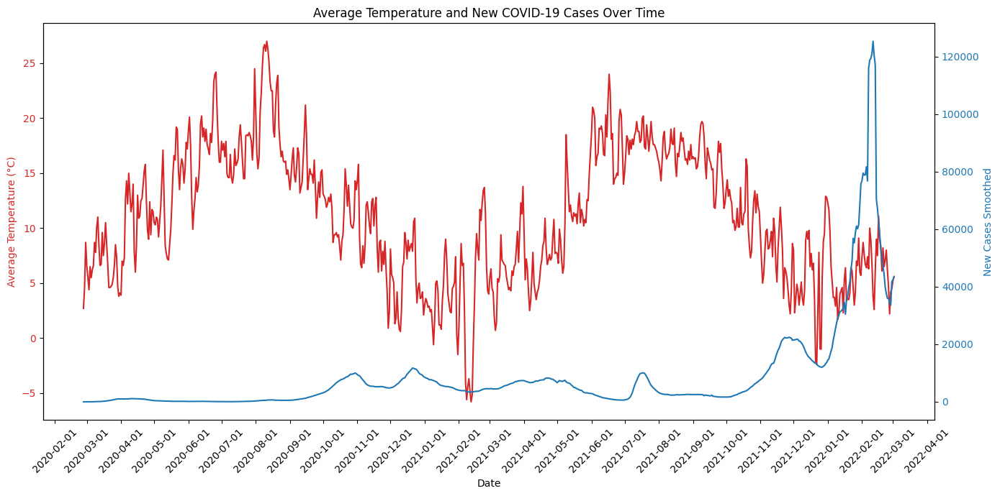

In [21]:
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plotting average temperature
color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('Average Temperature (°C)', color=color)
# Convert data to numpy arrays explicitly
ax1.plot(df_covid_full['date'].values, df_covid_full['average_temperature'].values, color=color, label='Average Temperature')
ax1.tick_params(axis='y', labelcolor=color)
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45)

# Create a second y-axis for the new cases smoothed
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('New Cases Smoothed', color=color)
# Convert data to numpy arrays explicitly
ax2.plot(df_covid_full['date'].values, df_covid_full['new_cases_smoothed'].values, color=color, label='New Cases Smoothed')
ax2.tick_params(axis='y', labelcolor=color)

# Optional: Add a title and adjust layout
plt.title('Average Temperature and New COVID-19 Cases Over Time')
fig.tight_layout()

# Show plot
plt.show()

Correlation

In [22]:
# Calculating the correlation between 'average_temperature' and 'new_cases_smoothed' in the merged DataFrame
correlation_value = df_covid_full[['average_temperature', 'new_cases_smoothed']].corr().iloc[0, 1]
print("Correlation between average temperature and New Cases Smoothed:", correlation_value)

Correlation between average temperature and New Cases Smoothed: -0.31903738725772113


    Google Trends data

In [23]:
# Load Google Trends data
trends_data = pd.read_csv('/content/drive/My Drive/Thesis/Data/Google trends COVID-19 (ziekte) 27022020-02032022.csv', header=1)

# Rename the column for clarity
trends_data.rename(columns={'COVID-19: (Nederland)': 'google_search_index'}, inplace=True)

# Convert the 'Week' column to datetime for compatibility
trends_data['Week'] = pd.to_datetime(trends_data['Week'])

# Assuming the 'date' column in df_covid_full is already in datetime format
# If not, convert 'date' to datetime format
# df_covid_full['date'] = pd.to_datetime(df_covid_full['date'])

# Merge the Google Trends data with the full COVID dataset on the 'date' and 'Week' columns
# Directly merging based on 'date' for demonstration, though typically, more complex alignment might be needed
df_covid_full = pd.merge(df_covid_full, trends_data, left_on='date', right_on='Week', how='left')

# Drop the 'Week' column after merging as it's no longer needed
df_covid_full.drop(columns=['Week'], inplace=True)

# Interpolate the google_search_index column to estimate daily values
df_covid_full['google_search_index'] = df_covid_full['google_search_index'].interpolate(method='linear')

# Handle NaN values at the beginning of the series by forward filling
df_covid_full['google_search_index'] = df_covid_full['google_search_index'].fillna(method='bfill')

# Round the google_search_index values to 3 decimal places
df_covid_full['google_search_index'] = df_covid_full['google_search_index'].round(3)

# Now df_covid_full contains daily data with interpolated Google Trends information
# This dataset is ready for further analysis
df_covid_full

,date,new_cases_smoothed,new_tests_smoothed,tests_units,new_vaccinations_smoothed,year,month,day,day_of_week,day_of_year,...,H3_Contact tracing,H6M_Facial Coverings,H7_Vaccination policy,H8M_Protection of elderly people,retail_and_recreation,transit_stations,parks,workplaces,average_temperature,google_search_index
0,2020-02-27,0,0,0,0,2020,2,27,3,58,...,2,0,0,0.0,5.286,-1.429,4.714,-11.429,2.7,14.000
1,2020-02-28,0,0,0,0,2020,2,28,4,59,...,2,0,0,0.0,4.429,-2.286,3.143,-12.000,4.6,14.000
2,2020-02-29,0,0,0,0,2020,2,29,5,60,...,2,0,0,0.0,3.857,-4.143,2.571,-11.714,8.7,14.000
3,2020-03-01,0,0,0,0,2020,3,1,6,61,...,2,0,0,0.0,4.143,-4.143,6.571,-11.143,6.6,14.000
4,2020-03-02,0,0,0,0,2020,3,2,0,62,...,2,0,0,0.0,2.000,-3.714,4.286,-7.857,5.5,23.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,2022-02-26,34610,54255,1,8441,2022,2,26,5,57,...,2,2,5,2.0,-12.286,-31.000,10.571,-19.714,2.2,41.857
731,2022-02-27,33595,53193,1,7667,2022,2,27,6,58,...,2,2,5,2.0,-7.286,-27.000,27.000,-18.857,4.2,41.000
732,2022-02-28,41796,53110,1,6894,2022,2,28,0,59,...,2,2,5,2.0,-4.429,-26.000,36.143,-19.714,4.5,41.000
733,2022-03-01,42337,54684,1,6120,2022,3,1,1,60,...,2,2,5,2.0,-4.000,-26.000,38.000,-20.571,5.2,41.000


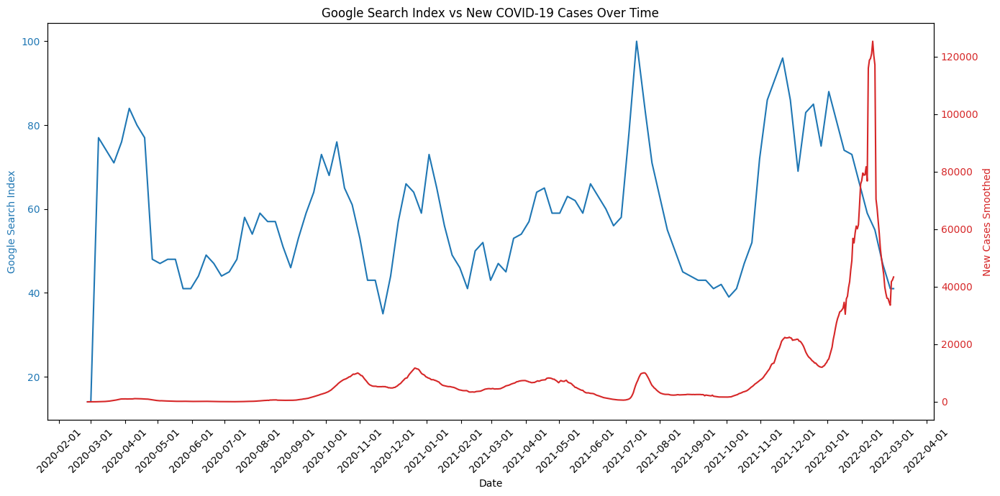

In [24]:
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plotting Google Search Index, convert to NumPy array explicitly
color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('Google Search Index', color=color)
ax1.plot(df_covid_full['date'].values, df_covid_full['google_search_index'].values, color=color, label='Google Search Index')
ax1.tick_params(axis='y', labelcolor=color)

# Formatting the date on the x-axis for better readability
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=45)

# Creating a second y-axis for New Cases Smoothed, convert to NumPy array explicitly
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('New Cases Smoothed', color=color)
ax2.plot(df_covid_full['date'].values, df_covid_full['new_cases_smoothed'].values, color=color, label='New Cases Smoothed')
ax2.tick_params(axis='y', labelcolor=color)

# Optional: Adding a title and adjusting layout
plt.title('Google Search Index vs New COVID-19 Cases Over Time')
fig.tight_layout()

# Showing the plot
plt.show()

In [25]:
correlation_value = df_covid_full['google_search_index'].corr(df_covid_full['new_cases_smoothed'])
print("Correlation between Google Search Index and New Cases Smoothed:", correlation_value)

Correlation between Google Search Index and New Cases Smoothed: 0.17102727072592117


    # Variants data

In [26]:
# Loading and initial processing of the variant data
variant_data = pd.read_csv("/content/drive/My Drive/Thesis/Data/aandeel-van-de-meest-fre.csv", delimiter=';')
variant_data['Date'] = pd.to_datetime(variant_data['Category'] + '-1', format='%G-W%V-%u')
variant_data.drop('Category', axis=1, inplace=True)
variant_data.rename(columns={'other': 'no_variant'}, inplace=True)
variant_data.rename(columns={col: f"variant_{col}" for col in variant_data.columns if col != 'Date'}, inplace=True)

# Creating a daily date range and preparing for the merge
start_date, end_date = variant_data['Date'].min(), variant_data['Date'].max()
all_days = pd.date_range(start=start_date, end=end_date, freq='D')
daily_variant_data = pd.DataFrame({'Date': all_days})
variant_data.sort_values('Date', inplace=True)
variant_data.ffill(inplace=True)

# Merging and forward-filling to propagate weekly data to daily
daily_variant_data = pd.merge(daily_variant_data, variant_data, how='left', on='Date')
daily_variant_data.ffill(inplace=True)

# Extending dataset backwards to February 27, 2020, with specific initializations
new_start_date = pd.Timestamp('2020-02-27')
additional_days = pd.date_range(start=new_start_date, end=daily_variant_data['Date'].min() - pd.Timedelta(days=1), freq='D')
additional_data = pd.DataFrame({'Date': additional_days})
for col in daily_variant_data.columns:
    if col != 'Date':
        additional_data[col] = 0.00
additional_data['variant_no_variant'] = 100.00

# Combining the additional data with the original dataset
daily_variant_data = pd.concat([additional_data, daily_variant_data]).sort_values(by='Date').reset_index(drop=True)
daily_variant_data = daily_variant_data[daily_variant_data['Date'] <= pd.Timestamp('2022-03-02')]

# Filtering columns with values greater than 0
columns_to_keep = ['Date'] + [col for col in daily_variant_data.columns if col != 'Date' and daily_variant_data[col].max() > 0]
daily_variant_data = daily_variant_data[columns_to_keep]

daily_variant_data

,Date,variant_no_variant,variant_B.1.1.7,variant_B.1.351,variant_P.1,variant_B.1.617.2,variant_BA.1,variant_BA.2,variant_BA.5
0,2020-02-27,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
1,2020-02-28,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
2,2020-02-29,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
3,2020-03-01,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
4,2020-03-02,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...
730,2022-02-26,0.18,0.0,0.0,0.0,0.0,47.15,52.61,0.06
731,2022-02-27,0.18,0.0,0.0,0.0,0.0,47.15,52.61,0.06
732,2022-02-28,0.11,0.0,0.0,0.0,0.0,29.07,70.82,0.00
733,2022-03-01,0.11,0.0,0.0,0.0,0.0,29.07,70.82,0.00


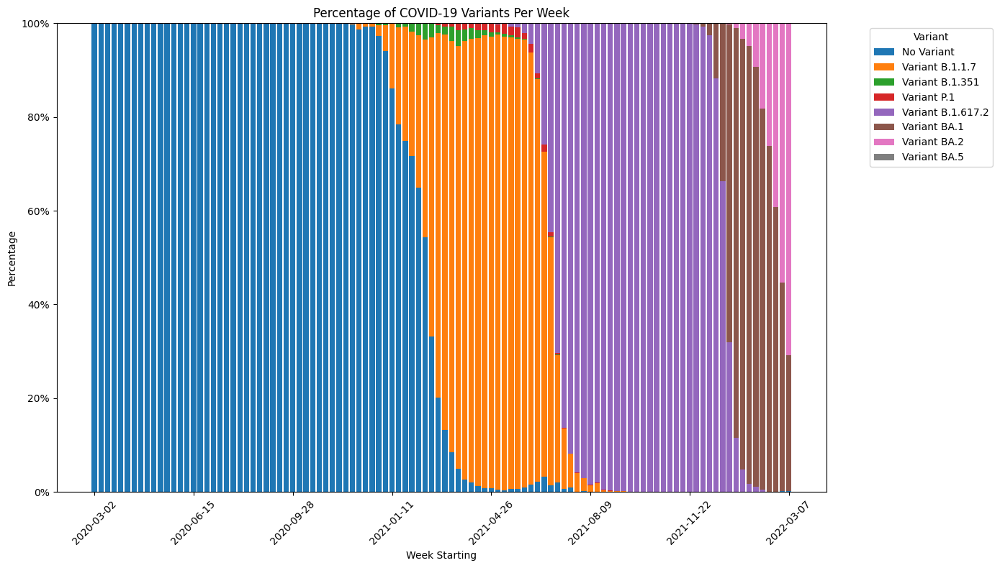

In [27]:
# Customize legend labels
legend_labels = {
    'variant_no_variant': 'No Variant',
    'variant_B.1.1.7': 'Variant B.1.1.7',
    'variant_B.1.351': 'Variant B.1.351',
    'variant_P.1': 'Variant P.1',
    'variant_B.1.617.2': 'Variant B.1.617.2',
    'variant_BA.1': 'Variant BA.1',
    'variant_BA.2': 'Variant BA.2',
    'variant_BA.5': 'Variant BA.5'
}

# Resample to weekly data, assuming the week starts on Monday
weekly_data = daily_variant_data.resample('W-Mon', on='Date').mean()

# Prepare the data for plotting
weekly_data.index = weekly_data.index.strftime('%Y-%m-%d')  # Format the week start date as string for x-axis labels

# Plotting
fig, ax = plt.subplots(figsize=(14, 8))

# Bottom parameter for stacking
bottom_value = None

# Iterate through the DataFrame's columns to create stacked bars
for column in weekly_data.columns:
    if column != 'Date':
        ax.bar(weekly_data.index, weekly_data[column], bottom=bottom_value, label=legend_labels.get(column, column))
        bottom_value = weekly_data[column] if bottom_value is None else bottom_value + weekly_data[column]

# Customize the plot
ax.set_title('Percentage of COVID-19 Variants Per Week')
ax.set_xlabel('Week Starting')
ax.set_ylabel('Percentage')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())  # Adjust y-axis to show percentage
ax.legend(title='Variant', bbox_to_anchor=(1.05, 1), loc='upper left')

# Improve readability of x-axis labels
plt.xticks(rotation=45)  # Rotate dates for better readability
ax.xaxis.set_major_locator(plt.MaxNLocator(10))  # Limit the number of x-axis labels to make them readable

plt.tight_layout()  # Adjust layout
plt.show()

In [28]:
df_covid_full = pd.merge(df_covid_full, daily_variant_data, left_on='date', right_on='Date', how='inner')

# Optionally, you can drop one of the date columns if they're duplicates post-merge
df_covid_full.drop(columns=['Date'], inplace=True)

print(df_covid_full.info())
df_covid_full

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 735 entries, 0 to 734
Data columns (total 41 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   date                                   735 non-null    datetime64[ns]
 1   new_cases_smoothed                     735 non-null    int64         
 2   new_tests_smoothed                     735 non-null    int64         
 3   tests_units                            735 non-null    int64         
 4   new_vaccinations_smoothed              735 non-null    int64         
 5   year                                   735 non-null    int32         
 6   month                                  735 non-null    int32         
 7   day                                    735 non-null    int32         
 8   day_of_week                            735 non-null    int32         
 9   day_of_year                            735 non-null    int32     

,date,new_cases_smoothed,new_tests_smoothed,tests_units,new_vaccinations_smoothed,year,month,day,day_of_week,day_of_year,...,average_temperature,google_search_index,variant_no_variant,variant_B.1.1.7,variant_B.1.351,variant_P.1,variant_B.1.617.2,variant_BA.1,variant_BA.2,variant_BA.5
0,2020-02-27,0,0,0,0,2020,2,27,3,58,...,2.7,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
1,2020-02-28,0,0,0,0,2020,2,28,4,59,...,4.6,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
2,2020-02-29,0,0,0,0,2020,2,29,5,60,...,8.7,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
3,2020-03-01,0,0,0,0,2020,3,1,6,61,...,6.6,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
4,2020-03-02,0,0,0,0,2020,3,2,0,62,...,5.5,23.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,2022-02-26,34610,54255,1,8441,2022,2,26,5,57,...,2.2,41.857,0.18,0.0,0.0,0.0,0.0,47.15,52.61,0.06
731,2022-02-27,33595,53193,1,7667,2022,2,27,6,58,...,4.2,41.000,0.18,0.0,0.0,0.0,0.0,47.15,52.61,0.06
732,2022-02-28,41796,53110,1,6894,2022,2,28,0,59,...,4.5,41.000,0.11,0.0,0.0,0.0,0.0,29.07,70.82,0.00
733,2022-03-01,42337,54684,1,6120,2022,3,1,1,60,...,5.2,41.000,0.11,0.0,0.0,0.0,0.0,29.07,70.82,0.00


**ALL TOGETHER**

In [29]:
df_covid_full.set_index('date', inplace=True)

In [30]:
df_covid_full

,new_cases_smoothed,new_tests_smoothed,tests_units,new_vaccinations_smoothed,year,month,day,day_of_week,day_of_year,new_cases_smoothed_lagged_14,...,average_temperature,google_search_index,variant_no_variant,variant_B.1.1.7,variant_B.1.351,variant_P.1,variant_B.1.617.2,variant_BA.1,variant_BA.2,variant_BA.5
date,,,,,,,,,,,,,,,,,,,,,
2020-02-27,0,0,0,0,2020,2,27,3,58,0,...,2.7,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
2020-02-28,0,0,0,0,2020,2,28,4,59,0,...,4.6,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
2020-02-29,0,0,0,0,2020,2,29,5,60,0,...,8.7,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
2020-03-01,0,0,0,0,2020,3,1,6,61,0,...,6.6,14.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
2020-03-02,0,0,0,0,2020,3,2,0,62,0,...,5.5,23.000,100.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-26,34610,54255,1,8441,2022,2,26,5,57,120360,...,2.2,41.857,0.18,0.0,0.0,0.0,0.0,47.15,52.61,0.06
2022-02-27,33595,53193,1,7667,2022,2,27,6,58,117130,...,4.2,41.000,0.18,0.0,0.0,0.0,0.0,47.15,52.61,0.06
2022-02-28,41796,53110,1,6894,2022,2,28,0,59,70433,...,4.5,41.000,0.11,0.0,0.0,0.0,0.0,29.07,70.82,0.00


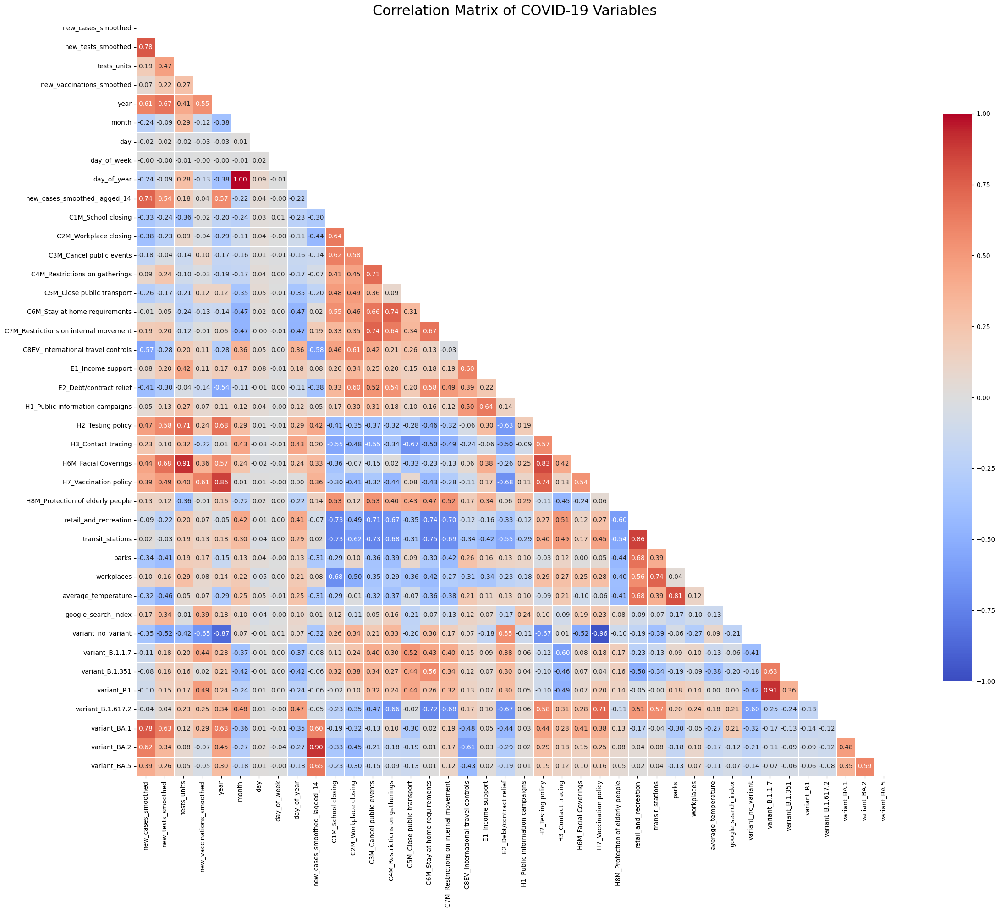

In [31]:
# Calculate the correlation matrix
correlation_matrix = df_covid_full.corr()

# Increase the figure size for better visibility
plt.figure(figsize=(25, 20))  # Adjusted size

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Generate a heatmap with the mask, using an optimized colormap and annotations
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .75}, annot=True, fmt=".2f",
            annot_kws={"size": 10})  # Adjusted cmap, annot size, and cbar_kws

# Rotate labels for better readability and adjust font size for clarity
plt.xticks(rotation=90, fontsize=10)  # Adjusted rotation and font size
plt.yticks(rotation=0, fontsize=10)  # Adjusted rotation and font size

# Add title with adjusted font size
plt.title('Correlation Matrix of COVID-19 Variables', fontsize=22)

# Adjust layout for better fit and display the plot
plt.tight_layout()
plt.show()


In [32]:
df_covid_full.to_csv('/content/drive/My Drive/Thesis/Output/covid_data_full.csv', index=False)

#### Making 8 different datasets

In [33]:
# Calculate the total number of rows for each group
rows_per_group = [105, 210, 315, 420, 525, 630, 735]  # 735 rows in total

# Initialize an empty list to hold the dataframes
grouped_dataframes = []

# Use the rows_per_group to slice df_covid_full and create each group
for i, rows in enumerate(rows_per_group):
    # Slice the DataFrame up to the current number of rows
    current_group_df = df_covid_full.iloc[:rows, :].copy()

    # Append the sliced DataFrame to the list
    grouped_dataframes.append(current_group_df)

# Assigning each DataFrame to a variable for easier reference
group2_full_covid_data = grouped_dataframes[1]
group3_full_covid_data = grouped_dataframes[2]
group4_full_covid_data = grouped_dataframes[3]
group5_full_covid_data = grouped_dataframes[4]
group6_full_covid_data = grouped_dataframes[5]
group7_full_covid_data = grouped_dataframes[6]

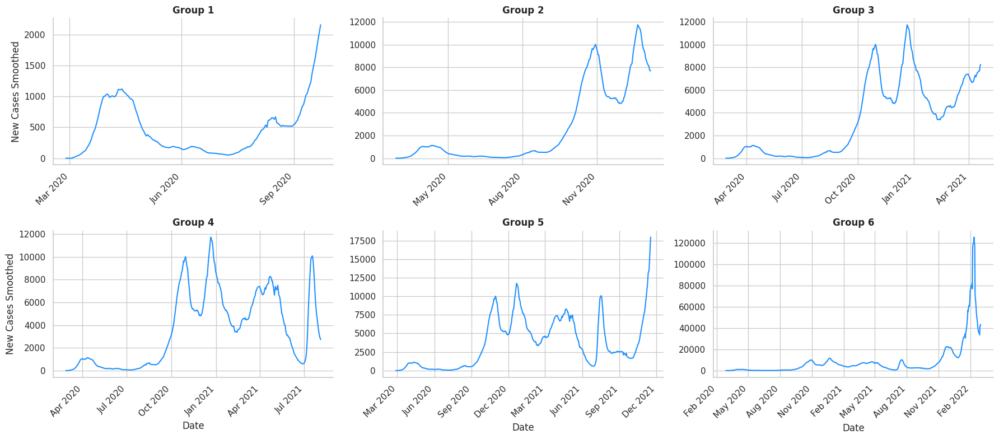

In [34]:
# Combine the datasets into one DataFrame with an additional 'Group' column
df_list = [
    group2_full_covid_data, group3_full_covid_data,
    group4_full_covid_data, group5_full_covid_data, group6_full_covid_data,
    group7_full_covid_data
]

# Create a new list to hold DataFrames with 'Group' column
df_list_with_group = []
for i, df in enumerate(df_list, start=1):
    df_with_group = df.copy()  # Make a copy to avoid modifying original DataFrames
    df_with_group['Group'] = f'Group {i}'  # Add 'Group' column
    df_list_with_group.append(df_with_group)

# Concatenate all DataFrames into a single DataFrame for plotting
combined_df_for_plotting = pd.concat(df_list_with_group)

# Assuming 'date' is set as the index and is in the datetime format
# If not, convert it here:
# combined_df_for_plotting['date'] = pd.to_datetime(combined_df_for_plotting['date'], format='%Y-%m-%d')
# combined_df_for_plotting.set_index('date', inplace=True)

# Plotting setup
sns.set(style="whitegrid")

# Create the FacetGrid object, now using the fact that 'date' is the index
g = sns.FacetGrid(combined_df_for_plotting, col='Group', col_wrap=3, height=4, aspect=1.5, sharex=False, sharey=False)

# Define a plot function that will be used in the FacetGrid
def plot_func(data, **kwargs):
    # Access the data passed as a tuple if necessary, this is assuming 'new_cases_smoothed' exists in the data
    ax = plt.gca()  # Get the current axes in the grid
    ax.plot(data.index, data['new_cases_smoothed'], marker='', **kwargs)

# Map the plot function with correct arguments
g.map_dataframe(plot_func, color='dodgerblue')

# Set additional plot parameters
g.set_titles("{col_name}", fontweight='bold', fontsize=14)
g.set_axis_labels("Date", "New Cases Smoothed")

# Customize the FacetGrid, adjust date formatting and rotation
for ax in g.axes.flatten():
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# Adjust tight layout to avoid clipping of labels
plt.tight_layout()

# Show the plot
plt.show()

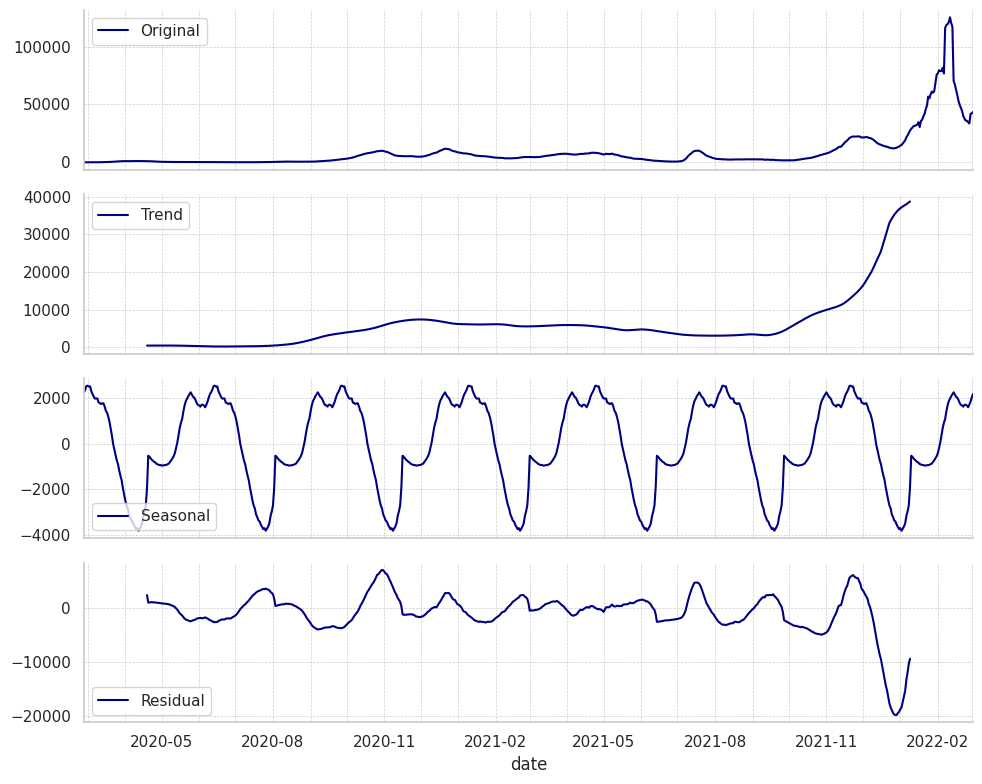

In [35]:
# Copy the original DataFrame
df_covid_full_decomposition = df_covid_full.copy()

# Decompose the 'new_cases_smoothed' time series with a 105-day period
decompose_result = seasonal_decompose(df_covid_full_decomposition['new_cases_smoothed'], model='additive', period = 105)

# Set the color for all plots to match the example
color = 'navy'

# Define subplot grid
fig, ax = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

# Original data
decompose_result.observed.plot(ax=ax[0], color=color, label='Original')
ax[0].legend()

# Trend
decompose_result.trend.plot(ax=ax[1], color=color, label='Trend')
ax[1].legend()

# Seasonal
decompose_result.seasonal.plot(ax=ax[2], color=color, label='Seasonal')
ax[2].legend()

# Residual
decompose_result.resid.plot(ax=ax[3], color=color, label='Residual')
ax[3].legend()

# Set the x-axis major locator to every 3 months and formatter for the date
ax[3].xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax[3].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Set grid, tight layout, and display the plot
for a in ax:
    a.grid(True, which='both', linestyle='--', linewidth=0.5)
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

## ARIMA

In [ ]:
# # Prepare the data
# df_covid_full_ARIMA = df_covid_full.copy()

# # Excluding the target variable and non-numeric columns if present
# exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
# df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# # Constants
# initial_day = 106
# days_per_period = 105
# total_days = 735
# num_periods = (total_days - initial_day + 1) // days_per_period

# # Initialize evaluation metrics DataFrame
# eval_df = pd.DataFrame(columns=['Period', 'MAE', 'RMSE', 'MAPE'])

# # Setup figure for subplot grid
# fig, axes = plt.subplots(nrows=(num_periods + 1) // 2, ncols=2, figsize=(21, 7 * num_periods // 2))
# axes = axes.flatten()  # Flatten the array for easy iteration

# # Iterate through each period
# for period in range(num_periods):
#     print(f"\n--- Forecast for Period {period+1} ---")

#     # Define period range
#     start_idx = initial_day - 1 + period * days_per_period
#     end_idx = start_idx + days_per_period
#     train = df_covid_full_ARIMA.iloc[:start_idx]
#     test = df_covid_full_ARIMA.iloc[start_idx:end_idx]

#     if train['new_cases_smoothed'].dropna().empty or test['new_cases_smoothed'].dropna().empty:
#         print("Skipping period due to insufficient data.")
#         continue

#     # Auto ARIMA to find the best parameters dynamically
#     model = auto_arima(train['new_cases_smoothed'], exogenous=train[exog_variables],
#                        seasonal=False, trace=True,
#                        error_action='ignore', suppress_warnings=True,
#                        stepwise=True)

#     # Fit ARIMA Model with the best parameters found
#     order = model.get_params()['order']
#     arima_model = ARIMA(train['new_cases_smoothed'], exog=train[exog_variables],
#                         order=order)
#     results = arima_model.fit()

#     # Dynamic forecasting
#     exog_forecast = test[exog_variables]  # Exogenous variables for the test period
#     forecast = results.get_forecast(steps=len(test), exog=exog_forecast)
#     forecast_series = forecast.predicted_mean

#     # Evaluation
#     mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
#     rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
#     mape = np.mean(np.abs((test['new_cases_smoothed'] - forecast_series) / test['new_cases_smoothed'])) * 100

#     new_row = pd.DataFrame({'Period': [period+1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})
#     eval_df = pd.concat([eval_df, new_row], ignore_index=True)

#     # Plotting
#     ax = axes[period]
#     ax.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
#     ax.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
#     ax.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
#     ax.set_title(f'Forecast vs Actuals for Period {period+1}')
#     ax.legend()

# # Adjust layout and display the plots
# plt.tight_layout()
# plt.show()

# # Display evaluation metrics
# print(eval_df)

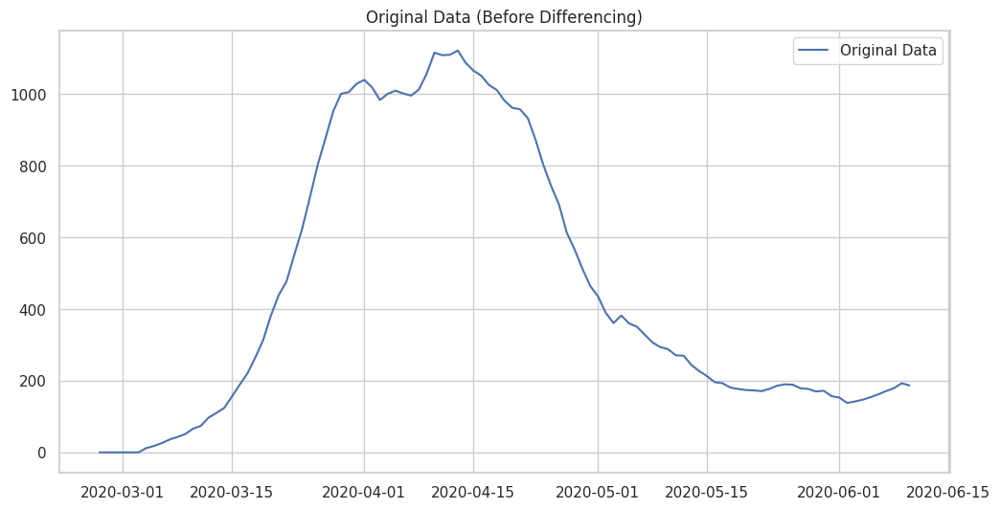

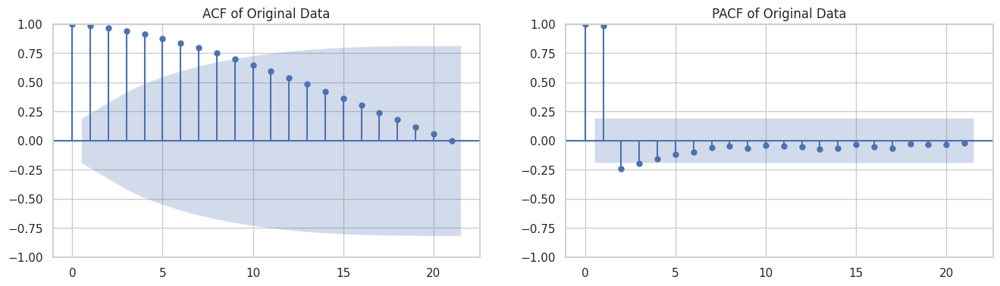

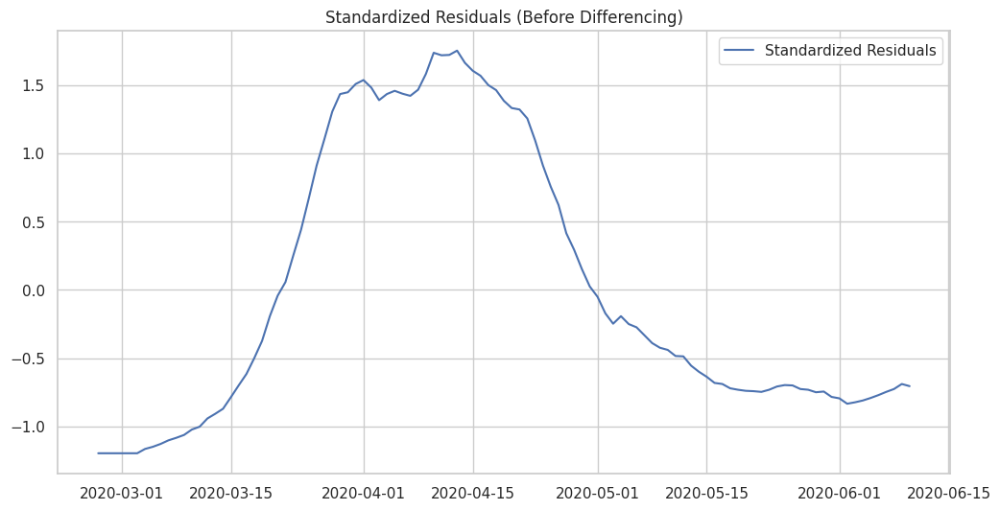

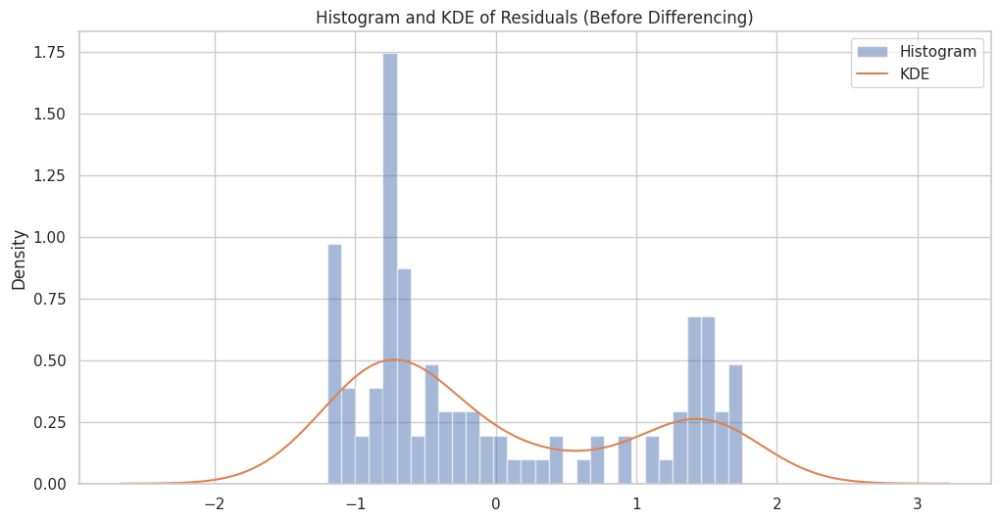

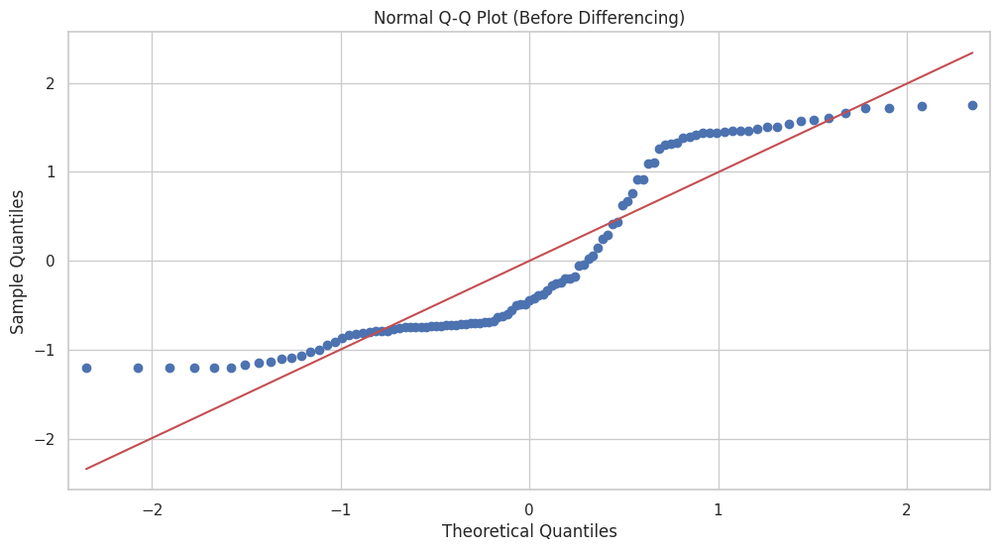

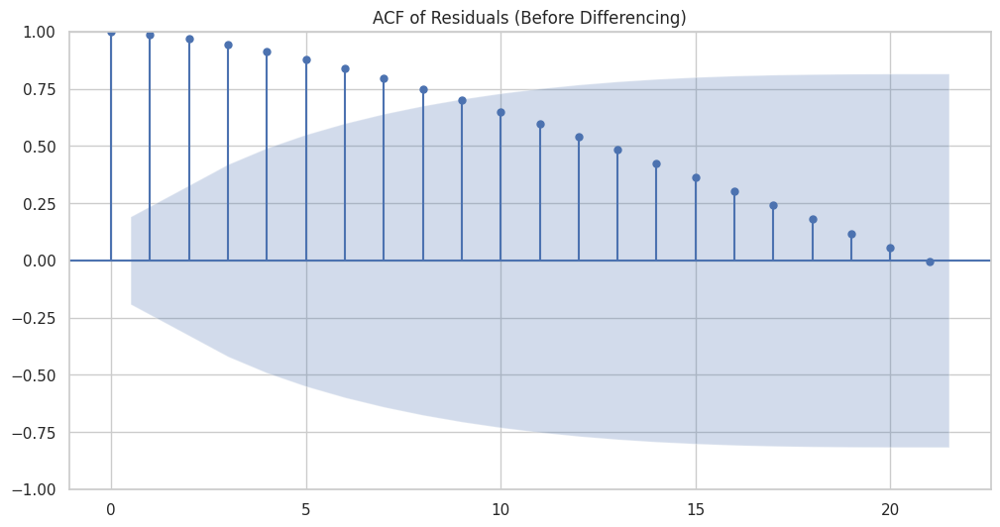

<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 1 differencing.


<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-42-081ab8088a23>:82: Sett

The series has become constant after 0 differencing.


<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-42-081ab8088a23>:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=871.823, Time=0.92 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=876.738, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=872.677, Time=0.12 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=869.936, Time=0.26 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=874.739, Time=0.06 sec
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=871.681, Time=0.89 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=871.273, Time=1.34 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=871.837, Time=1.23 sec
 ARIMA(0,2,1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


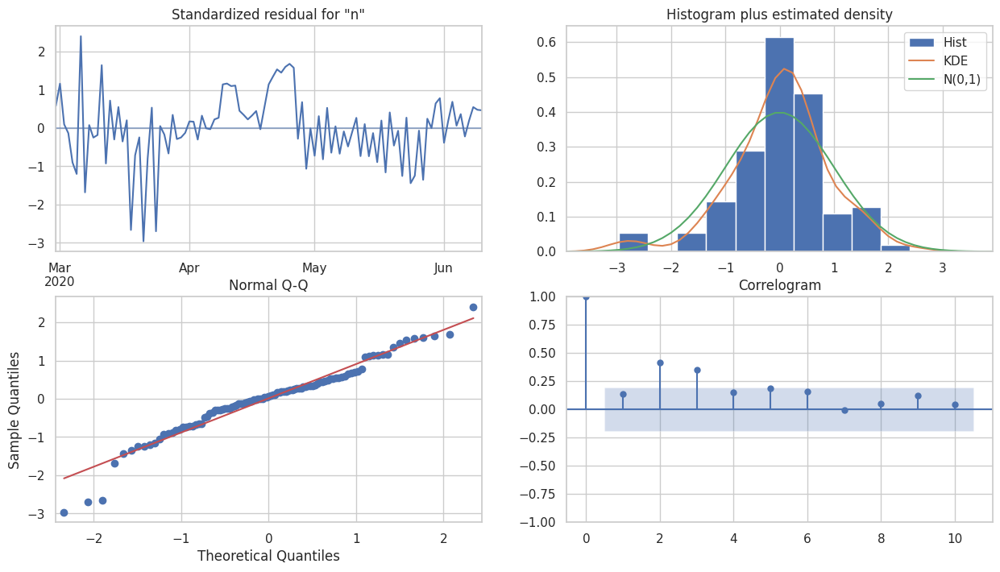

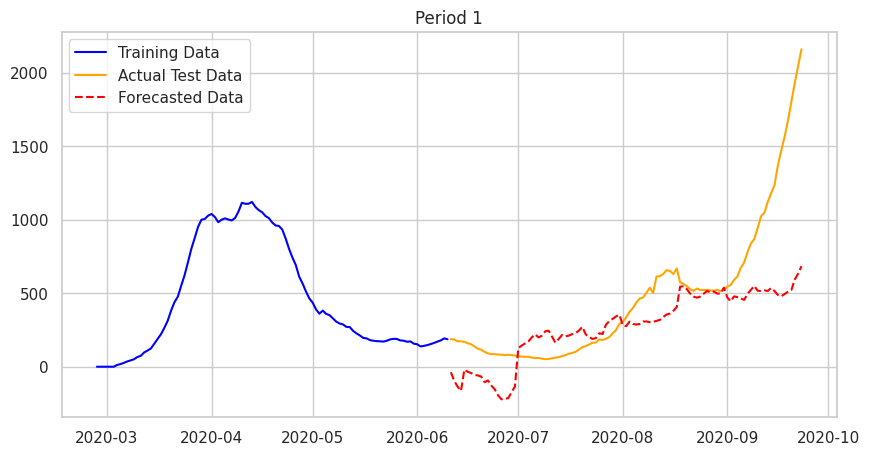

   Period         MAE       RMSE       MAPE
0       1  254.111423  399.43124  99.170999


In [42]:
# Function to check stationarity
def check_stationarity(timeseries):
    try:
        result = adfuller(timeseries.dropna())
        return result[1] <= 0.05  # p-value <= 0.05 indicates stationarity
    except:
        return False  # Handle cases where the series is constant or too short

# Function to difference the data until it is stationary
def make_stationary(timeseries):
    d = 0
    while not check_stationarity(timeseries):
        if timeseries.nunique() == 1:
            # If the series becomes constant, stop differencing
            print(f"The series has become constant after {d} differencing.")
            break
        timeseries = timeseries.diff().dropna()
        d += 1
    return timeseries, d

# Prepare the data
df_covid_full_ARIMA = group2_full_covid_data.copy()

# Excluding the target variable and non-numeric columns if present
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Plotting original data before differencing
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['new_cases_smoothed'], label='Original Data')
plt.title('Original Data (Before Differencing)')
plt.legend()
plt.show()

# ACF and PACF plots for original data
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
plot_acf(train['new_cases_smoothed'].dropna(), ax=ax[0], title='ACF of Original Data')
plot_pacf(train['new_cases_smoothed'].dropna(), ax=ax[1], title='PACF of Original Data')
plt.show()

# Standardized Residuals
residuals = train['new_cases_smoothed'] - train['new_cases_smoothed'].mean()
standardized_residuals = residuals / residuals.std()
plt.figure(figsize=(12, 6))
plt.plot(standardized_residuals, label='Standardized Residuals')
plt.title('Standardized Residuals (Before Differencing)')
plt.legend()
plt.show()

# Histogram plus KDE
plt.figure(figsize=(12, 6))
standardized_residuals.plot(kind='hist', density=True, bins=30, alpha=0.5, label='Histogram')
standardized_residuals.plot(kind='kde', label='KDE')
plt.title('Histogram and KDE of Residuals (Before Differencing)')
plt.legend()
plt.show()

# Q-Q Plot
plt.figure(figsize=(12, 6))
qqplot(standardized_residuals, line='s', ax=plt.gca())
plt.title('Normal Q-Q Plot (Before Differencing)')
plt.show()

# ACF Plot of Residuals
plt.figure(figsize=(12, 6))
plot_acf(standardized_residuals.dropna(), ax=plt.gca(), title='ACF of Residuals (Before Differencing)')
plt.show()

# Make the training data stationary if necessary
train_stationary, d_target = make_stationary(train['new_cases_smoothed'])

# Make exogenous variables stationary if necessary
d_exog = {}
for var in exog_variables:
    train[var], d_exog[var] = make_stationary(train[var])

# Adjust exogenous variables for differencing
max_d = max([d_target] + list(d_exog.values()))
exog_train = train[exog_variables].iloc[max_d:]
train_stationary = train_stationary.iloc[max_d:]  # Ensure the same length and index

# Remove constant columns from exog_train
exog_train = exog_train.loc[:, (exog_train != exog_train.iloc[0]).any()]

# Ensure exog_test has the same columns as exog_train
exog_test = test[exog_train.columns]

# Check if there's enough data to train and test
if train_stationary.dropna().empty or test['new_cases_smoothed'].dropna().empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train_stationary, exogenous=exog_train,
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'].iloc[max_d:], exog=exog_train, order=(order[0], d_target, order[2]))
    results = arima_model.fit()

    # Diagnostic plots after fitting ARIMA
    results.plot_diagnostics(figsize=(15, 8))
    plt.show()

    # Dynamic forecasting
    forecast = results.get_forecast(steps=len(test), exog=exog_test)
    forecast_series = forecast.predicted_mean

    # Evaluation
    mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
    rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
    mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

    # Initialize evaluation metrics DataFrame
    eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
    plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
    plt.title('Period 1')
    plt.legend()
    plt.show()

    # Display evaluation metrics
    print(eval_df)


Period 2

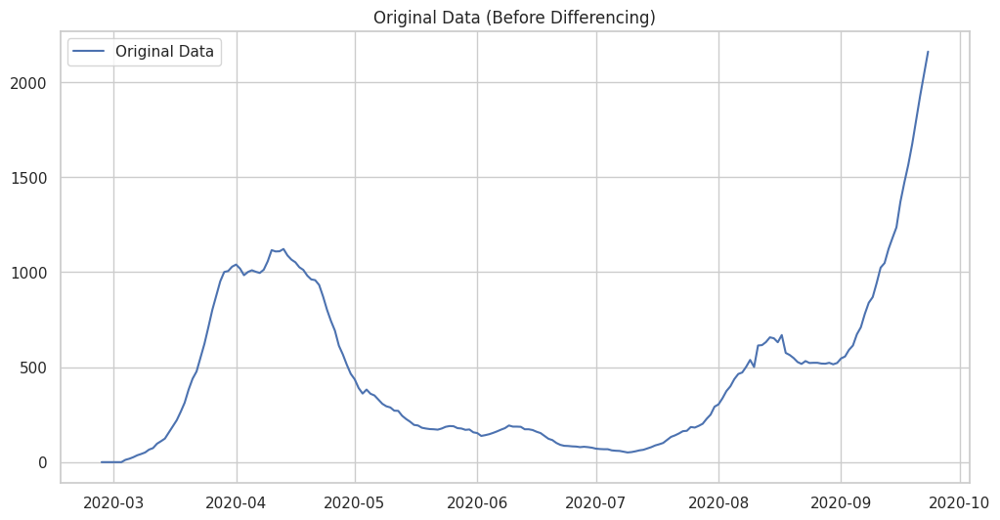

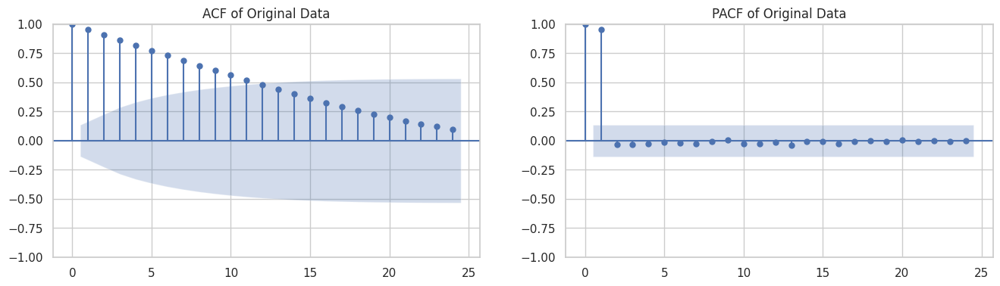

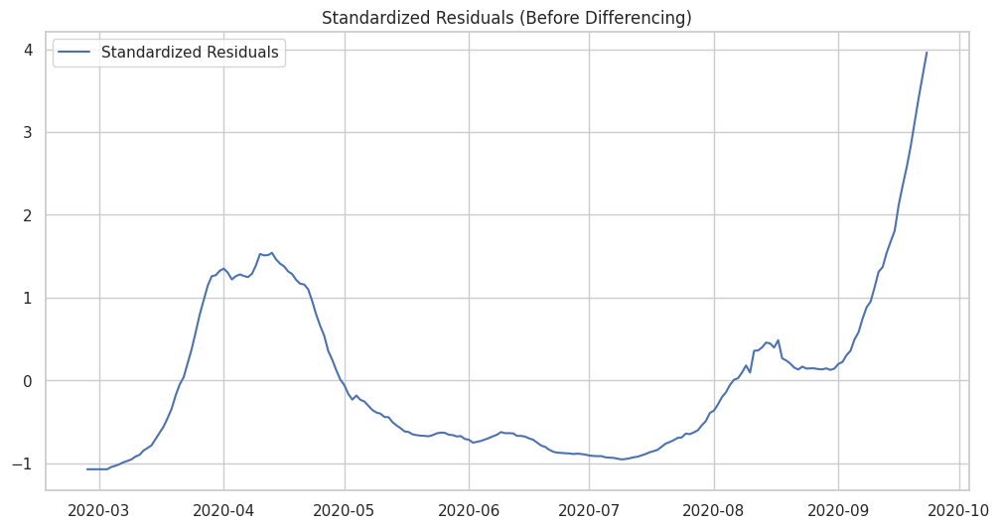

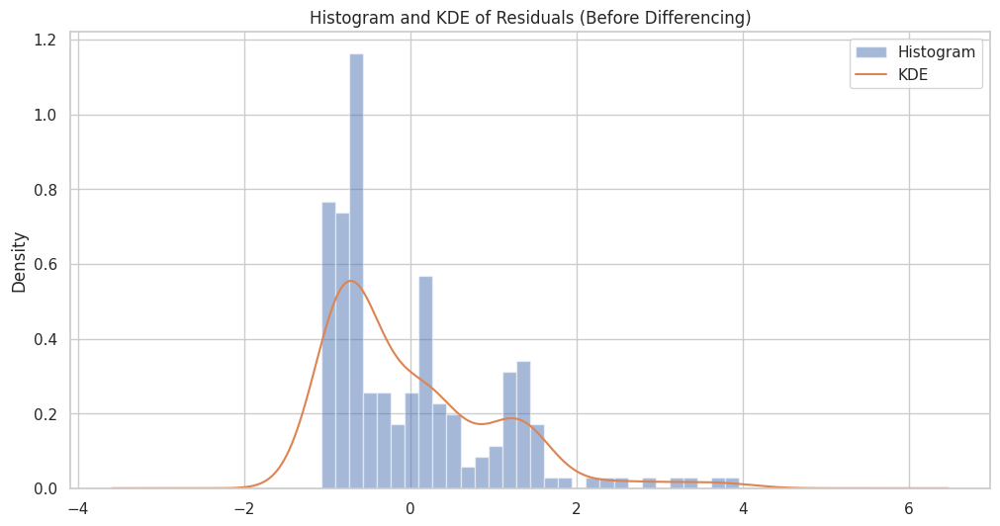

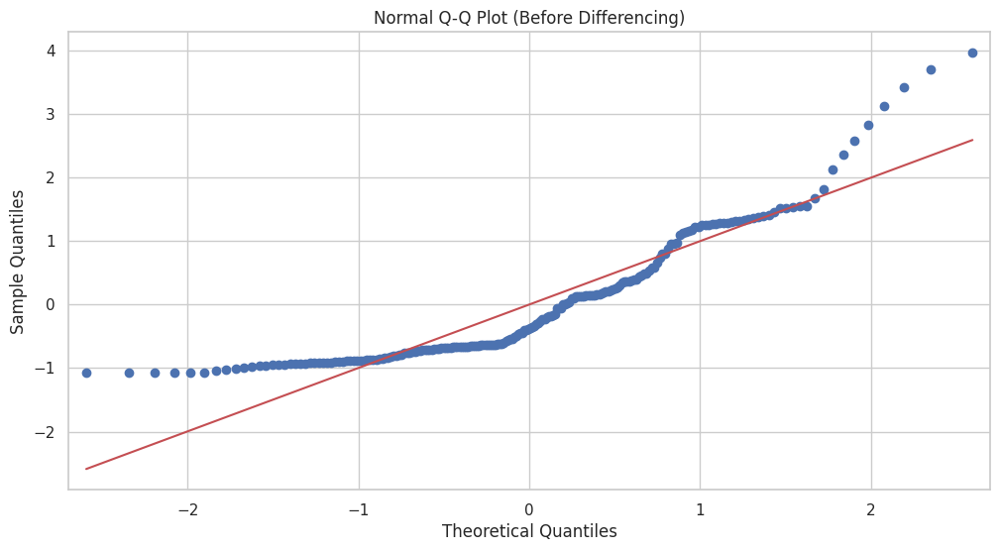

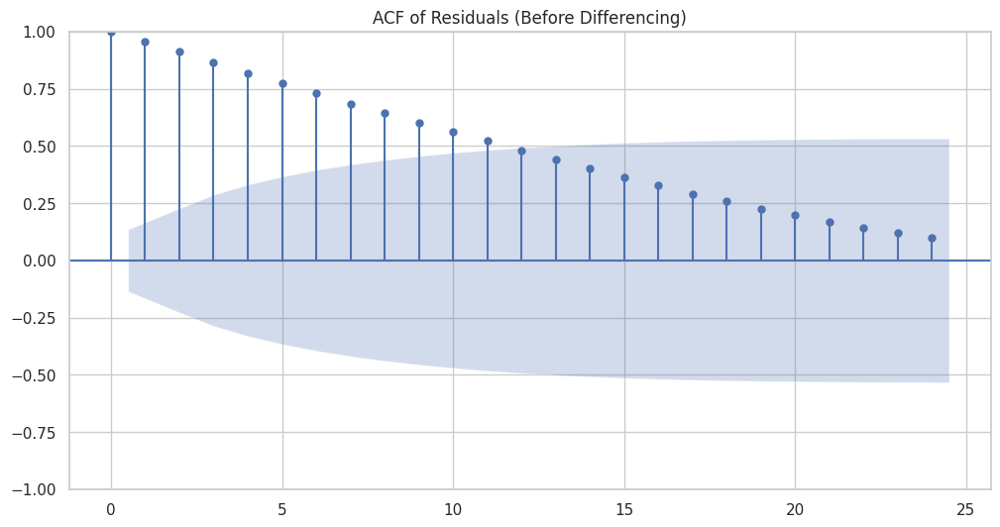

<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.


<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
<ipython-input-43-ce4bf07e52f9>:62: Sett

The series has become constant after 1 differencing.


<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
<ipython-input-43-ce4bf07e52f9>:62: Sett

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.


<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-43-ce4bf07e52f9>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1821.419, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1916.617, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1847.067, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1838.635, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1824.291, Time=0.34 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1821.553, Time=0.27 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=1783.209, Time=1.68 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=1822.105, Time=0.93 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=1782.796, Time=2.13 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=1811.451, Time=0.99 sec
 ARIMA(5,0,2)(0,0,0)[0]             : AIC=1814.432, Time=0.39 sec
 ARIMA(4,0,3)(0,0,0)[0]             : AIC=inf, Time=1.41 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=1.29 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=1809.639, Time=0.62 sec
 ARIMA(5,0,3)(0,0,0)[0]             : AIC=1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using

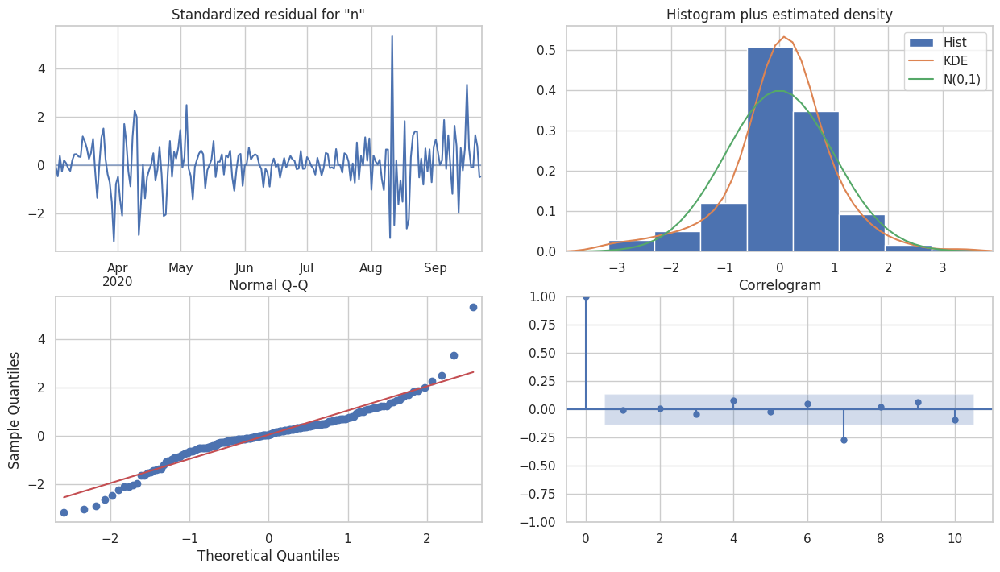

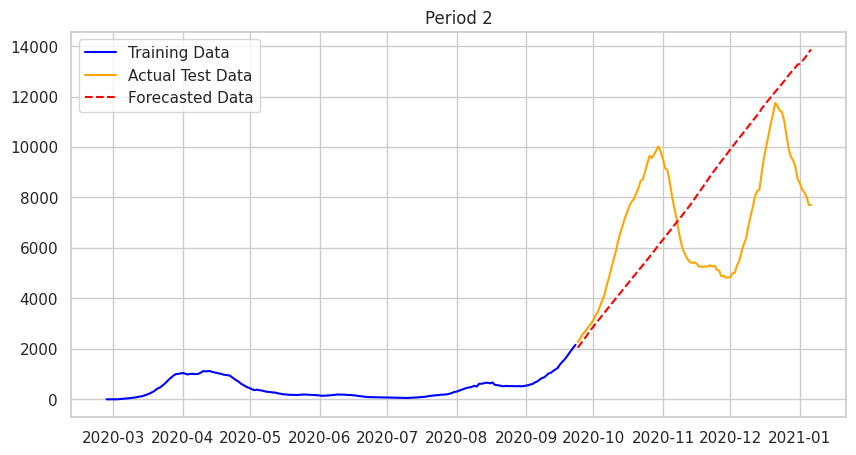

   Period          MAE         RMSE       MAPE
0       1  2730.681973  3154.879588  40.854669


In [43]:
# Prepare the data
df_covid_full_ARIMA = group3_full_covid_data.copy()

# Excluding the target variable and non-numeric columns if present
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Plotting original data before differencing
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['new_cases_smoothed'], label='Original Data')
plt.title('Original Data (Before Differencing)')
plt.legend()
plt.show()

# ACF and PACF plots for original data
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
plot_acf(train['new_cases_smoothed'].dropna(), ax=ax[0], title='ACF of Original Data')
plot_pacf(train['new_cases_smoothed'].dropna(), ax=ax[1], title='PACF of Original Data')
plt.show()

# Standardized Residuals
residuals = train['new_cases_smoothed'] - train['new_cases_smoothed'].mean()
standardized_residuals = residuals / residuals.std()
plt.figure(figsize=(12, 6))
plt.plot(standardized_residuals, label='Standardized Residuals')
plt.title('Standardized Residuals (Before Differencing)')
plt.legend()
plt.show()

# Histogram plus KDE
plt.figure(figsize=(12, 6))
standardized_residuals.plot(kind='hist', density=True, bins=30, alpha=0.5, label='Histogram')
standardized_residuals.plot(kind='kde', label='KDE')
plt.title('Histogram and KDE of Residuals (Before Differencing)')
plt.legend()
plt.show()

# Q-Q Plot
plt.figure(figsize=(12, 6))
qqplot(standardized_residuals, line='s', ax=plt.gca())
plt.title('Normal Q-Q Plot (Before Differencing)')
plt.show()

# ACF Plot of Residuals
plt.figure(figsize=(12, 6))
plot_acf(standardized_residuals.dropna(), ax=plt.gca(), title='ACF of Residuals (Before Differencing)')
plt.show()

# Make the training data stationary if necessary
train_stationary, d_target = make_stationary(train['new_cases_smoothed'])

# Make exogenous variables stationary if necessary
d_exog = {}
for var in exog_variables:
    train[var], d_exog[var] = make_stationary(train[var])

# Adjust exogenous variables for differencing
max_d = max([d_target] + list(d_exog.values()))
exog_train = train[exog_variables].iloc[max_d:]
train_stationary = train_stationary.iloc[max_d:]  # Ensure the same length and index

# Remove constant columns from exog_train
exog_train = exog_train.loc[:, (exog_train != exog_train.iloc[0]).any()]

# Ensure exog_test has the same columns as exog_train
exog_test = test[exog_train.columns]

# Check if there's enough data to train and test
if train_stationary.dropna().empty or test['new_cases_smoothed'].dropna().empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train_stationary, exogenous=exog_train,
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'].iloc[max_d:], exog=exog_train, order=(order[0], d_target, order[2]))
    results = arima_model.fit()

    # Diagnostic plots after fitting ARIMA
    results.plot_diagnostics(figsize=(15, 8))
    plt.show()

    # Dynamic forecasting
    forecast = results.get_forecast(steps=len(test), exog=exog_test)
    forecast_series = forecast.predicted_mean

    # Evaluation
    mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
    rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
    mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

    # Initialize evaluation metrics DataFrame
    eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
    plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
    plt.title('Period 2')
    plt.legend()
    plt.show()

    # Display evaluation metrics
    print(eval_df)


Period 3

<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.


<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.


<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.


<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-44-dbbef732f5d6>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-481.744, Time=1.60 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-381.721, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-431.565, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-413.491, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-484.846, Time=1.00 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-433.355, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-485.693, Time=0.49 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-484.492, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-451.744, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-484.558, Time=1.07 sec

Best model:  ARIMA(1,0,1)(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using

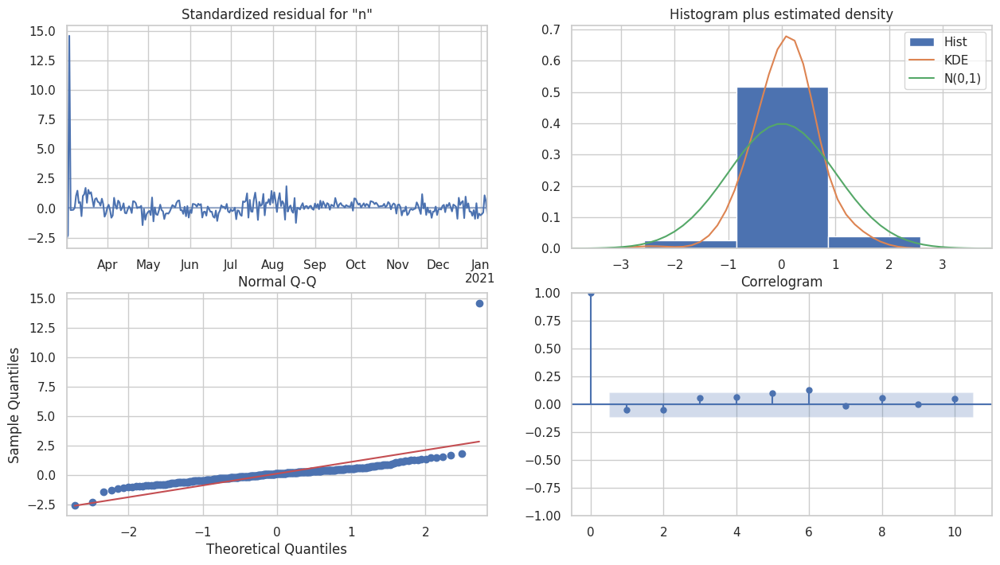

No valid samples to evaluate.


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: overflow encountered in expm1
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [44]:
# Prepare the data
df_covid_full_ARIMA = group4_full_covid_data.copy()

# Replace zero or negative values with a small positive value for log transformation
df_covid_full_ARIMA['new_cases_smoothed'] = df_covid_full_ARIMA['new_cases_smoothed'].replace(0, 1)
df_covid_full_ARIMA['new_cases_smoothed'] = df_covid_full_ARIMA['new_cases_smoothed'].apply(lambda x: x if x > 0 else 1)
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])
for var in exog_variables:
    df_covid_full_ARIMA[var] = df_covid_full_ARIMA[var].replace(0, 1)
    df_covid_full_ARIMA[var] = df_covid_full_ARIMA[var].apply(lambda x: x if x > 0 else 1)

# Apply log transformation to stabilize variance
df_covid_full_ARIMA['new_cases_smoothed'] = np.log1p(df_covid_full_ARIMA['new_cases_smoothed'])
for var in exog_variables:
    df_covid_full_ARIMA[var] = np.log1p(df_covid_full_ARIMA[var])

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Make the training data stationary if necessary
train_stationary, d_target = make_stationary(train['new_cases_smoothed'])

# Make exogenous variables stationary if necessary
d_exog = {}
for var in exog_variables:
    train[var], d_exog[var] = make_stationary(train[var])

# Adjust exogenous variables for differencing
max_d = max([d_target] + list(d_exog.values()))
exog_train = train[exog_variables].iloc[max_d:].copy()
train_stationary = train_stationary.iloc[max_d:].copy()  # Ensure the same length and index

# Check for and handle any remaining NaNs or infinite values
exog_train = exog_train.replace([np.inf, -np.inf], np.nan).dropna()
train_stationary = train_stationary.replace([np.inf, -np.inf], np.nan).dropna()
test = test.replace([np.inf, -np.inf], np.nan).dropna(subset=['new_cases_smoothed'] + list(exog_variables))

# Check if there's enough data to train and test
if train_stationary.empty or test['new_cases_smoothed'].empty or exog_train.empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train_stationary, exogenous=exog_train,
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'].iloc[max_d:], exog=exog_train, order=(order[0], d_target, order[2]))
    results = arima_model.fit()

    # Diagnostic plots
    results.plot_diagnostics(figsize=(15, 8))
    plt.show()

    # Dynamic forecasting
    forecast = results.get_forecast(steps=len(test), exog=test[exog_variables])
    forecast_series = forecast.predicted_mean

    # Inverse log transformation
    forecast_series = np.expm1(forecast_series)
    test['new_cases_smoothed'] = np.expm1(test['new_cases_smoothed'])

    # Check for and handle any infinities or excessively large values
    forecast_series = forecast_series.replace([np.inf, -np.inf], np.nan).dropna()
    test = test.replace([np.inf, -np.inf], np.nan).dropna(subset=['new_cases_smoothed'])

    # Ensure the forecast and actual data are aligned
    common_idx = forecast_series.index.intersection(test.index)
    forecast_series = forecast_series[common_idx]
    actual_series = test['new_cases_smoothed'][common_idx]

    # Ensure there are samples to evaluate
    if forecast_series.empty or actual_series.empty:
        print("No valid samples to evaluate.")
    else:
        # Evaluation
        mae = mean_absolute_error(actual_series, forecast_series)
        rmse = np.sqrt(mean_squared_error(actual_series, forecast_series))
        mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

        # Initialize evaluation metrics DataFrame
        eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

        # Plotting
        plt.figure(figsize=(10, 5))
        plt.plot(train.index, np.expm1(train['new_cases_smoothed']), label='Training Data', color='blue')
        plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
        plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
        plt.title('Period 3')
        plt.legend()
        plt.show()

        # Display evaluation metrics
        print(eval_df)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3707.975, Time=2.29 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=4097.450, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3725.536, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3917.918, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=4102.397, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3709.126, Time=0.69 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3709.144, Time=1.27 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=3657.063, Time=2.20 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=3709.671, Time=0.74 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=3658.275, Time=2.07 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3667.833, Time=1.47 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=3697.163, Time=1.65 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=3663.966, Time=3.79 sec
 ARIMA(3,1,2)(0,0,0)[0]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


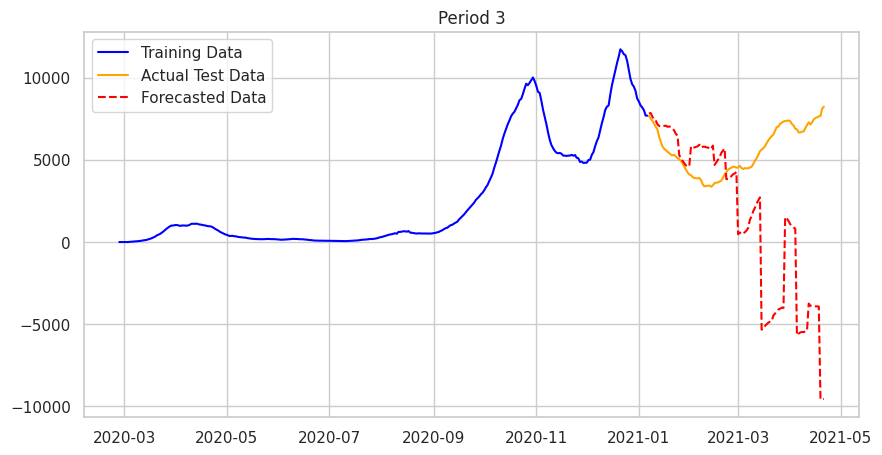

   Period          MAE         RMSE       MAPE
0       1  5025.370806  7008.275556  81.231674


In [45]:
# Prepare the data
df_covid_full_ARIMA = group4_full_covid_data.copy()

# Excluding the target variable and non-numeric columns if present
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Check if there's enough data to train and test
if train['new_cases_smoothed'].dropna().empty or test['new_cases_smoothed'].dropna().empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train['new_cases_smoothed'], exogenous=train[exog_variables],
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'], exog=train[exog_variables], order=order)
    results = arima_model.fit()

    # Dynamic forecasting
    exog_forecast = test[exog_variables]  # Exogenous variables for the test period
    forecast = results.get_forecast(steps=len(test), exog=exog_forecast)
    forecast_series = forecast.predicted_mean

    # Evaluation
    mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
    rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
    mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

    # Initialize evaluation metrics DataFrame
    eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
    plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
    plt.title('Period 3')
    plt.legend()
    plt.show()

    # Display evaluation metrics
    print(eval_df)

Period 4

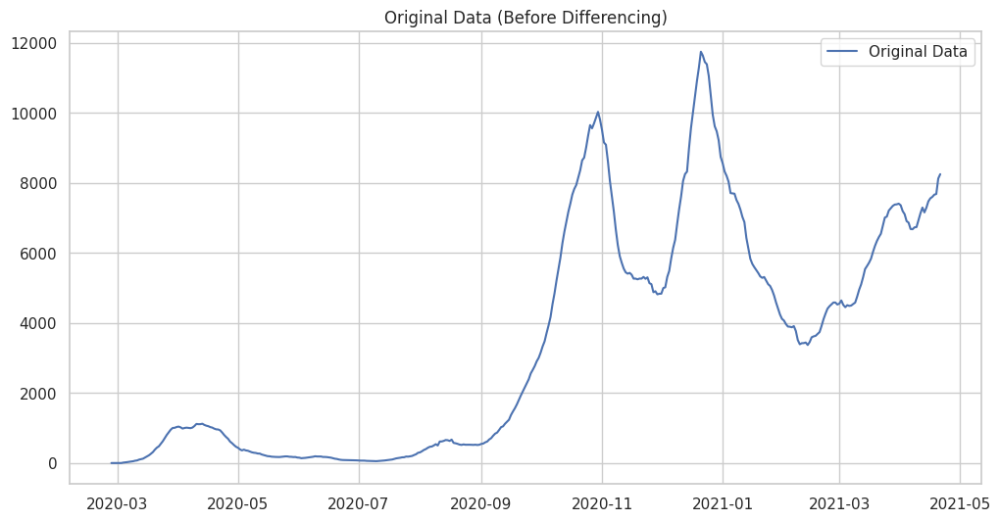

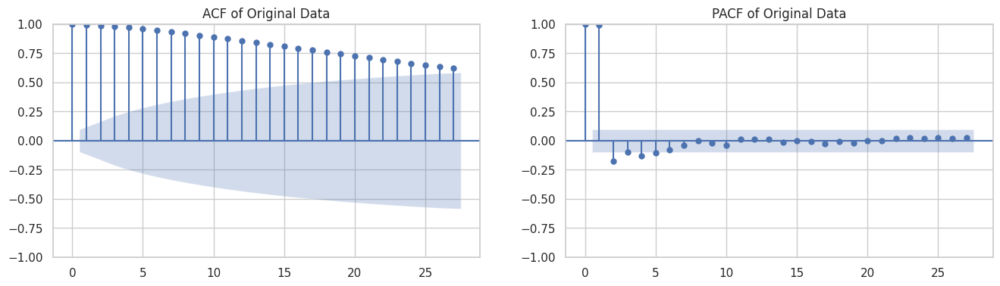

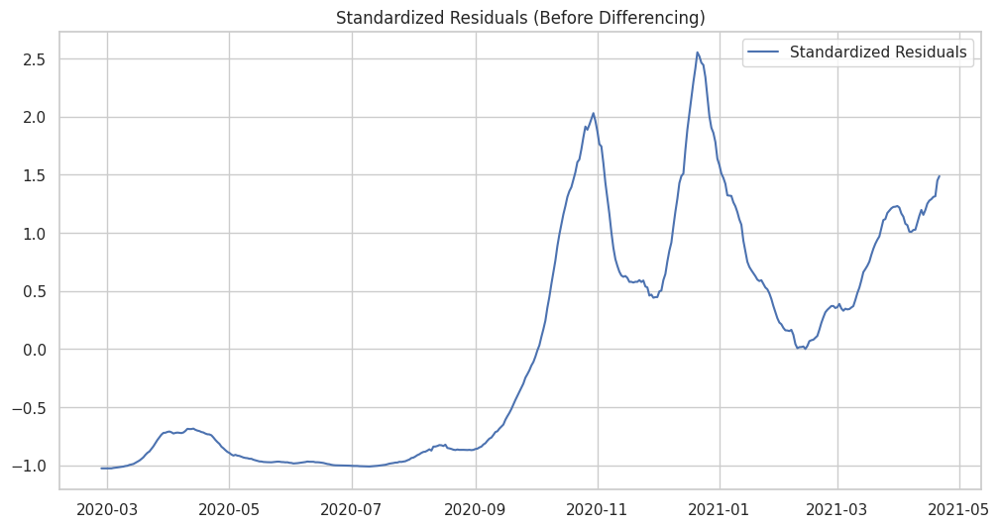

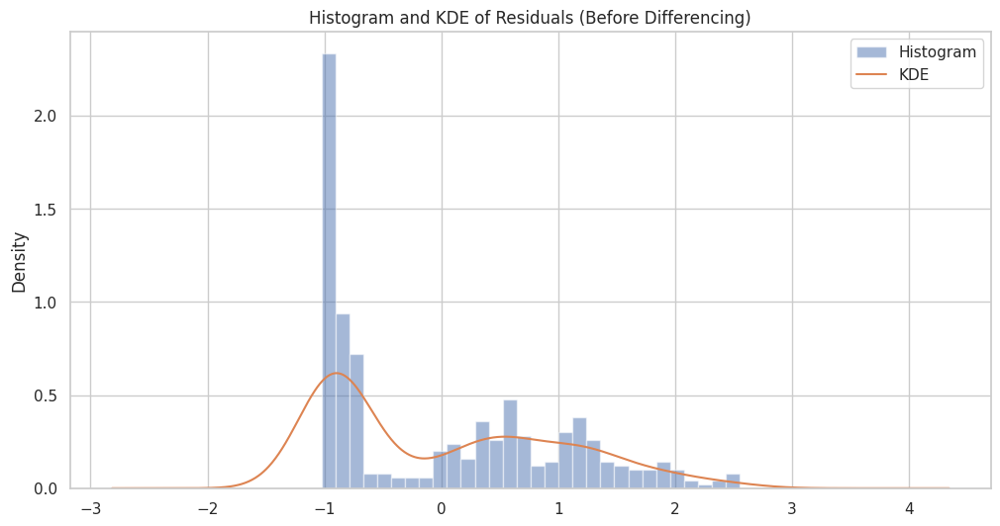

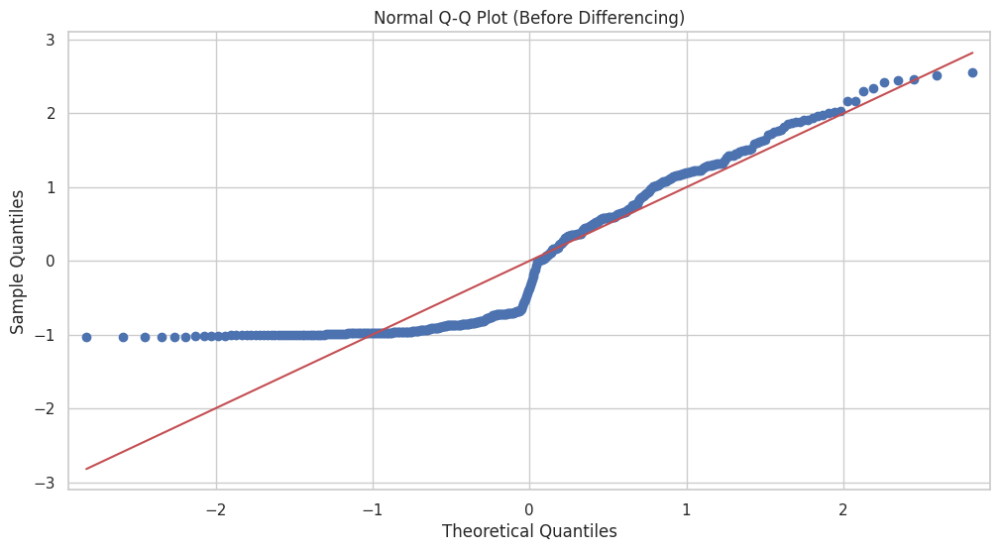

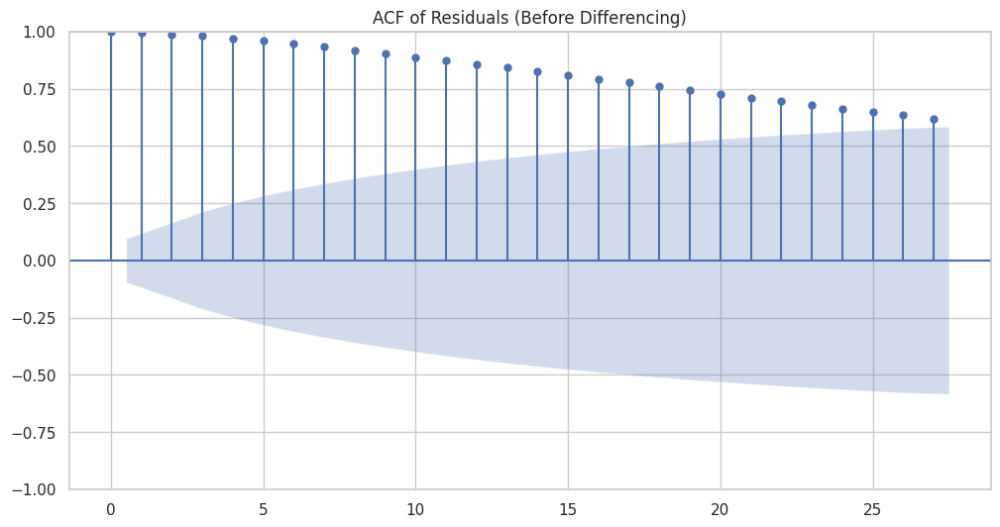

<ipython-input-46-7241cbdb0916>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-46-7241cbdb0916>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-46-7241cbdb0916>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=4935.116, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=5418.281, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4973.720, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=5192.255, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=4946.854, Time=0.49 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4946.862, Time=0.27 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=4948.405, Time=0.95 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=4944.855, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=4929.982, Time=0.18 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=5054.944, Time=0.29 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=4896.594, Time=0.41 sec
 ARIMA(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


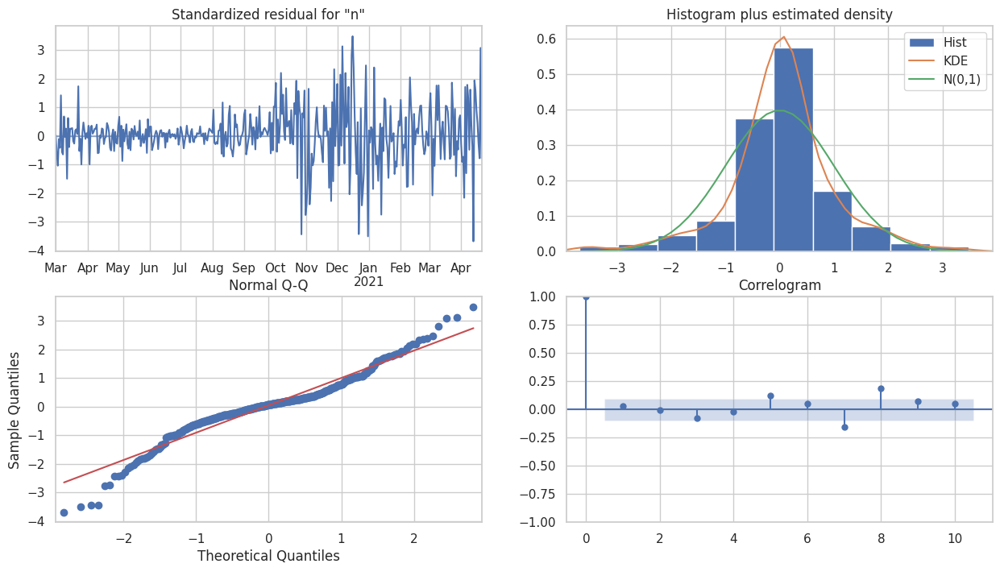

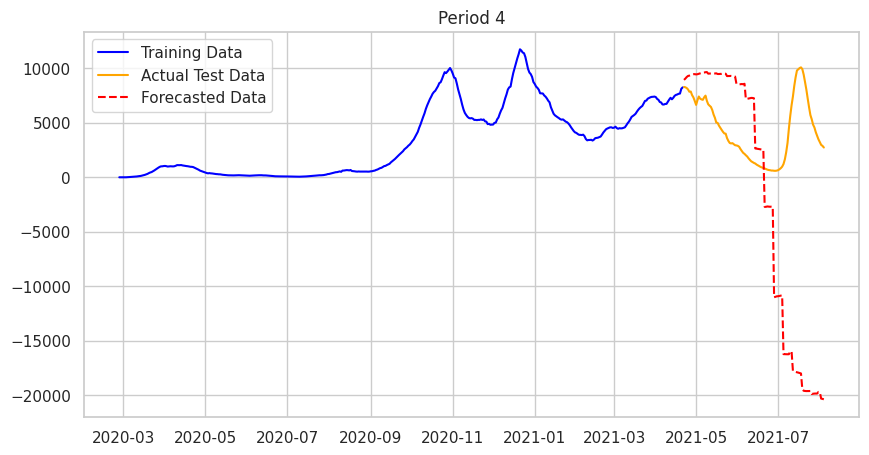

   Period           MAE          RMSE        MAPE
0       1  10410.131542  14142.526377  378.384473


In [46]:
# Prepare the data
df_covid_full_ARIMA = group5_full_covid_data.copy()

# Excluding the target variable and non-numeric columns if present
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Plotting original data before differencing
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['new_cases_smoothed'], label='Original Data')
plt.title('Original Data (Before Differencing)')
plt.legend()
plt.show()

# ACF and PACF plots for original data
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
plot_acf(train['new_cases_smoothed'].dropna(), ax=ax[0], title='ACF of Original Data')
plot_pacf(train['new_cases_smoothed'].dropna(), ax=ax[1], title='PACF of Original Data')
plt.show()

# Standardized Residuals
residuals = train['new_cases_smoothed'] - train['new_cases_smoothed'].mean()
standardized_residuals = residuals / residuals.std()
plt.figure(figsize=(12, 6))
plt.plot(standardized_residuals, label='Standardized Residuals')
plt.title('Standardized Residuals (Before Differencing)')
plt.legend()
plt.show()

# Histogram plus KDE
plt.figure(figsize=(12, 6))
standardized_residuals.plot(kind='hist', density=True, bins=30, alpha=0.5, label='Histogram')
standardized_residuals.plot(kind='kde', label='KDE')
plt.title('Histogram and KDE of Residuals (Before Differencing)')
plt.legend()
plt.show()

# Q-Q Plot
plt.figure(figsize=(12, 6))
qqplot(standardized_residuals, line='s', ax=plt.gca())
plt.title('Normal Q-Q Plot (Before Differencing)')
plt.show()

# ACF Plot of Residuals
plt.figure(figsize=(12, 6))
plot_acf(standardized_residuals.dropna(), ax=plt.gca(), title='ACF of Residuals (Before Differencing)')
plt.show()

# Make the training data stationary if necessary
train_stationary, d_target = make_stationary(train['new_cases_smoothed'])

# Make exogenous variables stationary if necessary
d_exog = {}
for var in exog_variables:
    train[var], d_exog[var] = make_stationary(train[var])

# Adjust exogenous variables for differencing
max_d = max([d_target] + list(d_exog.values()))
exog_train = train[exog_variables].iloc[max_d:]
train_stationary = train_stationary.iloc[max_d:]  # Ensure the same length and index

# Remove constant columns from exog_train
exog_train = exog_train.loc[:, (exog_train != exog_train.iloc[0]).any()]

# Ensure exog_test has the same columns as exog_train
exog_test = test[exog_train.columns]

# Check if there's enough data to train and test
if train_stationary.dropna().empty or test['new_cases_smoothed'].dropna().empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train_stationary, exogenous=exog_train,
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'].iloc[max_d:], exog=exog_train, order=(order[0], d_target, order[2]))
    results = arima_model.fit()

    # Diagnostic plots after fitting ARIMA
    results.plot_diagnostics(figsize=(15, 8))
    plt.show()

    # Dynamic forecasting
    forecast = results.get_forecast(steps=len(test), exog=exog_test)
    forecast_series = forecast.predicted_mean

    # Evaluation
    mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
    rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
    mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

    # Initialize evaluation metrics DataFrame
    eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
    plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
    plt.title('Period 4')
    plt.legend()
    plt.show()

    # Display evaluation metrics
    print(eval_df)


Period 5

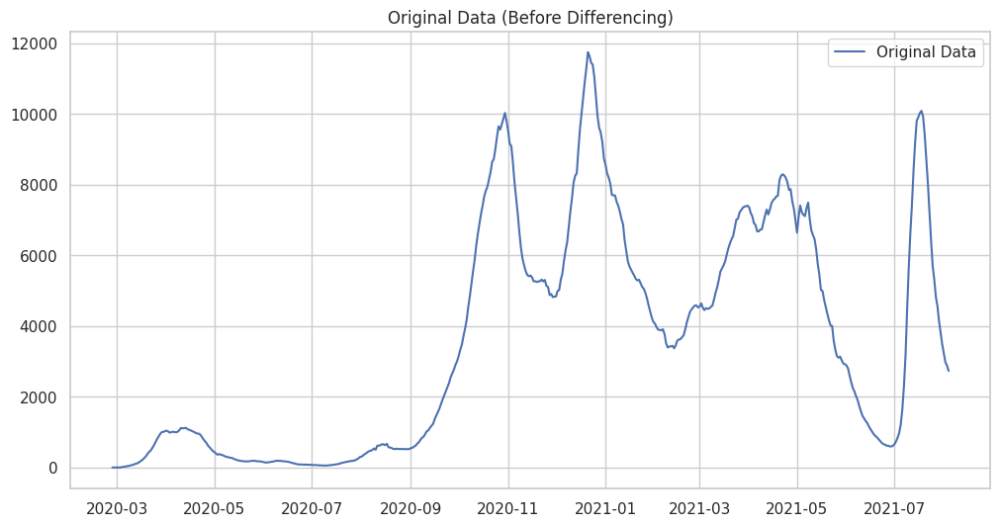

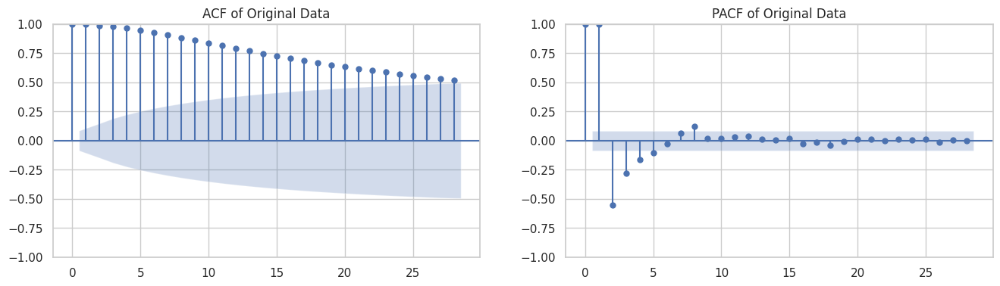

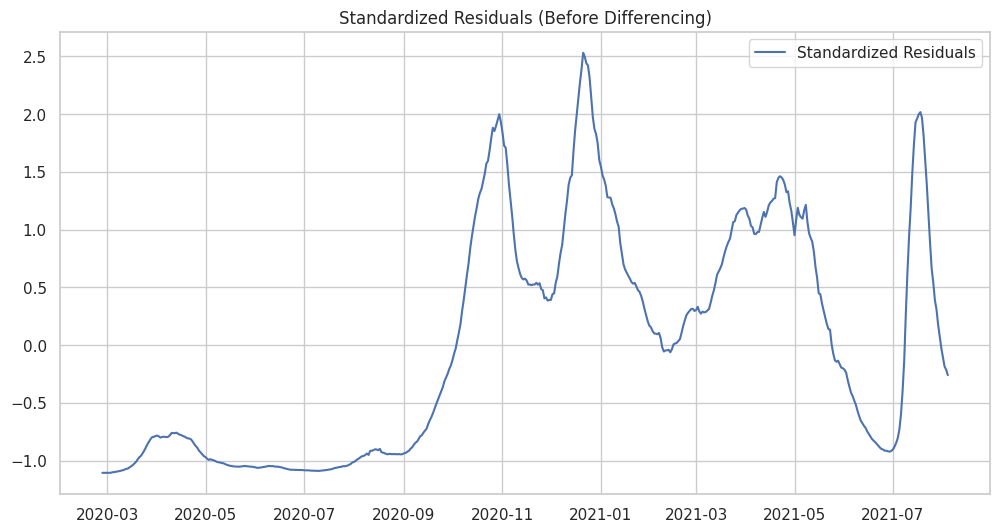

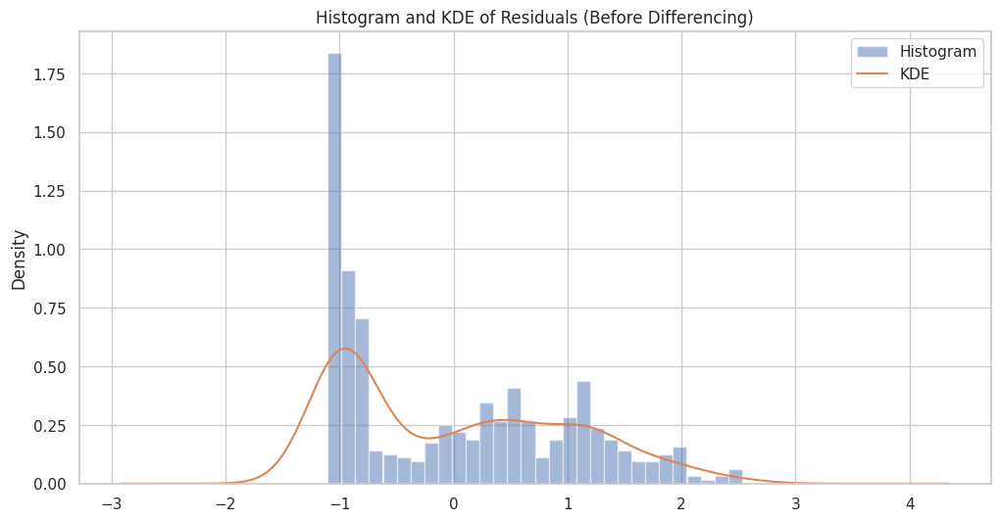

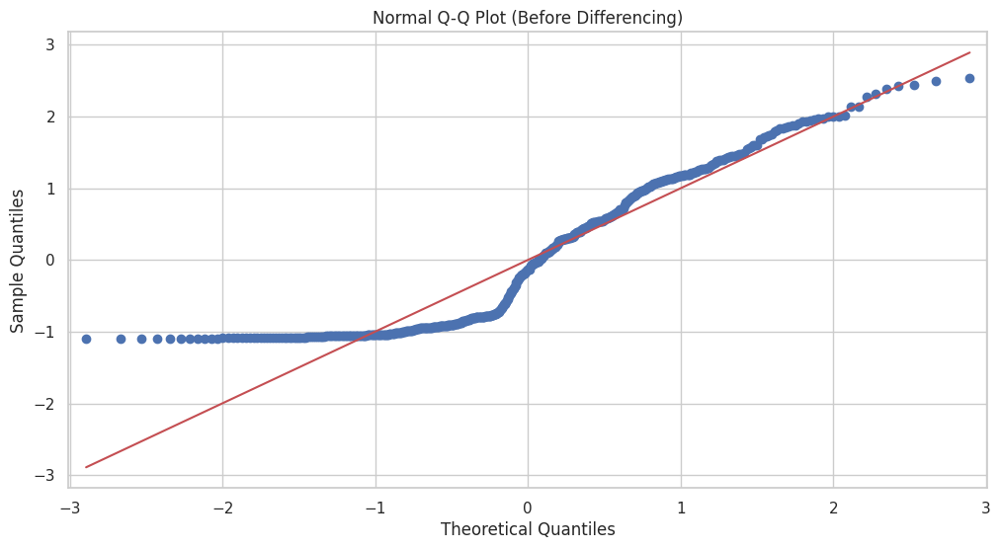

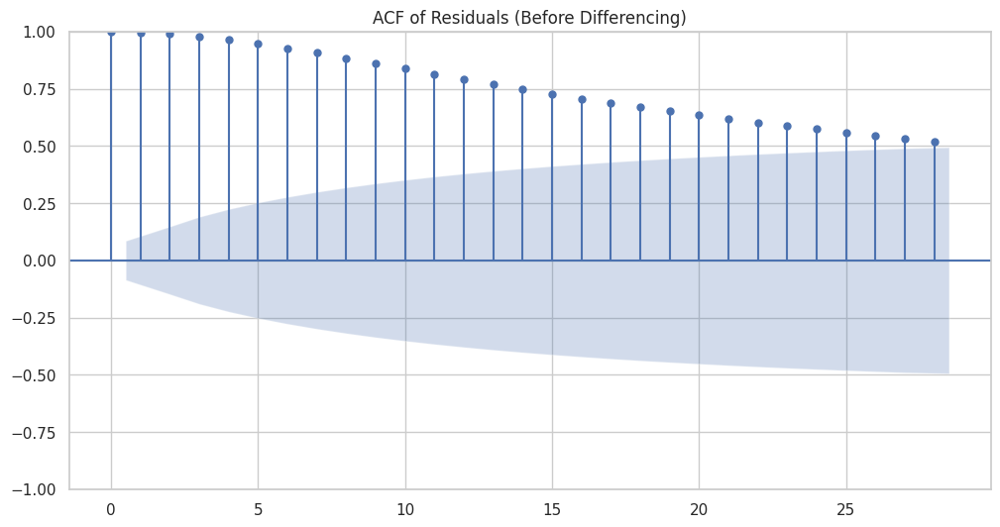

<ipython-input-47-4b0667915bb8>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-47-4b0667915bb8>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-47-4b0667915bb8>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=6444.654, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=7116.907, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=6449.040, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=6780.793, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=6442.809, Time=0.37 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=6636.095, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=6441.173, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=6442.966, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=6442.424, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=6443.168, Time=0.21 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 2.802 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


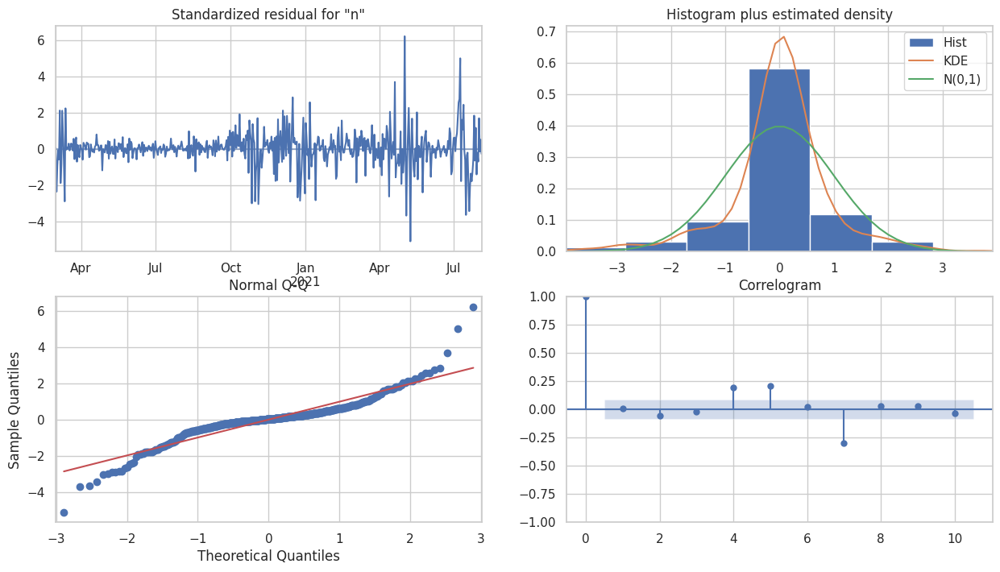

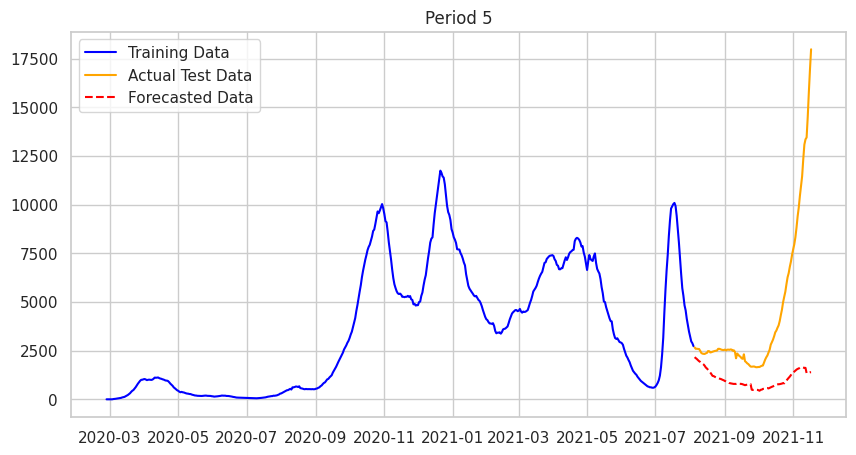

   Period          MAE         RMSE       MAPE
0       1  3227.594306  4829.568429  65.965981


In [47]:
# Prepare the data
df_covid_full_ARIMA = group6_full_covid_data.copy()

# Excluding the target variable and non-numeric columns if present
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Plotting original data before differencing
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['new_cases_smoothed'], label='Original Data')
plt.title('Original Data (Before Differencing)')
plt.legend()
plt.show()

# ACF and PACF plots for original data
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
plot_acf(train['new_cases_smoothed'].dropna(), ax=ax[0], title='ACF of Original Data')
plot_pacf(train['new_cases_smoothed'].dropna(), ax=ax[1], title='PACF of Original Data')
plt.show()

# Standardized Residuals
residuals = train['new_cases_smoothed'] - train['new_cases_smoothed'].mean()
standardized_residuals = residuals / residuals.std()
plt.figure(figsize=(12, 6))
plt.plot(standardized_residuals, label='Standardized Residuals')
plt.title('Standardized Residuals (Before Differencing)')
plt.legend()
plt.show()

# Histogram plus KDE
plt.figure(figsize=(12, 6))
standardized_residuals.plot(kind='hist', density=True, bins=30, alpha=0.5, label='Histogram')
standardized_residuals.plot(kind='kde', label='KDE')
plt.title('Histogram and KDE of Residuals (Before Differencing)')
plt.legend()
plt.show()

# Q-Q Plot
plt.figure(figsize=(12, 6))
qqplot(standardized_residuals, line='s', ax=plt.gca())
plt.title('Normal Q-Q Plot (Before Differencing)')
plt.show()

# ACF Plot of Residuals
plt.figure(figsize=(12, 6))
plot_acf(standardized_residuals.dropna(), ax=plt.gca(), title='ACF of Residuals (Before Differencing)')
plt.show()

# Make the training data stationary if necessary
train_stationary, d_target = make_stationary(train['new_cases_smoothed'])

# Make exogenous variables stationary if necessary
d_exog = {}
for var in exog_variables:
    train[var], d_exog[var] = make_stationary(train[var])

# Adjust exogenous variables for differencing
max_d = max([d_target] + list(d_exog.values()))
exog_train = train[exog_variables].iloc[max_d:]
train_stationary = train_stationary.iloc[max_d:]  # Ensure the same length and index

# Remove constant columns from exog_train
exog_train = exog_train.loc[:, (exog_train != exog_train.iloc[0]).any()]

# Ensure exog_test has the same columns as exog_train
exog_test = test[exog_train.columns]

# Check if there's enough data to train and test
if train_stationary.dropna().empty or test['new_cases_smoothed'].dropna().empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train_stationary, exogenous=exog_train,
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'].iloc[max_d:], exog=exog_train, order=(order[0], d_target, order[2]))
    results = arima_model.fit()

    # Diagnostic plots after fitting ARIMA
    results.plot_diagnostics(figsize=(15, 8))
    plt.show()

    # Dynamic forecasting
    forecast = results.get_forecast(steps=len(test), exog=exog_test)
    forecast_series = forecast.predicted_mean

    # Evaluation
    mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
    rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
    mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

    # Initialize evaluation metrics DataFrame
    eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
    plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
    plt.title('Period 5')
    plt.legend()
    plt.show()

    # Display evaluation metrics
    print(eval_df)


Period 6

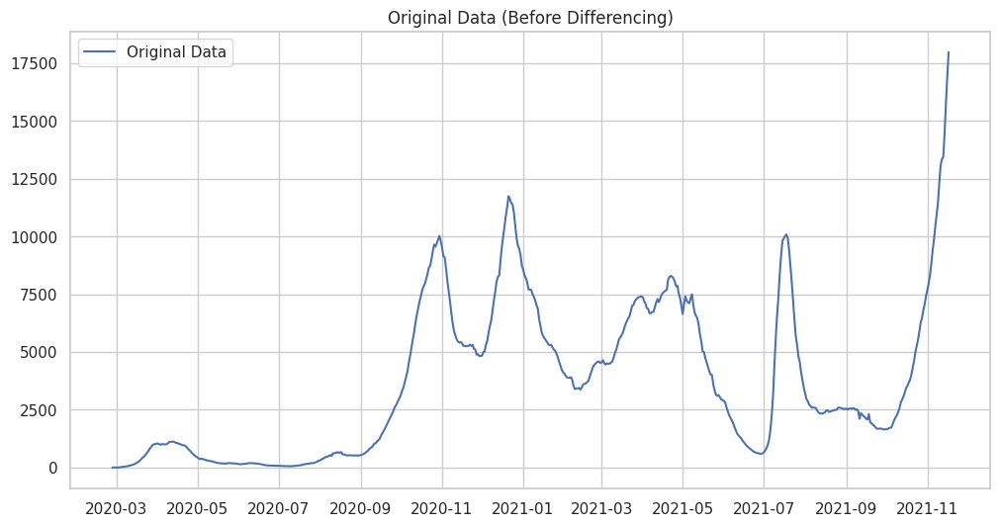

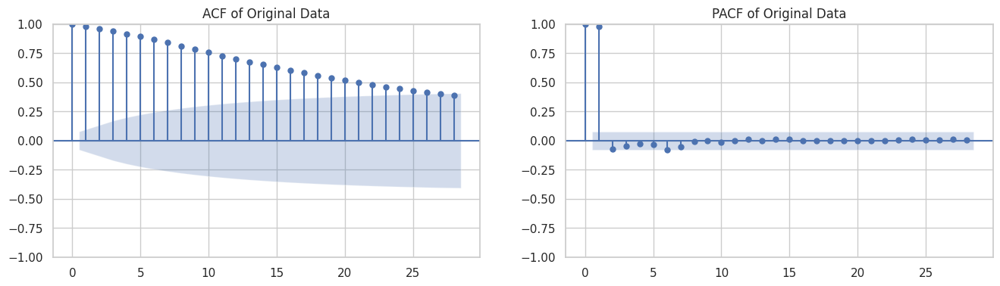

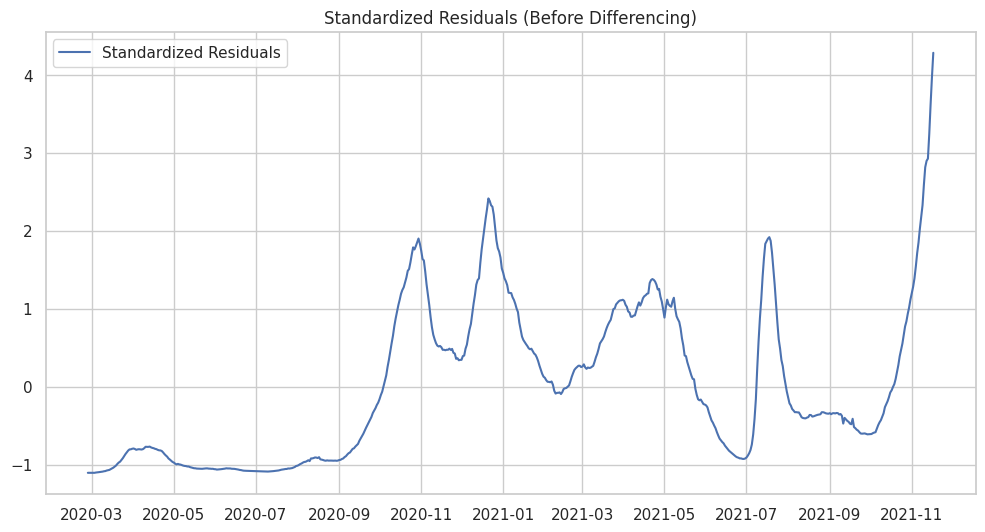

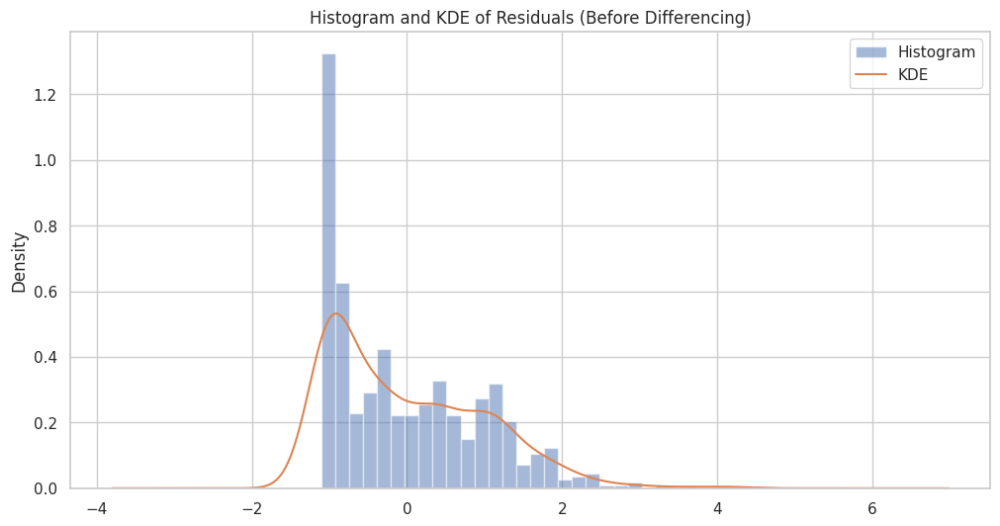

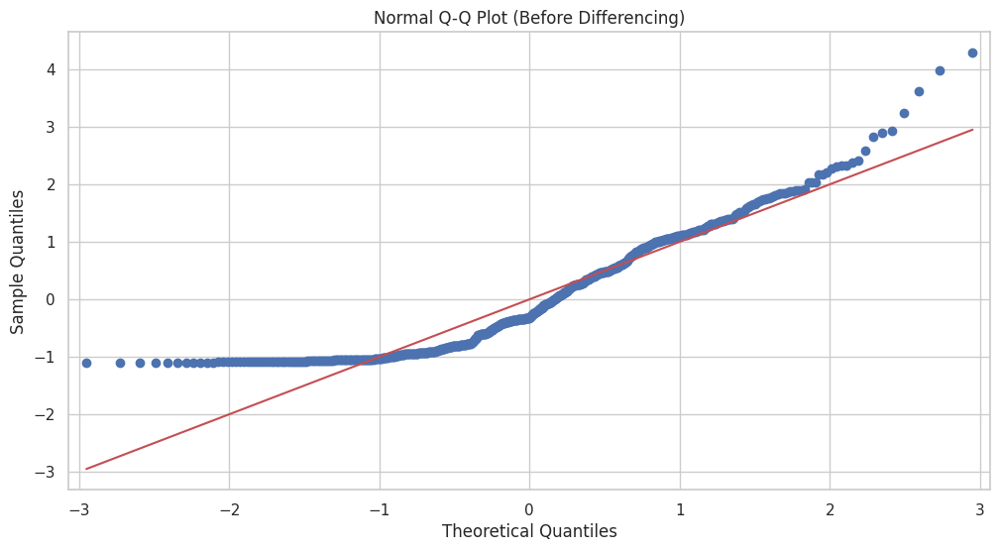

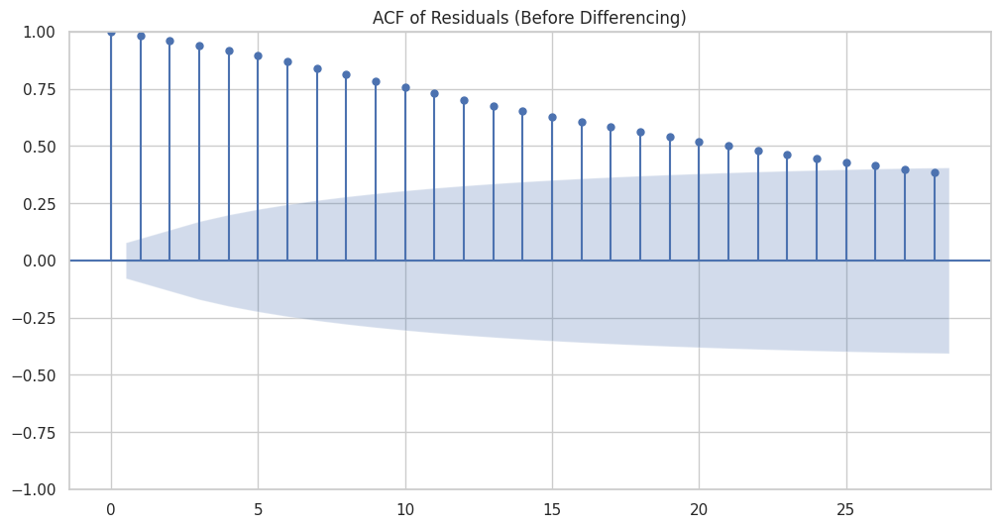

<ipython-input-48-6225fc891f19>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-48-6225fc891f19>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[var], d_exog[var] = make_stationary(train[var])
<ipython-input-48-6225fc891f19>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
The series has become constant after 0 differencing.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=7831.774, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=8661.294, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=7846.818, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=8251.009, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=7830.189, Time=0.27 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=8081.486, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=7832.261, Time=0.09 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=7828.544, Time=0.19 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=7986.891, Time=0.38 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=7829.615, Time=0.59 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=7786.966, Time=0.49 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=7965.480, Time=0.58 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


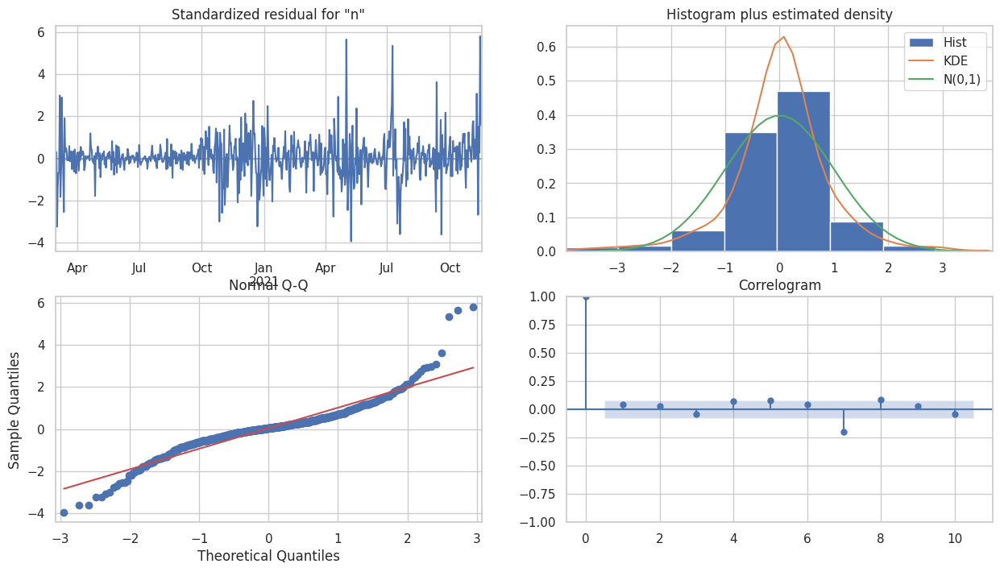

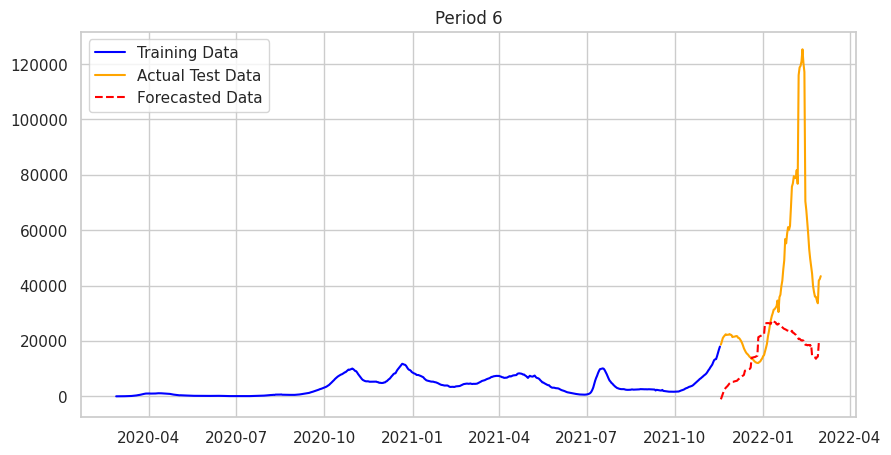

   Period           MAE          RMSE       MAPE
0       1  24255.826397  34869.629161  55.798461


In [48]:
# Prepare the data
df_covid_full_ARIMA = group7_full_covid_data.copy()

# Excluding the target variable and non-numeric columns if present
exog_variables = df_covid_full_ARIMA.columns.drop(['new_cases_smoothed'])  # assuming all other columns are numeric and relevant
df_covid_full_ARIMA.dropna(subset=exog_variables, inplace=True)  # Ensure no missing values in exogenous variables

# Define the prediction period
prediction_days = 105

# Split the dataset into train and test
train = df_covid_full_ARIMA.iloc[:-prediction_days]
test = df_covid_full_ARIMA.iloc[-prediction_days:]

# Plotting original data before differencing
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['new_cases_smoothed'], label='Original Data')
plt.title('Original Data (Before Differencing)')
plt.legend()
plt.show()

# ACF and PACF plots for original data
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
plot_acf(train['new_cases_smoothed'].dropna(), ax=ax[0], title='ACF of Original Data')
plot_pacf(train['new_cases_smoothed'].dropna(), ax=ax[1], title='PACF of Original Data')
plt.show()

# Standardized Residuals
residuals = train['new_cases_smoothed'] - train['new_cases_smoothed'].mean()
standardized_residuals = residuals / residuals.std()
plt.figure(figsize=(12, 6))
plt.plot(standardized_residuals, label='Standardized Residuals')
plt.title('Standardized Residuals (Before Differencing)')
plt.legend()
plt.show()

# Histogram plus KDE
plt.figure(figsize=(12, 6))
standardized_residuals.plot(kind='hist', density=True, bins=30, alpha=0.5, label='Histogram')
standardized_residuals.plot(kind='kde', label='KDE')
plt.title('Histogram and KDE of Residuals (Before Differencing)')
plt.legend()
plt.show()

# Q-Q Plot
plt.figure(figsize=(12, 6))
qqplot(standardized_residuals, line='s', ax=plt.gca())
plt.title('Normal Q-Q Plot (Before Differencing)')
plt.show()

# ACF Plot of Residuals
plt.figure(figsize=(12, 6))
plot_acf(standardized_residuals.dropna(), ax=plt.gca(), title='ACF of Residuals (Before Differencing)')
plt.show()

# Make the training data stationary if necessary
train_stationary, d_target = make_stationary(train['new_cases_smoothed'])

# Make exogenous variables stationary if necessary
d_exog = {}
for var in exog_variables:
    train[var], d_exog[var] = make_stationary(train[var])

# Adjust exogenous variables for differencing
max_d = max([d_target] + list(d_exog.values()))
exog_train = train[exog_variables].iloc[max_d:]
train_stationary = train_stationary.iloc[max_d:]  # Ensure the same length and index

# Remove constant columns from exog_train
exog_train = exog_train.loc[:, (exog_train != exog_train.iloc[0]).any()]

# Ensure exog_test has the same columns as exog_train
exog_test = test[exog_train.columns]

# Check if there's enough data to train and test
if train_stationary.dropna().empty or test['new_cases_smoothed'].dropna().empty:
    print("Insufficient data to train and test.")
else:
    # Auto ARIMA to find the best parameters dynamically
    model = auto_arima(train_stationary, exogenous=exog_train,
                       seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=True)

    # Fit ARIMA Model with the best parameters found
    order = model.get_params()['order']
    arima_model = ARIMA(train['new_cases_smoothed'].iloc[max_d:], exog=exog_train, order=(order[0], d_target, order[2]))
    results = arima_model.fit()

    # Diagnostic plots after fitting ARIMA
    results.plot_diagnostics(figsize=(15, 8))
    plt.show()

    # Dynamic forecasting
    forecast = results.get_forecast(steps=len(test), exog=exog_test)
    forecast_series = forecast.predicted_mean

    # Evaluation
    mae = mean_absolute_error(test['new_cases_smoothed'], forecast_series)
    rmse = np.sqrt(mean_squared_error(test['new_cases_smoothed'], forecast_series))
    mape = mean_absolute_percentage_error(test['new_cases_smoothed'], forecast_series)

    # Initialize evaluation metrics DataFrame
    eval_df = pd.DataFrame({'Period': [1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(train.index, train['new_cases_smoothed'], label='Training Data', color='blue')
    plt.plot(test.index, test['new_cases_smoothed'], label='Actual Test Data', color='orange')
    plt.plot(forecast_series.index, forecast_series, label='Forecasted Data', linestyle='--', color='red')
    plt.title('Period 6')
    plt.legend()
    plt.show()

    # Display evaluation metrics
    print(eval_df)


# SVM

In [ ]:
# Load and prepare the dataset
df_covid_full_SVM = df_covid_full.copy()

# Prepare data for the initial grid search
X_initial = df_covid_full_SVM.drop(['new_cases_smoothed'], axis=1)
y_initial = df_covid_full_SVM['new_cases_smoothed']

# Scale the features for the initial grid search
scaler_initial = StandardScaler()
X_initial_scaled = scaler_initial.fit_transform(X_initial)

# Define parameter grid for GridSearch
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100, 1000],  # Regularization parameter
    'gamma': ['scale', 'auto', 0.01, 0.1, 1, 10],  # Kernel coefficient
    'epsilon': [0.01, 0.1, 1, 10],  # Epsilon parameter range
    'kernel': ['rbf', 'linear', 'poly', 'sigmoid']  # Other kernels can also be tried
}

# Time Series Cross Validation setup
tscv = TimeSeriesSplit(n_splits=5)

# Execute Grid Search
grid_search = GridSearchCV(SVR(), param_grid, cv=tscv, scoring='neg_mean_absolute_error', verbose=2)
grid_search.fit(X_initial_scaled, y_initial)

# Best parameters found
best_params = grid_search.best_params_
print("Best parameters found:", best_params)

# Constants for Walk Forward Validation
days_per_period = 105
num_periods = 6  # Define how many periods you want to forecast

# Initialize evaluation metrics DataFrame
eval_df = pd.DataFrame(columns=['Period', 'MAE', 'RMSE', 'MAPE'])

# Setup figure for subplot grid
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(21, 21))  # Adjust for better visibility of plots
axes = axes.flatten()  # Flatten the array for easy iteration

# Re-scale the entire dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_covid_full_SVM.drop(['new_cases_smoothed'], axis=1))
y = df_covid_full['new_cases_smoothed'].values

# Initialize the model with the best parameters
model = SVR(**best_params)

# Perform walk forward validation
for period in range(num_periods):
    print(f"\n--- Forecast for Period {period + 1} ---")

    train_end = len(X_scaled) - (num_periods - period) * days_per_period
    test_end = train_end + days_per_period

    X_train, y_train = X_scaled[:train_end], y[:train_end]
    X_test, y_test = X_scaled[train_end:test_end], y[train_end:test_end]

    # Train and predict using SVM
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)

    # Append evaluation metrics to the DataFrame
    new_row = {'Period': period + 1, 'MAE': mae, 'RMSE': rmse, 'MAPE': mape}
    eval_df = pd.concat([eval_df, pd.DataFrame([new_row])], ignore_index=True)

    # Plotting
    ax = axes[period]
    df_covid_full_SVM['new_cases_smoothed'][:train_end].plot(ax=ax, label='Training Data', color='blue')
    df_covid_full_SVM['new_cases_smoothed'][train_end:test_end].plot(ax=ax, label='Actual Test Data', color='orange', linewidth=2)
    ax.plot(df_covid_full_SVM.index[train_end:test_end], y_pred, label='Forecasted Data', linestyle='--', color='red')
    ax.set_title(f'Forecast vs Actuals for Period {period + 1}')
    ax.legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Print evaluation metrics
print(eval_df)

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
[CV] END ......C=0.01, epsilon=0.01, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END ......C=0.01, epsilon=0.01, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END ......C=0.01, epsilon=0.01, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END ......C=0.01, epsilon=0.01, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END ......C=0.01, epsilon=0.01, gamma=scale, kernel=rbf; total time=   0.0s
[CV] END ...C=0.01, epsilon=0.01, gamma=scale, kernel=linear; total time=   0.0s
[CV] END ...C=0.01, epsilon=0.01, gamma=scale, kernel=linear; total time=   0.0s
[CV] END ...C=0.01, epsilon=0.01, gamma=scale, kernel=linear; total time=   0.0s
[CV] END ...C=0.01, epsilon=0.01, gamma=scale, kernel=linear; total time=   0.0s
[CV] END ...C=0.01, epsilon=0.01, gamma=scale, kernel=linear; total time=   0.0s
[CV] END .....C=0.01, epsilon=0.01, gamma=scale, kernel=poly; total time=   0.0s
[CV] END .....C=0.01, epsilon=0.01, gamma=sca

# Random Forest

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, mi

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   1.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   1.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, mi

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.0s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   1.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors

[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.7s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   0.8s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.4s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.5s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.6s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.9s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, max

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Best parameters found: {'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}

--- Forecast for Period 1 ---


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



--- Forecast for Period 2 ---


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



--- Forecast for Period 3 ---


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



--- Forecast for Period 4 ---


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



--- Forecast for Period 5 ---


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



--- Forecast for Period 6 ---


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


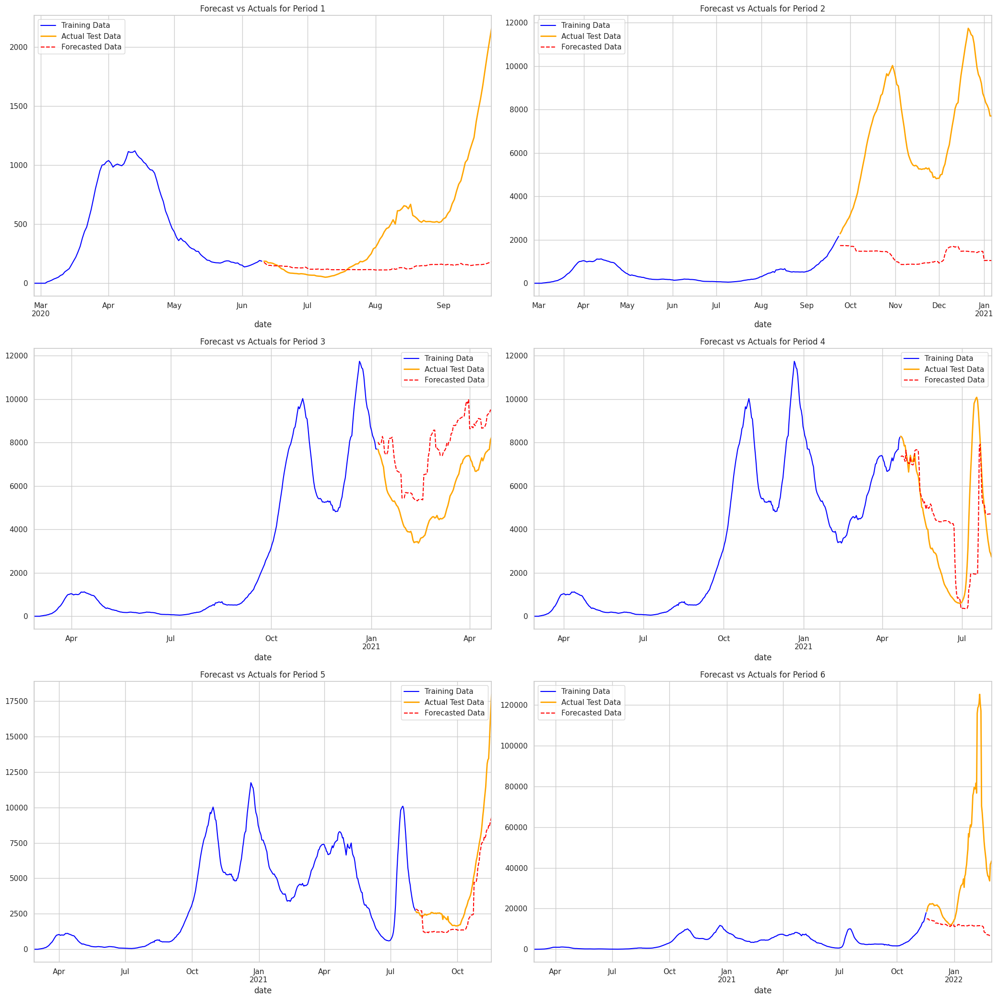

  Period           MAE          RMSE       MAPE
0      1    358.228223    566.871502  64.454805
1      2   5672.253355   6167.101964  77.797521
2      3   2158.001534   2287.239626  42.613329
3      4   1842.140933   2703.692660  76.120451
4      5   1423.501406   2061.975619  34.158298
5      6  27193.299120  39969.977031  53.263747


In [ ]:
# Load and prepare the dataset
df_covid_full_RF = df_covid_full.copy()

# Prepare data for the initial grid search
X_initial = df_covid_full_RF.drop(['new_cases_smoothed'], axis=1)
y_initial = df_covid_full_RF['new_cases_smoothed']

# Define parameter grid for GridSearch
param_grid = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [10, 20, None],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at each leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # The number of features to consider when looking for the best split
}

# Time Series Cross Validation setup
tscv = TimeSeriesSplit(n_splits=5)

# Execute Grid Search
grid_search = GridSearchCV(RandomForestRegressor(), param_grid, cv=tscv, scoring='neg_mean_absolute_error', verbose=2)
grid_search.fit(X_initial, y_initial)

# Best parameters found
best_params = grid_search.best_params_
print("Best parameters found:", best_params)

# Constants for Walk Forward Validation
days_per_period = 105
num_periods = 6  # Define how many periods you want to forecast

# Initialize evaluation metrics DataFrame
eval_df = pd.DataFrame(columns=['Period', 'MAE', 'RMSE', 'MAPE'])

# Setup figure for subplot grid
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(21, 21))  # Adjust for better visibility of plots
axes = axes.flatten()  # Flatten the array for easy iteration

# Initialize the model with the best parameters
model = RandomForestRegressor(**best_params)

# Perform walk forward validation
for period in range(num_periods):
    print(f"\n--- Forecast for Period {period + 1} ---")

    train_end = len(X_initial) - (num_periods - period) * days_per_period
    test_end = train_end + days_per_period

    X_train, y_train = X_initial.iloc[:train_end], y_initial.iloc[:train_end]
    X_test, y_test = X_initial.iloc[train_end:test_end], y_initial.iloc[train_end:test_end]

    # Train and predict using RandomForest
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)

    # Append evaluation metrics to the DataFrame
    new_row = {'Period': period + 1, 'MAE': mae, 'RMSE': rmse, 'MAPE': mape}
    eval_df = pd.concat([eval_df, pd.DataFrame([new_row])], ignore_index=True)

    # Plotting
    ax = axes[period]
    df_covid_full_RF['new_cases_smoothed'][:train_end].plot(ax=ax, label='Training Data', color='blue')
    df_covid_full_RF['new_cases_smoothed'][train_end:test_end].plot(ax=ax, label='Actual Test Data', color='orange', linewidth=2)
    ax.plot(df_covid_full_RF.index[train_end:test_end], y_pred, label='Forecasted Data', linestyle='--', color='red')
    ax.set_title(f'Forecast vs Actuals for Period {period + 1}')
    ax.legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Print evaluation metrics
print(eval_df)

# Gaussian Processes


--- Forecast for Split 1 ---


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(



--- Forecast for Split 2 ---


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(



--- Forecast for Split 3 ---


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(



--- Forecast for Split 4 ---


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(



--- Forecast for Split 5 ---


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(



--- Forecast for Split 6 ---


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


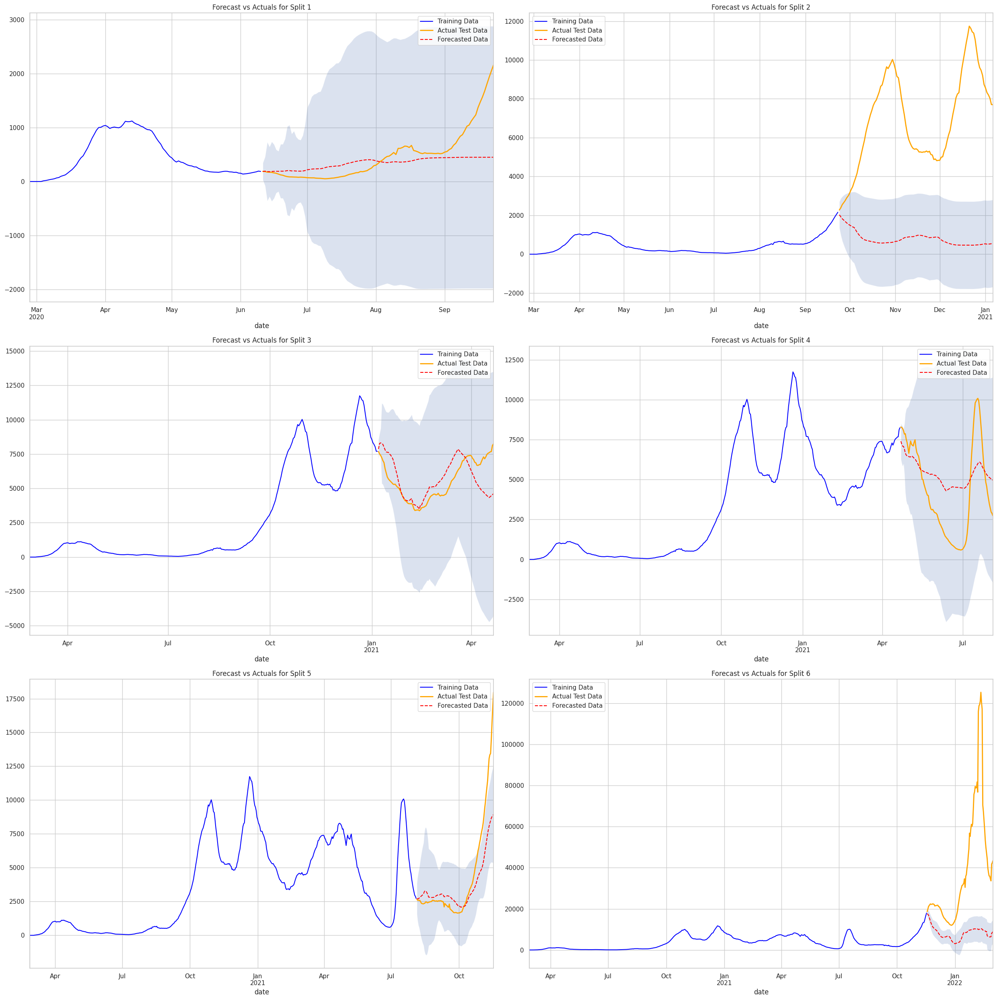

  Split           MAE          RMSE        MAPE
0     1    268.266414    430.292169   98.500296
1     2   6187.641107   6753.409137   84.340010
2     3   1131.602714   1420.665717   19.207375
3     4   2110.206907   2451.963415  138.411432
4     5   1305.302291   2152.288310   25.773339
5     6  30510.843833  41398.452001   70.447301


In [ ]:
# Load and prepare the dataset
df_covid_full_GP = df_covid_full.copy()

# Constants
n_splits = 6  # Define the number of walk-forward validation steps
days_per_split = 105  # Define how many days to forecast in each step

# Initialize evaluation metrics DataFrame
eval_df = pd.DataFrame(columns=['Split', 'MAE', 'RMSE', 'MAPE'])

# Setup figure for subplot grid
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(25, 25))
axes = axes.flatten()

# Define the kernel with Matern and White noise
kernel = C(1.0) * Matern(length_scale=1.0, nu=0.5) + WhiteKernel(noise_level=1)

# Train and forecast using walk forward validation
for split in range(n_splits):
    print(f"\n--- Forecast for Split {split + 1} ---")

    # Define period range
    test_start = len(df_covid_full_GP) - (n_splits - split) * days_per_split
    test_end = test_start + days_per_split

    # Split the data
    train = df_covid_full_GP.iloc[:test_start]
    test = df_covid_full_GP.iloc[test_start:test_end]

    # Prepare the data for Gaussian Process
    X_train = train.drop(['new_cases_smoothed'], axis=1)
    y_train = train['new_cases_smoothed']
    X_test = test.drop(['new_cases_smoothed'], axis=1)
    y_test = test['new_cases_smoothed']

    # Initialize Gaussian Process Regressor
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, normalize_y=True)

    # Fit the model
    gp.fit(X_train, y_train)

    # Make predictions using the Gaussian Process model
    y_pred, sigma = gp.predict(X_test, return_std=True)

    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mape = mean_absolute_percentage_error(y_test, y_pred)

    # Append evaluation metrics to the DataFrame using pd.concat
    new_row = pd.DataFrame({'Split': [split + 1], 'MAE': [mae], 'RMSE': [rmse], 'MAPE': [mape]})
    eval_df = pd.concat([eval_df, new_row], ignore_index=True)

    # Plotting
    ax = axes[split]
    train['new_cases_smoothed'].plot(ax=ax, label='Training Data', color='blue')
    test['new_cases_smoothed'].plot(ax=ax, label='Actual Test Data', color='orange', linewidth=2)
    ax.plot(test.index, y_pred, label='Forecasted Data', linestyle='--', color='red')
    ax.fill_between(test.index, y_pred - 1.96 * sigma, y_pred + 1.96 * sigma, alpha=0.2)
    ax.set_title(f'Forecast vs Actuals for Split {split + 1}')
    ax.legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Print evaluation metrics
print(eval_df.sort_values('Split').reset_index(drop=True))

# LSTM

Period 1

Epoch 1/200
2/2 [==============================] - 23s 114ms/step - loss: 0.3705
Epoch 2/200
2/2 [==============================] - 0s 107ms/step - loss: 0.2953
Epoch 3/200
2/2 [==============================] - 0s 125ms/step - loss: 0.2831
Epoch 4/200
2/2 [==============================] - 0s 104ms/step - loss: 0.2590
Epoch 5/200
2/2 [==============================] - 0s 153ms/step - loss: 0.2613
Epoch 6/200
2/2 [==============================] - 0s 123ms/step - loss: 0.2542
Epoch 7/200
2/2 [==============================] - 0s 127ms/step - loss: 0.2400
Epoch 8/200
2/2 [==============================] - 0s 105ms/step - loss: 0.2354
Epoch 9/200
2/2 [==============================] - 0s 81ms/step - loss: 0.2319
Epoch 10/200
2/2 [==============================] - 0s 74ms/step - loss: 0.2244
Epoch 11/200
2/2 [==============================] - 0s 87ms/step - loss: 0.2180
Epoch 12/200
2/2 [==============================] - 0s 76ms/step - loss: 0.2140
Epoch 13/200
2/2 [======================

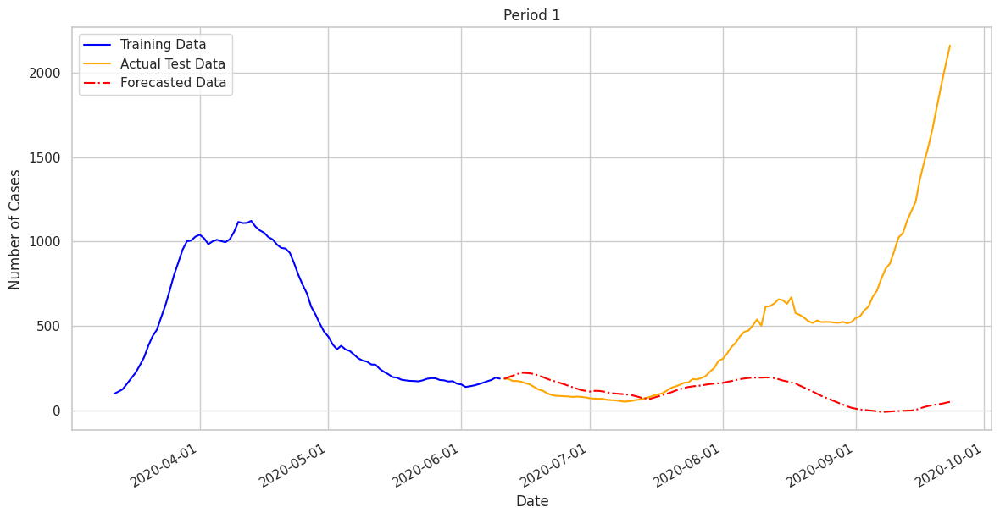

In [36]:
# Set a random seed for reproducibility
np.random.seed(1)
python_random.seed(1)
tf.random.set_seed(1)

# Load and preprocess data
df_covid_full_LSTM = group2_full_covid_data.copy()

# Normalize the data
features_columns = df_covid_full_LSTM.columns.drop('new_cases_smoothed')
scaler_features = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM[features_columns] = scaler_features.fit_transform(df_covid_full_LSTM[features_columns])

target_scaler = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM['new_cases_smoothed'] = target_scaler.fit_transform(df_covid_full_LSTM[['new_cases_smoothed']])

model = Sequential([
    Bidirectional(LSTM(50, return_sequences=True, input_shape=(14, len(features_columns)), kernel_regularizer=l1_l2(l1=1e-4, l2=1e-3))),
    Dropout(0.1),
    Bidirectional(LSTM(25, return_sequences=True)),
    Dropout(0.1),
    Bidirectional(LSTM(10)),
    Dropout(0.1),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data for training and prediction
total_days = len(df_covid_full_LSTM)
test_start_index = total_days - 105  # Start of the 105-day test period
sequence_length = 14

# Prepare sequences
X = []
y = []

# Training data
for i in range(test_start_index - sequence_length):
    seq_x, seq_y = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values, df_covid_full_LSTM['new_cases_smoothed'].iloc[i + sequence_length]
    X.append(seq_x)
    y.append(seq_y)

X_train, y_train = np.array(X), np.array(y)
model.fit(X_train, y_train, epochs=200, batch_size=64, verbose=1)  # Adjust these parameters

# Prediction phase
X_test = []
for i in range(test_start_index - 14, total_days - sequence_length):  # Start predictions 14 days earlier
    seq_x = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values
    X_test.append(seq_x)

X_test = np.array(X_test)
predictions = model.predict(X_test)

# Inverse transform predictions
predictions_scaled = target_scaler.inverse_transform(predictions)

# Actual data for plotting
actuals = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values
actuals_scaled = target_scaler.inverse_transform(actuals.reshape(-1, 1))

# Evaluation metrics
mae = mean_absolute_error(actuals_scaled, predictions_scaled)
rmse = sqrt(mean_squared_error(actuals_scaled, predictions_scaled))
mape = 100 * np.mean(np.abs((actuals_scaled - predictions_scaled) / actuals_scaled))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}%")

# Plot the results
plt.figure(figsize=(14, 7))
training_data_plot = target_scaler.inverse_transform(y_train.reshape(-1, 1))
train_indices = df_covid_full_LSTM.index[sequence_length:test_start_index]

plt.plot(train_indices, training_data_plot, label='Training Data', color='blue')
plt.plot(df_covid_full_LSTM.index[test_start_index:], actuals_scaled, label='Actual Test Data', color='orange')
plt.plot(df_covid_full_LSTM.index[test_start_index:], predictions_scaled, label='Forecasted Data', color='red', linestyle='-.')

plt.title('Period 1')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Rotate date labels for better readability

plt.show()


4/4 [==============================] - 0s 10ms/step


<ipython-input-37-4878420dff5a>:40: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics


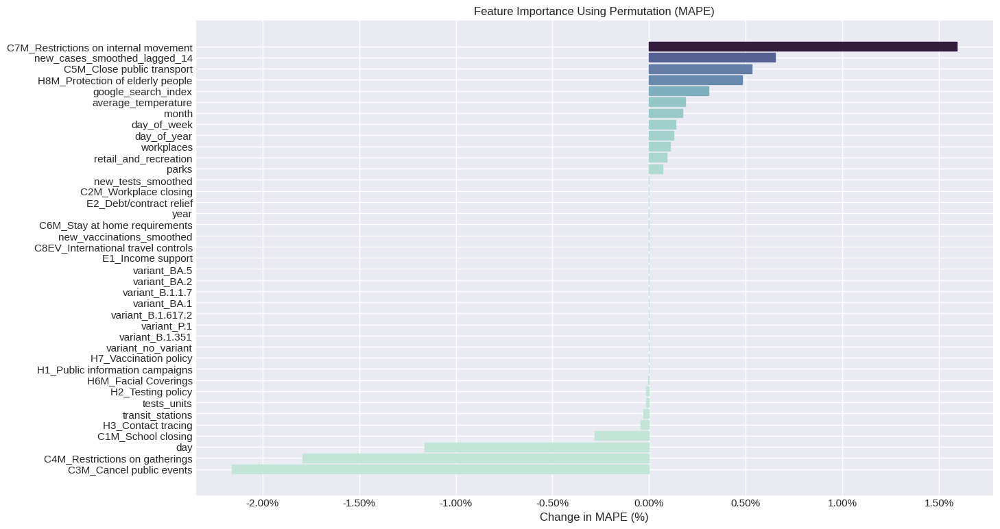

In [ ]:
def evaluate_model_mape(X, y_true, model, scaler):
    y_pred = model.predict(X)
    y_pred_rescaled = scaler.inverse_transform(y_pred)
    y_true_rescaled = scaler.inverse_transform(y_true.reshape(-1, 1))
    return 100 * np.mean(np.abs((y_true_rescaled - y_pred_rescaled) / y_true_rescaled))

# Adjust the features list by excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Prepare the evaluation dataset without the target variable in the features set
X_eval = np.array([df_covid_full_LSTM.loc[:, features_columns].iloc[i:i + sequence_length].values for i in range(test_start_index - 14, total_days - sequence_length)])
y_eval = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values  # this should already be correct

# Assuming all previous variables and model are correctly defined and imported
# Evaluate model performance on unshuffled data
initial_mape = evaluate_model_mape(X_eval, y_eval, model, target_scaler)

# Compute permutation importance for each feature
importance_scores_mape = []
n_repeats = 10  # Number of times to shuffle each feature

for feature_idx in range(X_eval.shape[2]):
    score_changes = []
    for _ in range(n_repeats):
        X_permuted = np.copy(X_eval)
        # Shuffle each feature across all timesteps and samples
        for i in range(X_permuted.shape[0]):
            np.random.shuffle(X_permuted[i, :, feature_idx])

        permuted_mape = evaluate_model_mape(X_permuted, y_eval, model, target_scaler)
        score_change = permuted_mape - initial_mape
        score_changes.append(score_change)

    importance_scores_mape.append(np.mean(score_changes))

# Sort indices for better visual arrangement
sorted_idx = np.argsort(importance_scores_mape)

# Plotting feature importance
plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics
fig, ax = plt.subplots(figsize=(15, 9))  # Increased figure size for better visibility
bars = ax.barh(range(len(importance_scores_mape)), np.array(importance_scores_mape)[sorted_idx], color=sns.color_palette("viridis", len(importance_scores_mape)))
ax.set_yticks(range(len(importance_scores_mape)))
ax.set_yticklabels(np.array(features_columns)[sorted_idx])
ax.set_xlabel('Change in MAPE (%)')
ax.set_title('Feature Importance Using Permutation (MAPE)')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}%'))  # Format x-axis labels as percentages

# Adding color gradient effect
gradient_color = []
for bar in bars:
    bar.set_color(sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)(bar.get_width()))

plt.show()

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 14ms/step


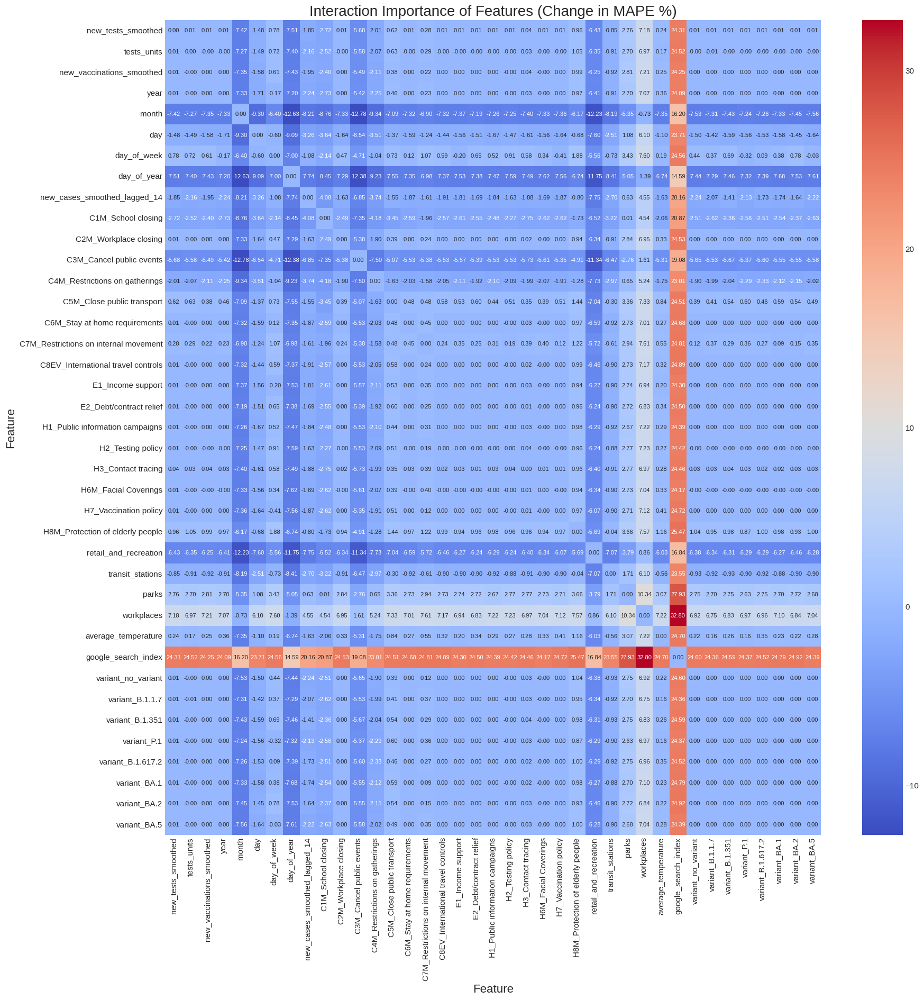

In [ ]:
# Function to calculate feature interaction importance
def feature_interaction_importance(X, y_true, model, scaler, features_columns):
    interaction_scores = np.zeros((len(features_columns), len(features_columns)))  # features x features
    initial_mape = evaluate_model_mape(X, y_true, model, scaler)
    n_repeats = 10  # Number of times to shuffle each feature pair

    for feature_idx1 in range(len(features_columns)):
        for feature_idx2 in range(feature_idx1 + 1, len(features_columns)):
            score_changes = []
            for _ in range(n_repeats):
                X_permuted = np.copy(X)
                # Shuffle both features across all samples and time steps
                for t in range(X.shape[1]):
                    np.random.shuffle(X_permuted[:, t, feature_idx1])
                    np.random.shuffle(X_permuted[:, t, feature_idx2])

                permuted_mape = evaluate_model_mape(X_permuted, y_true, model, scaler)
                score_changes.append(permuted_mape - initial_mape)

            mean_change = np.mean(score_changes)
            interaction_scores[feature_idx1, feature_idx2] = mean_change
            interaction_scores[feature_idx2, feature_idx1] = mean_change  # Symmetric matrix

    return interaction_scores

# Assume X_eval and y_eval are already prepared for evaluation
# Define your feature columns, excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Calculate feature interaction importance
interaction_importance_scores = feature_interaction_importance(X_eval, y_eval, model, target_scaler, features_columns)

# Visualize the interaction importance
fig, ax = plt.subplots(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(interaction_importance_scores, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=features_columns, yticklabels=features_columns, annot_kws={"size": 8})
ax.set_title('Interaction Importance of Features (Change in MAPE %)', fontsize=20)
ax.set_xlabel('Feature', fontsize=16)
ax.set_ylabel('Feature', fontsize=16)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.show()

Period 2

Epoch 1/500
7/7 [==============================] - 23s 39ms/step - loss: 0.2651
Epoch 2/500
7/7 [==============================] - 0s 38ms/step - loss: 0.2383
Epoch 3/500
7/7 [==============================] - 0s 33ms/step - loss: 0.2189
Epoch 4/500
7/7 [==============================] - 0s 43ms/step - loss: 0.2015
Epoch 5/500
7/7 [==============================] - 0s 55ms/step - loss: 0.1844
Epoch 6/500
7/7 [==============================] - 0s 63ms/step - loss: 0.1694
Epoch 7/500
7/7 [==============================] - 0s 65ms/step - loss: 0.1550
Epoch 8/500
7/7 [==============================] - 0s 61ms/step - loss: 0.1420
Epoch 9/500
7/7 [==============================] - 0s 58ms/step - loss: 0.1299
Epoch 10/500
7/7 [==============================] - 0s 56ms/step - loss: 0.1188
Epoch 11/500
7/7 [==============================] - 0s 59ms/step - loss: 0.1085
Epoch 12/500
7/7 [==============================] - 0s 60ms/step - loss: 0.0992
Epoch 13/500
7/7 [==============================

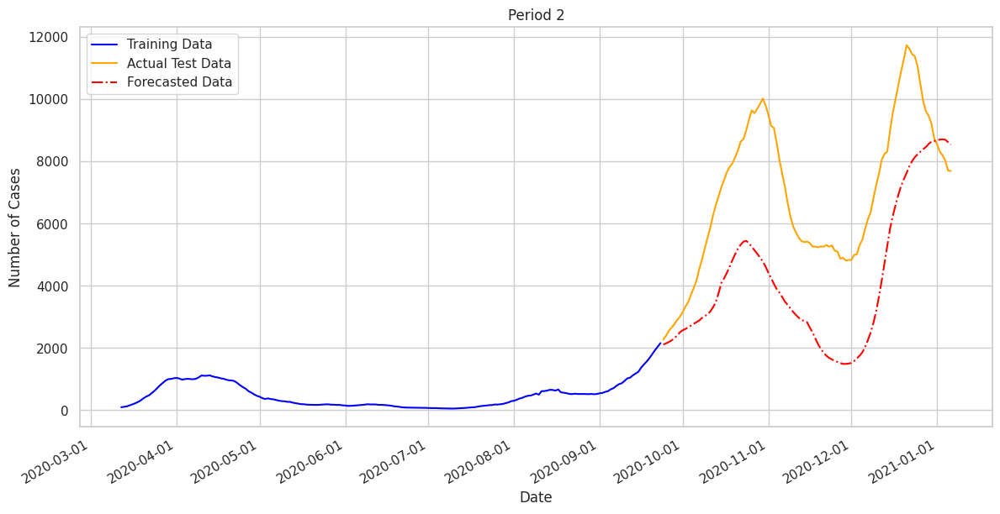

In [37]:
# Set a random seed for reproducibility
np.random.seed(1)
python_random.seed(1)
tf.random.set_seed(1)

# Load and preprocess data
df_covid_full_LSTM = group3_full_covid_data.copy()

# Normalize the data
features_columns = df_covid_full_LSTM.columns.drop('new_cases_smoothed')
scaler_features = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM[features_columns] = scaler_features.fit_transform(df_covid_full_LSTM[features_columns])

target_scaler = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM['new_cases_smoothed'] = target_scaler.fit_transform(df_covid_full_LSTM[['new_cases_smoothed']])

model = Sequential([
    Bidirectional(LSTM(50, return_sequences=True, input_shape=(14, len(features_columns)), kernel_regularizer=l1_l2(l1=1e-4, l2=1e-3))),
    Dropout(0.1),
    Bidirectional(LSTM(25, return_sequences=True)),
    Dropout(0.1),
    Bidirectional(LSTM(10)),
    Dropout(0.1),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data for training and prediction
total_days = len(df_covid_full_LSTM)
test_start_index = total_days - 105  # Start of the 105-day test period
sequence_length = 14

# Prepare sequences
X = []
y = []

# Training data
for i in range(test_start_index - sequence_length):
    seq_x, seq_y = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values, df_covid_full_LSTM['new_cases_smoothed'].iloc[i + sequence_length]
    X.append(seq_x)
    y.append(seq_y)

X_train, y_train = np.array(X), np.array(y)
model.fit(X_train, y_train, epochs=500, batch_size=32, verbose=1)  # Adjust these parameters

# Prediction phase
X_test = []
for i in range(test_start_index - 14, total_days - sequence_length):  # Start predictions 14 days earlier
    seq_x = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values
    X_test.append(seq_x)

X_test = np.array(X_test)
predictions = model.predict(X_test)

# Inverse transform predictions
predictions_scaled = target_scaler.inverse_transform(predictions)

# Actual data for plotting
actuals = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values
actuals_scaled = target_scaler.inverse_transform(actuals.reshape(-1, 1))

# Evaluation metrics
mae = mean_absolute_error(actuals_scaled, predictions_scaled)
rmse = sqrt(mean_squared_error(actuals_scaled, predictions_scaled))
mape = 100 * np.mean(np.abs((actuals_scaled - predictions_scaled) / actuals_scaled))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}%")

# Set a consistent style
# sns.set(style="whitegrid")  # This sets the background to white with gridlines
# Plot the results
plt.figure(figsize=(14, 7))
training_data_plot = target_scaler.inverse_transform(y_train.reshape(-1, 1))
train_indices = df_covid_full_LSTM.index[sequence_length:test_start_index]

plt.plot(train_indices, training_data_plot, label='Training Data', color='blue')
plt.plot(df_covid_full_LSTM.index[test_start_index:], actuals_scaled, label='Actual Test Data', color='orange')
plt.plot(df_covid_full_LSTM.index[test_start_index:], predictions_scaled, label='Forecasted Data', color='red', linestyle='-.')

plt.title('Period 2')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Rotate date labels for better readability

plt.show()


4/4 [==============================] - 0s 10ms/step


<ipython-input-120-867f15f509fb>:34: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics


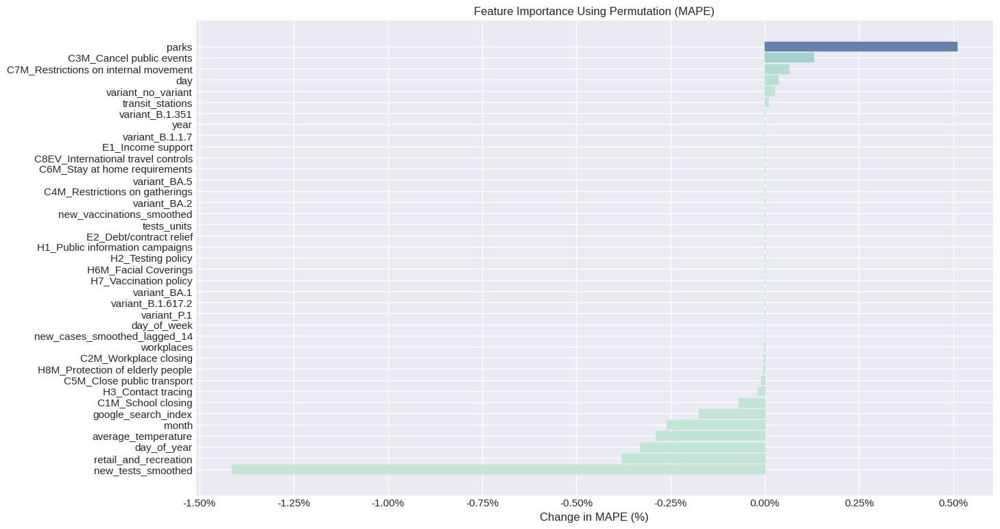

In [ ]:
# Adjust the features list by excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Prepare the evaluation dataset without the target variable in the features set
X_eval = np.array([df_covid_full_LSTM.loc[:, features_columns].iloc[i:i + sequence_length].values for i in range(test_start_index - 14, total_days - sequence_length)])
y_eval = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values  # this should already be correct

# Assuming all previous variables and model are correctly defined and imported
# Evaluate model performance on unshuffled data
initial_mape = evaluate_model_mape(X_eval, y_eval, model, target_scaler)

# Compute permutation importance for each feature
importance_scores_mape = []
n_repeats = 10  # Number of times to shuffle each feature

for feature_idx in range(X_eval.shape[2]):
    score_changes = []
    for _ in range(n_repeats):
        X_permuted = np.copy(X_eval)
        # Shuffle each feature across all timesteps and samples
        for i in range(X_permuted.shape[0]):
            np.random.shuffle(X_permuted[i, :, feature_idx])

        permuted_mape = evaluate_model_mape(X_permuted, y_eval, model, target_scaler)
        score_change = permuted_mape - initial_mape
        score_changes.append(score_change)

    importance_scores_mape.append(np.mean(score_changes))

# Sort indices for better visual arrangement
sorted_idx = np.argsort(importance_scores_mape)

# Plotting feature importance
plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics
fig, ax = plt.subplots(figsize=(15, 9))  # Increased figure size for better visibility
bars = ax.barh(range(len(importance_scores_mape)), np.array(importance_scores_mape)[sorted_idx], color=sns.color_palette("viridis", len(importance_scores_mape)))
ax.set_yticks(range(len(importance_scores_mape)))
ax.set_yticklabels(np.array(features_columns)[sorted_idx])
ax.set_xlabel('Change in MAPE (%)')
ax.set_title('Feature Importance Using Permutation (MAPE)')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}%'))  # Format x-axis labels as percentages

# Adding color gradient effect
gradient_color = []
for bar in bars:
    bar.set_color(sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)(bar.get_width()))

plt.show()

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 15ms/step


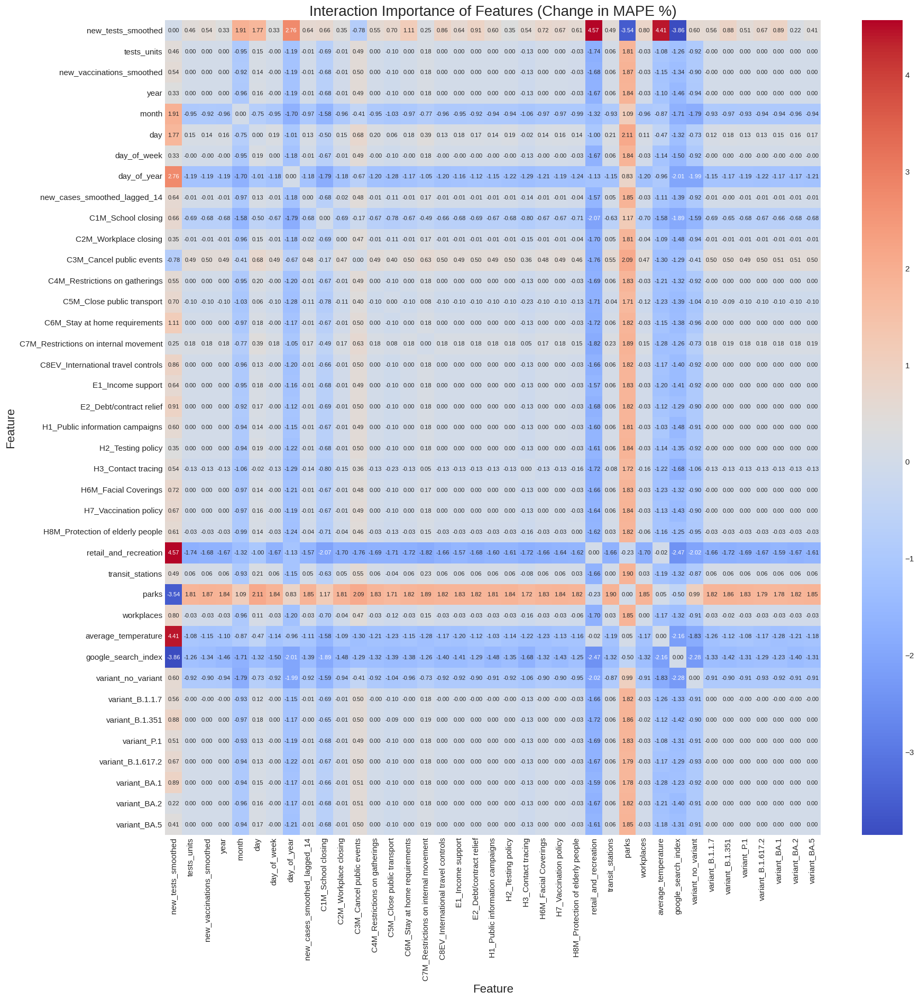

In [ ]:
# Assume X_eval and y_eval are already prepared for evaluation
# Define your feature columns, excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Calculate feature interaction importance
interaction_importance_scores = feature_interaction_importance(X_eval, y_eval, model, target_scaler, features_columns)

# Visualize the interaction importance
fig, ax = plt.subplots(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(interaction_importance_scores, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=features_columns, yticklabels=features_columns, annot_kws={"size": 8})
ax.set_title('Interaction Importance of Features (Change in MAPE %)', fontsize=20)
ax.set_xlabel('Feature', fontsize=16)
ax.set_ylabel('Feature', fontsize=16)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.show()

Period 3

Epoch 1/500
19/19 [==============================] - 25s 54ms/step - loss: 0.3007
Epoch 2/500
19/19 [==============================] - 1s 60ms/step - loss: 0.2195
Epoch 3/500
19/19 [==============================] - 1s 58ms/step - loss: 0.1839
Epoch 4/500
19/19 [==============================] - 1s 57ms/step - loss: 0.1541
Epoch 5/500
19/19 [==============================] - 1s 51ms/step - loss: 0.1307
Epoch 6/500
19/19 [==============================] - 1s 28ms/step - loss: 0.1108
Epoch 7/500
19/19 [==============================] - 1s 28ms/step - loss: 0.0960
Epoch 8/500
19/19 [==============================] - 1s 29ms/step - loss: 0.0815
Epoch 9/500
19/19 [==============================] - 1s 29ms/step - loss: 0.0717
Epoch 10/500
19/19 [==============================] - 1s 31ms/step - loss: 0.0643
Epoch 11/500
19/19 [==============================] - 1s 34ms/step - loss: 0.0569
Epoch 12/500
19/19 [==============================] - 1s 28ms/step - loss: 0.0512
Epoch 13/500
19/19 [====

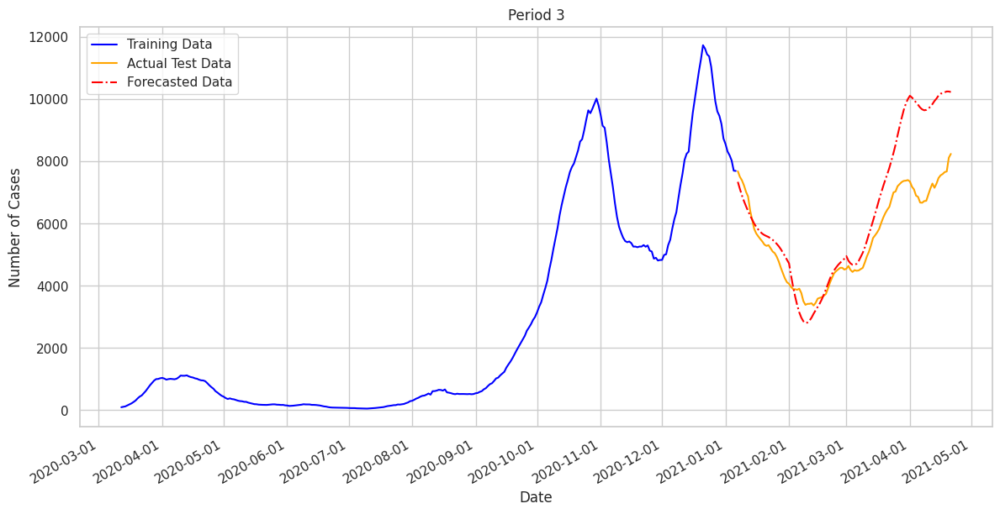

In [38]:
# Set a random seed for reproducibility
np.random.seed(1)
python_random.seed(1)
tf.random.set_seed(1)

# Load and preprocess data
df_covid_full_LSTM = group4_full_covid_data.copy()

# Normalize the data
features_columns = df_covid_full_LSTM.columns.drop('new_cases_smoothed')
scaler_features = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM[features_columns] = scaler_features.fit_transform(df_covid_full_LSTM[features_columns])

target_scaler = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM['new_cases_smoothed'] = target_scaler.fit_transform(df_covid_full_LSTM[['new_cases_smoothed']])

model = Sequential([
    Bidirectional(LSTM(50, return_sequences=True, input_shape=(14, len(features_columns)), kernel_regularizer=l1_l2(l1=1e-4, l2=1e-3))),
    Dropout(0.1),
    Bidirectional(LSTM(25, return_sequences=True)),
    Dropout(0.1),
    Bidirectional(LSTM(10)),
    Dropout(0.1),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data for training and prediction
total_days = len(df_covid_full_LSTM)
test_start_index = total_days - 105  # Start of the 105-day test period
sequence_length = 14

# Prepare sequences
X = []
y = []

# Training data
for i in range(test_start_index - sequence_length):
    seq_x, seq_y = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values, df_covid_full_LSTM['new_cases_smoothed'].iloc[i + sequence_length]
    X.append(seq_x)
    y.append(seq_y)

X_train, y_train = np.array(X), np.array(y)
model.fit(X_train, y_train, epochs=500, batch_size=16, verbose=1)  # Adjust these parameters

# Prediction phase
X_test = []
for i in range(test_start_index - 14, total_days - sequence_length):  # Start predictions 14 days earlier
    seq_x = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values
    X_test.append(seq_x)

X_test = np.array(X_test)
predictions = model.predict(X_test)

# Inverse transform predictions
predictions_scaled = target_scaler.inverse_transform(predictions)

# Actual data for plotting
actuals = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values
actuals_scaled = target_scaler.inverse_transform(actuals.reshape(-1, 1))

# Evaluation metrics
mae = mean_absolute_error(actuals_scaled, predictions_scaled)
rmse = sqrt(mean_squared_error(actuals_scaled, predictions_scaled))
mape = 100 * np.mean(np.abs((actuals_scaled - predictions_scaled) / actuals_scaled))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}%")

# Plot the results
plt.figure(figsize=(14, 7))
training_data_plot = target_scaler.inverse_transform(y_train.reshape(-1, 1))
train_indices = df_covid_full_LSTM.index[sequence_length:test_start_index]

plt.plot(train_indices, training_data_plot, label='Training Data', color='blue')
plt.plot(df_covid_full_LSTM.index[test_start_index:], actuals_scaled, label='Actual Test Data', color='orange')
plt.plot(df_covid_full_LSTM.index[test_start_index:], predictions_scaled, label='Forecasted Data', color='red', linestyle='-.')

plt.title('Period 3')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Rotate date labels for better readability

plt.show()


4/4 [==============================] - 0s 16ms/step


<ipython-input-195-867f15f509fb>:34: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics


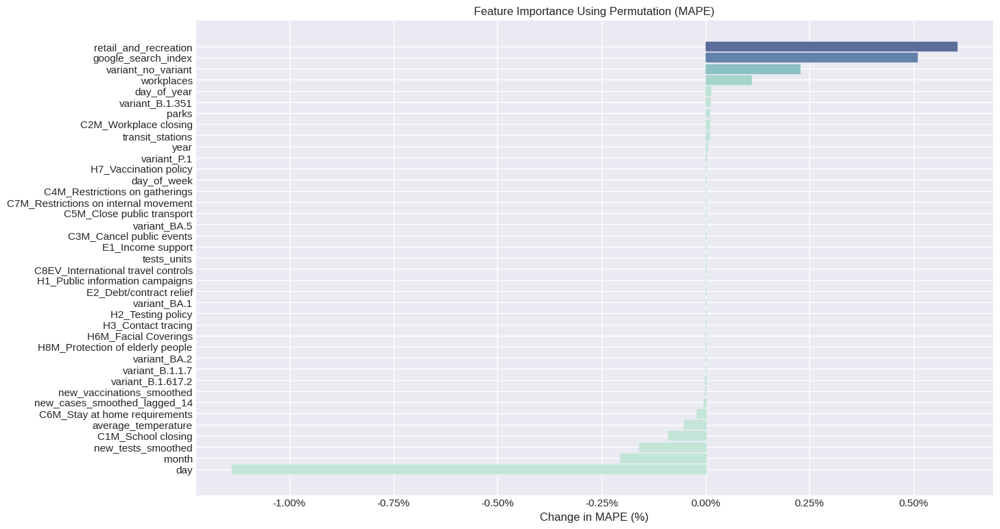

In [ ]:
# Adjust the features list by excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Prepare the evaluation dataset without the target variable in the features set
X_eval = np.array([df_covid_full_LSTM.loc[:, features_columns].iloc[i:i + sequence_length].values for i in range(test_start_index - 14, total_days - sequence_length)])
y_eval = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values  # this should already be correct

# Assuming all previous variables and model are correctly defined and imported
# Evaluate model performance on unshuffled data
initial_mape = evaluate_model_mape(X_eval, y_eval, model, target_scaler)

# Compute permutation importance for each feature
importance_scores_mape = []
n_repeats = 10  # Number of times to shuffle each feature

for feature_idx in range(X_eval.shape[2]):
    score_changes = []
    for _ in range(n_repeats):
        X_permuted = np.copy(X_eval)
        # Shuffle each feature across all timesteps and samples
        for i in range(X_permuted.shape[0]):
            np.random.shuffle(X_permuted[i, :, feature_idx])

        permuted_mape = evaluate_model_mape(X_permuted, y_eval, model, target_scaler)
        score_change = permuted_mape - initial_mape
        score_changes.append(score_change)

    importance_scores_mape.append(np.mean(score_changes))

# Sort indices for better visual arrangement
sorted_idx = np.argsort(importance_scores_mape)

# Plotting feature importance
plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics
fig, ax = plt.subplots(figsize=(15, 9))  # Increased figure size for better visibility
bars = ax.barh(range(len(importance_scores_mape)), np.array(importance_scores_mape)[sorted_idx], color=sns.color_palette("viridis", len(importance_scores_mape)))
ax.set_yticks(range(len(importance_scores_mape)))
ax.set_yticklabels(np.array(features_columns)[sorted_idx])
ax.set_xlabel('Change in MAPE (%)')
ax.set_title('Feature Importance Using Permutation (MAPE)')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}%'))  # Format x-axis labels as percentages

# Adding color gradient effect
gradient_color = []
for bar in bars:
    bar.set_color(sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)(bar.get_width()))

plt.show()

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 24ms/step


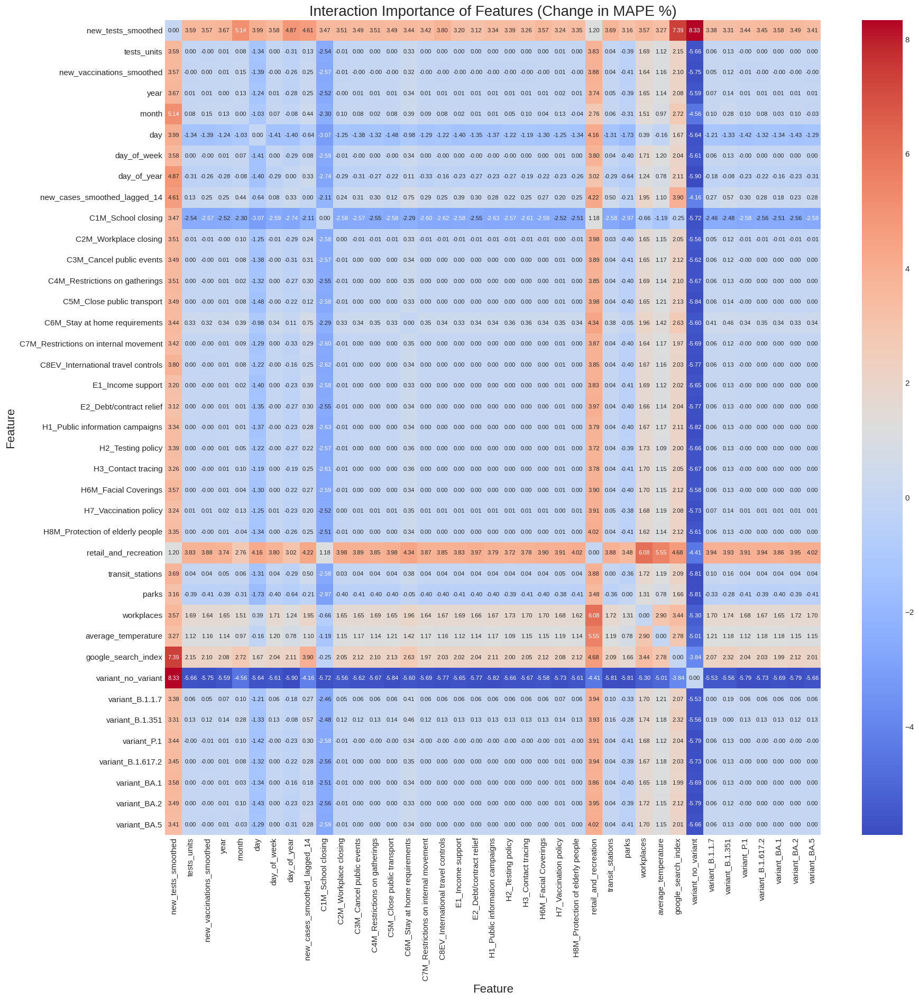

In [ ]:
# Assume X_eval and y_eval are already prepared for evaluation
# Define your feature columns, excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Calculate feature interaction importance
interaction_importance_scores = feature_interaction_importance(X_eval, y_eval, model, target_scaler, features_columns)

# Visualize the interaction importance
fig, ax = plt.subplots(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(interaction_importance_scores, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=features_columns, yticklabels=features_columns, annot_kws={"size": 8})
ax.set_title('Interaction Importance of Features (Change in MAPE %)', fontsize=20)
ax.set_xlabel('Feature', fontsize=16)
ax.set_ylabel('Feature', fontsize=16)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.show()

Period 4

Epoch 1/200
26/26 [==============================] - 16s 30ms/step - loss: 0.2990
Epoch 2/200
26/26 [==============================] - 1s 29ms/step - loss: 0.2160
Epoch 3/200
26/26 [==============================] - 1s 30ms/step - loss: 0.1726
Epoch 4/200
26/26 [==============================] - 1s 43ms/step - loss: 0.1412
Epoch 5/200
26/26 [==============================] - 1s 53ms/step - loss: 0.1151
Epoch 6/200
26/26 [==============================] - 1s 53ms/step - loss: 0.0960
Epoch 7/200
26/26 [==============================] - 1s 57ms/step - loss: 0.0800
Epoch 8/200
26/26 [==============================] - 1s 51ms/step - loss: 0.0693
Epoch 9/200
26/26 [==============================] - 1s 29ms/step - loss: 0.0608
Epoch 10/200
26/26 [==============================] - 1s 31ms/step - loss: 0.0541
Epoch 11/200
26/26 [==============================] - 1s 29ms/step - loss: 0.0476
Epoch 12/200
26/26 [==============================] - 1s 31ms/step - loss: 0.0434
Epoch 13/200
26/26 [====

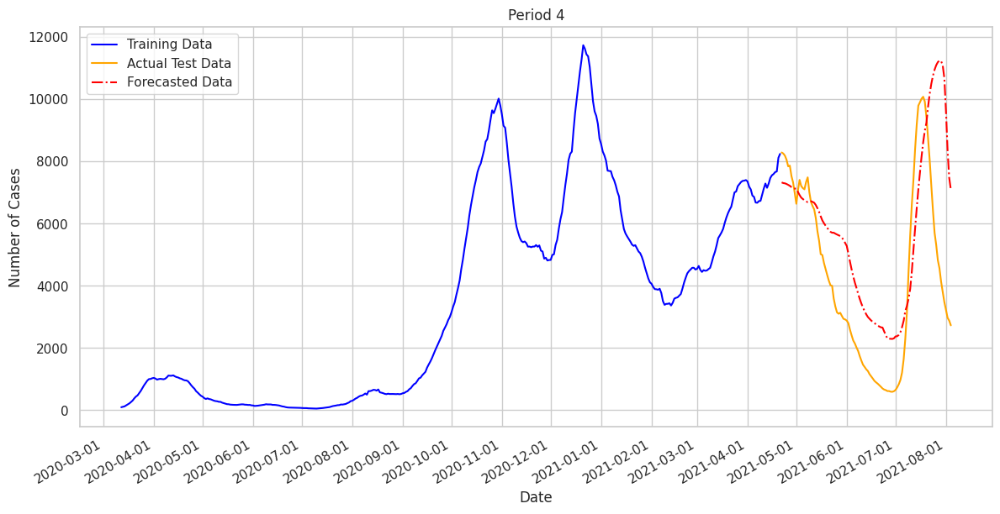

In [39]:
# Set a random seed for reproducibility
np.random.seed(1)
python_random.seed(1)
tf.random.set_seed(1)

# Load and preprocess data
df_covid_full_LSTM = group5_full_covid_data.copy()

# Normalize the data
features_columns = df_covid_full_LSTM.columns.drop('new_cases_smoothed')
scaler_features = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM[features_columns] = scaler_features.fit_transform(df_covid_full_LSTM[features_columns])

target_scaler = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM['new_cases_smoothed'] = target_scaler.fit_transform(df_covid_full_LSTM[['new_cases_smoothed']])

model = Sequential([
    Bidirectional(LSTM(50, return_sequences=True, input_shape=(14, len(features_columns)), kernel_regularizer=l1_l2(l1=1e-4, l2=1e-3))),
    Dropout(0.1),
    Bidirectional(LSTM(25, return_sequences=True)),
    Dropout(0.1),
    Bidirectional(LSTM(10)),
    Dropout(0.1),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data for training and prediction
total_days = len(df_covid_full_LSTM)
test_start_index = total_days - 105  # Start of the 105-day test period
sequence_length = 14

# Prepare sequences
X = []
y = []

# Training data
for i in range(test_start_index - sequence_length):
    seq_x, seq_y = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values, df_covid_full_LSTM['new_cases_smoothed'].iloc[i + sequence_length]
    X.append(seq_x)
    y.append(seq_y)

X_train, y_train = np.array(X), np.array(y)
model.fit(X_train, y_train, epochs=200, batch_size=16, verbose=1)  # Adjust these parameters

# Prediction phase
X_test = []
for i in range(test_start_index - 14, total_days - sequence_length):  # Start predictions 14 days earlier
    seq_x = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values
    X_test.append(seq_x)

X_test = np.array(X_test)
predictions = model.predict(X_test)

# Inverse transform predictions
predictions_scaled = target_scaler.inverse_transform(predictions)

# Actual data for plotting
actuals = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values
actuals_scaled = target_scaler.inverse_transform(actuals.reshape(-1, 1))

# Evaluation metrics
mae = mean_absolute_error(actuals_scaled, predictions_scaled)
rmse = sqrt(mean_squared_error(actuals_scaled, predictions_scaled))
mape = 100 * np.mean(np.abs((actuals_scaled - predictions_scaled) / actuals_scaled))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}%")

# Plot the results
plt.figure(figsize=(14, 7))
training_data_plot = target_scaler.inverse_transform(y_train.reshape(-1, 1))
train_indices = df_covid_full_LSTM.index[sequence_length:test_start_index]

plt.plot(train_indices, training_data_plot, label='Training Data', color='blue')
plt.plot(df_covid_full_LSTM.index[test_start_index:], actuals_scaled, label='Actual Test Data', color='orange')
plt.plot(df_covid_full_LSTM.index[test_start_index:], predictions_scaled, label='Forecasted Data', color='red', linestyle='-.')

plt.title('Period 4')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Rotate date labels for better readability

plt.show()


4/4 [==============================] - 0s 11ms/step


<ipython-input-42-867f15f509fb>:34: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics


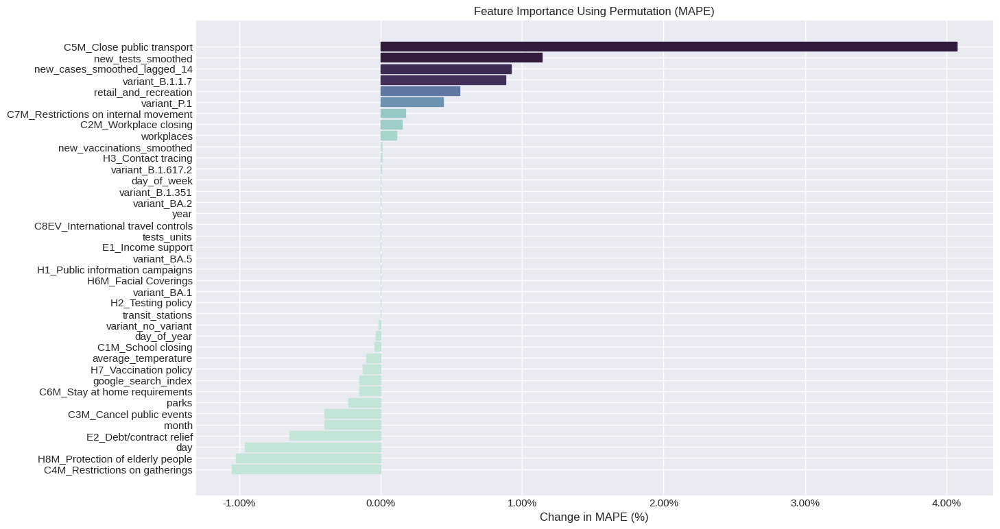

In [ ]:
# Adjust the features list by excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Prepare the evaluation dataset without the target variable in the features set
X_eval = np.array([df_covid_full_LSTM.loc[:, features_columns].iloc[i:i + sequence_length].values for i in range(test_start_index - 14, total_days - sequence_length)])
y_eval = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values  # this should already be correct

# Assuming all previous variables and model are correctly defined and imported
# Evaluate model performance on unshuffled data
initial_mape = evaluate_model_mape(X_eval, y_eval, model, target_scaler)

# Compute permutation importance for each feature
importance_scores_mape = []
n_repeats = 10  # Number of times to shuffle each feature

for feature_idx in range(X_eval.shape[2]):
    score_changes = []
    for _ in range(n_repeats):
        X_permuted = np.copy(X_eval)
        # Shuffle each feature across all timesteps and samples
        for i in range(X_permuted.shape[0]):
            np.random.shuffle(X_permuted[i, :, feature_idx])

        permuted_mape = evaluate_model_mape(X_permuted, y_eval, model, target_scaler)
        score_change = permuted_mape - initial_mape
        score_changes.append(score_change)

    importance_scores_mape.append(np.mean(score_changes))

# Sort indices for better visual arrangement
sorted_idx = np.argsort(importance_scores_mape)

# Plotting feature importance
plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics
fig, ax = plt.subplots(figsize=(15, 9))  # Increased figure size for better visibility
bars = ax.barh(range(len(importance_scores_mape)), np.array(importance_scores_mape)[sorted_idx], color=sns.color_palette("viridis", len(importance_scores_mape)))
ax.set_yticks(range(len(importance_scores_mape)))
ax.set_yticklabels(np.array(features_columns)[sorted_idx])
ax.set_xlabel('Change in MAPE (%)')
ax.set_title('Feature Importance Using Permutation (MAPE)')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}%'))  # Format x-axis labels as percentages

# Adding color gradient effect
gradient_color = []
for bar in bars:
    bar.set_color(sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)(bar.get_width()))

plt.show()

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 16ms/step


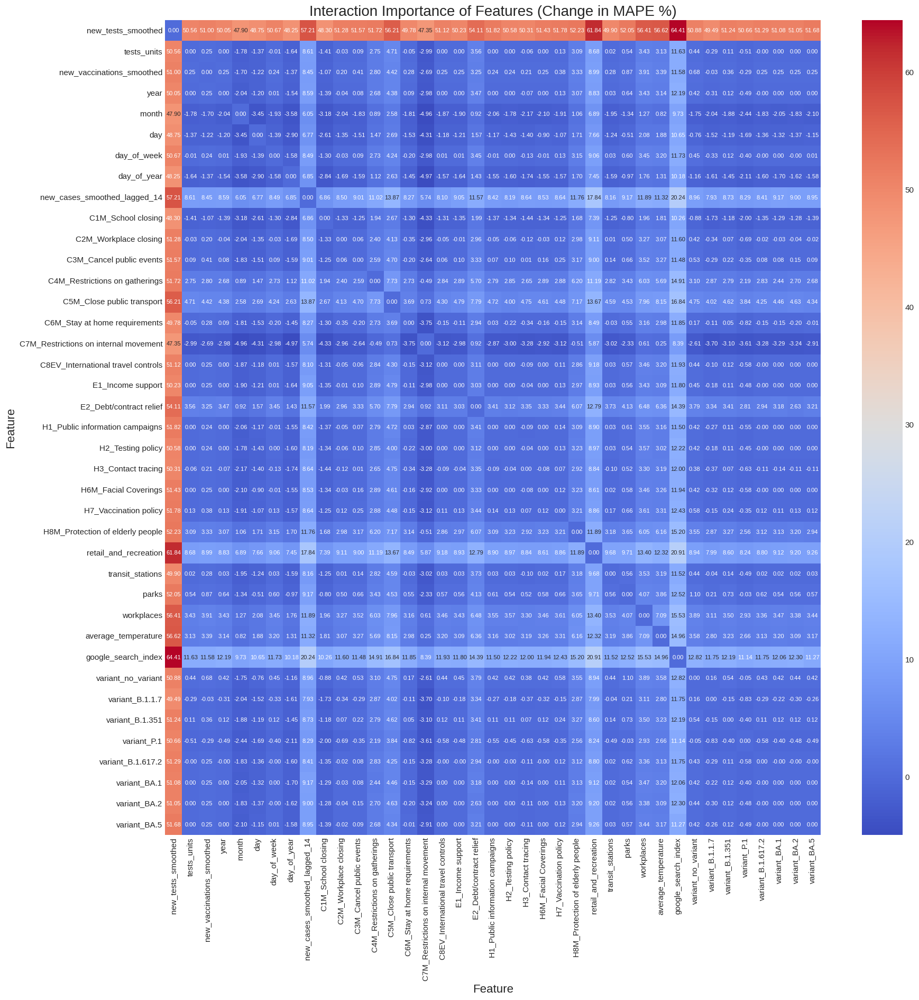

In [ ]:
# Assume X_eval and y_eval are already prepared for evaluation
# Define your feature columns, excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Calculate feature interaction importance
interaction_importance_scores = feature_interaction_importance(X_eval, y_eval, model, target_scaler, features_columns)

# Visualize the interaction importance
fig, ax = plt.subplots(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(interaction_importance_scores, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=features_columns, yticklabels=features_columns, annot_kws={"size": 8})
ax.set_title('Interaction Importance of Features (Change in MAPE %)', fontsize=20)
ax.set_xlabel('Feature', fontsize=16)
ax.set_ylabel('Feature', fontsize=16)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.show()

Period 5

Epoch 1/200
32/32 [==============================] - 16s 38ms/step - loss: 0.2537
Epoch 2/200
32/32 [==============================] - 2s 59ms/step - loss: 0.1829
Epoch 3/200
32/32 [==============================] - 2s 61ms/step - loss: 0.1369
Epoch 4/200
32/32 [==============================] - 1s 45ms/step - loss: 0.1034
Epoch 5/200
32/32 [==============================] - 1s 30ms/step - loss: 0.0782
Epoch 6/200
32/32 [==============================] - 1s 32ms/step - loss: 0.0612
Epoch 7/200
32/32 [==============================] - 1s 31ms/step - loss: 0.0493
Epoch 8/200
32/32 [==============================] - 1s 31ms/step - loss: 0.0420
Epoch 9/200
32/32 [==============================] - 1s 30ms/step - loss: 0.0363
Epoch 10/200
32/32 [==============================] - 1s 30ms/step - loss: 0.0317
Epoch 11/200
32/32 [==============================] - 1s 28ms/step - loss: 0.0281
Epoch 12/200
32/32 [==============================] - 1s 30ms/step - loss: 0.0257
Epoch 13/200
32/32 [====

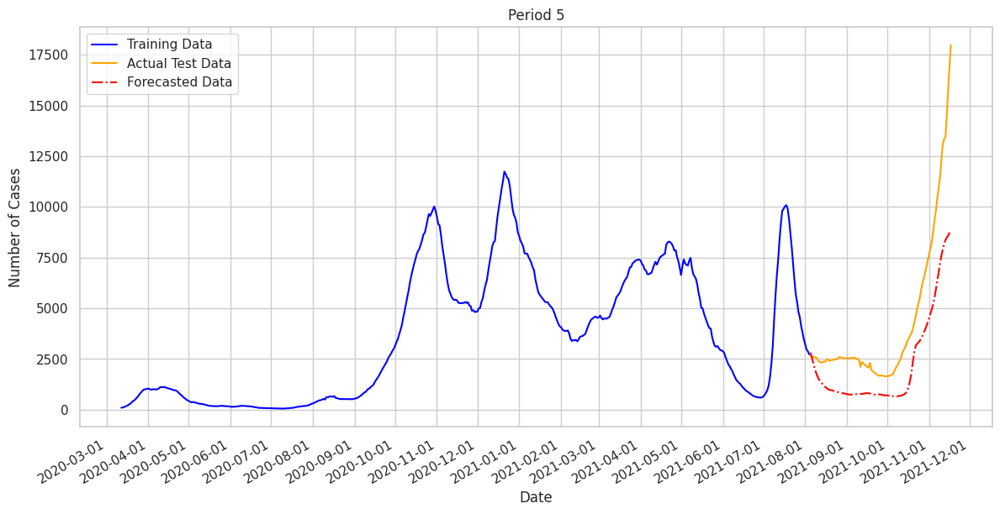

In [40]:
# Set a random seed for reproducibility
np.random.seed(1)
python_random.seed(1)
tf.random.set_seed(1)

# Load and preprocess data
df_covid_full_LSTM = group6_full_covid_data.copy()

# Normalize the data
features_columns = df_covid_full_LSTM.columns.drop('new_cases_smoothed')
scaler_features = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM[features_columns] = scaler_features.fit_transform(df_covid_full_LSTM[features_columns])

target_scaler = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM['new_cases_smoothed'] = target_scaler.fit_transform(df_covid_full_LSTM[['new_cases_smoothed']])

model = Sequential([
    Bidirectional(LSTM(50, return_sequences=True, input_shape=(14, len(features_columns)), kernel_regularizer=l1_l2(l1=1e-4, l2=1e-3))),
    Dropout(0.1),
    Bidirectional(LSTM(25, return_sequences=True)),
    Dropout(0.1),
    Bidirectional(LSTM(10)),
    Dropout(0.1),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data for training and prediction
total_days = len(df_covid_full_LSTM)
test_start_index = total_days - 105  # Start of the 105-day test period
sequence_length = 14

# Prepare sequences
X = []
y = []

# Training data
for i in range(test_start_index - sequence_length):
    seq_x, seq_y = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values, df_covid_full_LSTM['new_cases_smoothed'].iloc[i + sequence_length]
    X.append(seq_x)
    y.append(seq_y)

X_train, y_train = np.array(X), np.array(y)
model.fit(X_train, y_train, epochs=200, batch_size=16, verbose=1)  # Adjust these parameters

# Prediction phase
X_test = []
for i in range(test_start_index - 14, total_days - sequence_length):  # Start predictions 14 days earlier
    seq_x = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values
    X_test.append(seq_x)

X_test = np.array(X_test)
predictions = model.predict(X_test)

# Inverse transform predictions
predictions_scaled = target_scaler.inverse_transform(predictions)

# Actual data for plotting
actuals = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values
actuals_scaled = target_scaler.inverse_transform(actuals.reshape(-1, 1))

# Evaluation metrics
mae = mean_absolute_error(actuals_scaled, predictions_scaled)
rmse = sqrt(mean_squared_error(actuals_scaled, predictions_scaled))
mape = 100 * np.mean(np.abs((actuals_scaled - predictions_scaled) / actuals_scaled))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}%")

# Plot the results
plt.figure(figsize=(14, 7))
training_data_plot = target_scaler.inverse_transform(y_train.reshape(-1, 1))
train_indices = df_covid_full_LSTM.index[sequence_length:test_start_index]

plt.plot(train_indices, training_data_plot, label='Training Data', color='blue')
plt.plot(df_covid_full_LSTM.index[test_start_index:], actuals_scaled, label='Actual Test Data', color='orange')
plt.plot(df_covid_full_LSTM.index[test_start_index:], predictions_scaled, label='Forecasted Data', color='red', linestyle='-.')

plt.title('Period 5')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Rotate date labels for better readability

plt.show()

4/4 [==============================] - 0s 10ms/step


<ipython-input-50-867f15f509fb>:34: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics


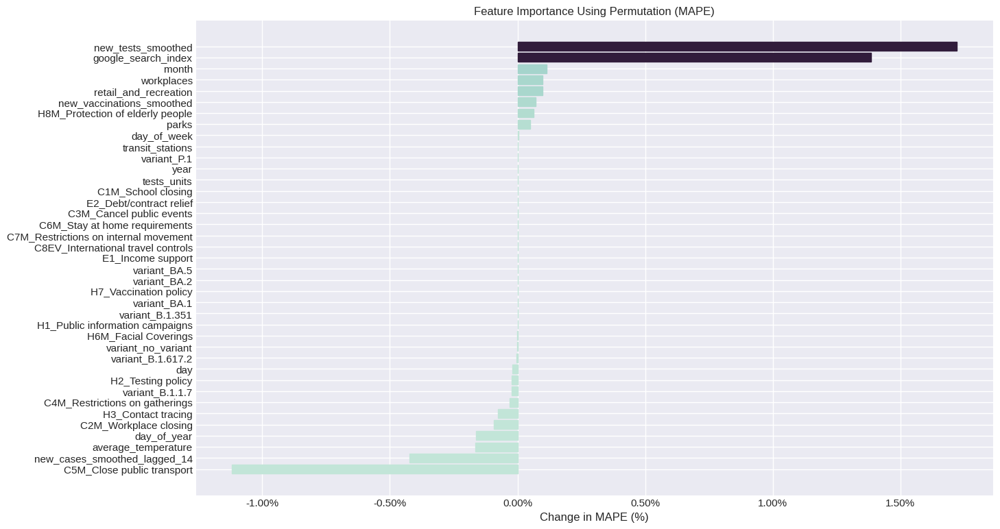

In [ ]:
# Adjust the features list by excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Prepare the evaluation dataset without the target variable in the features set
X_eval = np.array([df_covid_full_LSTM.loc[:, features_columns].iloc[i:i + sequence_length].values for i in range(test_start_index - 14, total_days - sequence_length)])
y_eval = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values  # this should already be correct

# Assuming all previous variables and model are correctly defined and imported
# Evaluate model performance on unshuffled data
initial_mape = evaluate_model_mape(X_eval, y_eval, model, target_scaler)

# Compute permutation importance for each feature
importance_scores_mape = []
n_repeats = 10  # Number of times to shuffle each feature

for feature_idx in range(X_eval.shape[2]):
    score_changes = []
    for _ in range(n_repeats):
        X_permuted = np.copy(X_eval)
        # Shuffle each feature across all timesteps and samples
        for i in range(X_permuted.shape[0]):
            np.random.shuffle(X_permuted[i, :, feature_idx])

        permuted_mape = evaluate_model_mape(X_permuted, y_eval, model, target_scaler)
        score_change = permuted_mape - initial_mape
        score_changes.append(score_change)

    importance_scores_mape.append(np.mean(score_changes))

# Sort indices for better visual arrangement
sorted_idx = np.argsort(importance_scores_mape)

# Plotting feature importance
plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics
fig, ax = plt.subplots(figsize=(15, 9))  # Increased figure size for better visibility
bars = ax.barh(range(len(importance_scores_mape)), np.array(importance_scores_mape)[sorted_idx], color=sns.color_palette("viridis", len(importance_scores_mape)))
ax.set_yticks(range(len(importance_scores_mape)))
ax.set_yticklabels(np.array(features_columns)[sorted_idx])
ax.set_xlabel('Change in MAPE (%)')
ax.set_title('Feature Importance Using Permutation (MAPE)')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}%'))  # Format x-axis labels as percentages

# Adding color gradient effect
gradient_color = []
for bar in bars:
    bar.set_color(sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)(bar.get_width()))

plt.show()

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 16ms/step


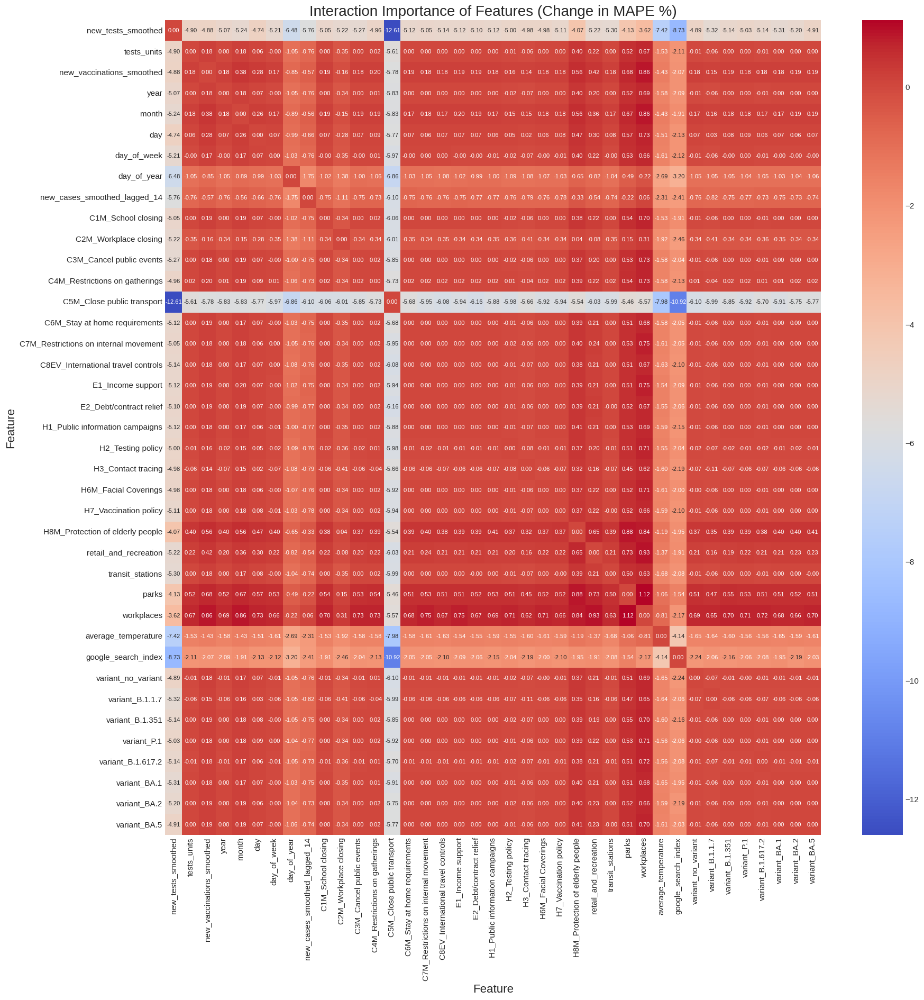

In [ ]:
# Assume X_eval and y_eval are already prepared for evaluation
# Define your feature columns, excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Calculate feature interaction importance
interaction_importance_scores = feature_interaction_importance(X_eval, y_eval, model, target_scaler, features_columns)

# Visualize the interaction importance
fig, ax = plt.subplots(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(interaction_importance_scores, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=features_columns, yticklabels=features_columns, annot_kws={"size": 8})
ax.set_title('Interaction Importance of Features (Change in MAPE %)', fontsize=20)
ax.set_xlabel('Feature', fontsize=16)
ax.set_ylabel('Feature', fontsize=16)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.show()

Period 6

Epoch 1/500
10/10 [==============================] - 16s 41ms/step - loss: 0.2589
Epoch 2/500
10/10 [==============================] - 0s 46ms/step - loss: 0.2281
Epoch 3/500
10/10 [==============================] - 0s 40ms/step - loss: 0.2034
Epoch 4/500
10/10 [==============================] - 0s 47ms/step - loss: 0.1815
Epoch 5/500
10/10 [==============================] - 0s 41ms/step - loss: 0.1615
Epoch 6/500
10/10 [==============================] - 0s 37ms/step - loss: 0.1432
Epoch 7/500
10/10 [==============================] - 0s 39ms/step - loss: 0.1267
Epoch 8/500
10/10 [==============================] - 0s 41ms/step - loss: 0.1120
Epoch 9/500
10/10 [==============================] - 0s 45ms/step - loss: 0.0988
Epoch 10/500
10/10 [==============================] - 0s 42ms/step - loss: 0.0871
Epoch 11/500
10/10 [==============================] - 0s 43ms/step - loss: 0.0767
Epoch 12/500
10/10 [==============================] - 0s 44ms/step - loss: 0.0676
Epoch 13/500
10/10 [====

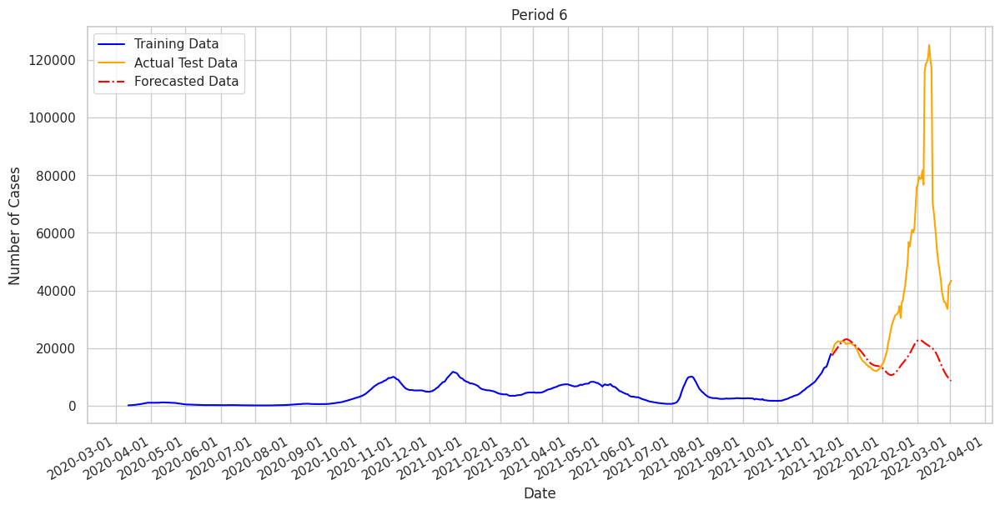

In [41]:
# Set a random seed for reproducibility
np.random.seed(1)
python_random.seed(1)
tf.random.set_seed(1)

# Load and preprocess data
df_covid_full_LSTM = group7_full_covid_data.copy()

# Normalize the data
features_columns = df_covid_full_LSTM.columns.drop('new_cases_smoothed')
scaler_features = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM[features_columns] = scaler_features.fit_transform(df_covid_full_LSTM[features_columns])

target_scaler = MinMaxScaler(feature_range=(0, 1))
df_covid_full_LSTM['new_cases_smoothed'] = target_scaler.fit_transform(df_covid_full_LSTM[['new_cases_smoothed']])

model = Sequential([
    Bidirectional(LSTM(50, return_sequences=True, input_shape=(14, len(features_columns)), kernel_regularizer=l1_l2(l1=1e-4, l2=1e-3))),
    Dropout(0.1),
    Bidirectional(LSTM(25, return_sequences=True)),
    Dropout(0.1),
    Bidirectional(LSTM(10)),
    Dropout(0.1),
    Dense(1)
])
model.compile(optimizer='adam', loss='mean_squared_error')

# Prepare data for training and prediction
total_days = len(df_covid_full_LSTM)
test_start_index = total_days - 105  # Start of the 105-day test period
sequence_length = 14

# Prepare sequences
X = []
y = []

# Training data
for i in range(test_start_index - sequence_length):
    seq_x, seq_y = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values, df_covid_full_LSTM['new_cases_smoothed'].iloc[i + sequence_length]
    X.append(seq_x)
    y.append(seq_y)

X_train, y_train = np.array(X), np.array(y)
model.fit(X_train, y_train, epochs=500, batch_size=64, verbose=1)  # Adjust these parameters

# Prediction phase
X_test = []
for i in range(test_start_index - 14, total_days - sequence_length):  # Start predictions 14 days earlier
    seq_x = df_covid_full_LSTM[features_columns].iloc[i:i + sequence_length].values
    X_test.append(seq_x)

X_test = np.array(X_test)
predictions = model.predict(X_test)

# Inverse transform predictions
predictions_scaled = target_scaler.inverse_transform(predictions)

# Actual data for plotting
actuals = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values
actuals_scaled = target_scaler.inverse_transform(actuals.reshape(-1, 1))

# Evaluation metrics
mae = mean_absolute_error(actuals_scaled, predictions_scaled)
rmse = sqrt(mean_squared_error(actuals_scaled, predictions_scaled))
mape = 100 * np.mean(np.abs((actuals_scaled - predictions_scaled) / actuals_scaled))

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}%")

# Plot the results
plt.figure(figsize=(14, 7))
training_data_plot = target_scaler.inverse_transform(y_train.reshape(-1, 1))
train_indices = df_covid_full_LSTM.index[sequence_length:test_start_index]

plt.plot(train_indices, training_data_plot, label='Training Data', color='blue')
plt.plot(df_covid_full_LSTM.index[test_start_index:], actuals_scaled, label='Actual Test Data', color='orange')
plt.plot(df_covid_full_LSTM.index[test_start_index:], predictions_scaled, label='Forecasted Data', color='red', linestyle='-.')

plt.title('Period 6')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()  # Rotate date labels for better readability

plt.show()


4/4 [==============================] - 0s 12ms/step


<ipython-input-52-867f15f509fb>:34: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics


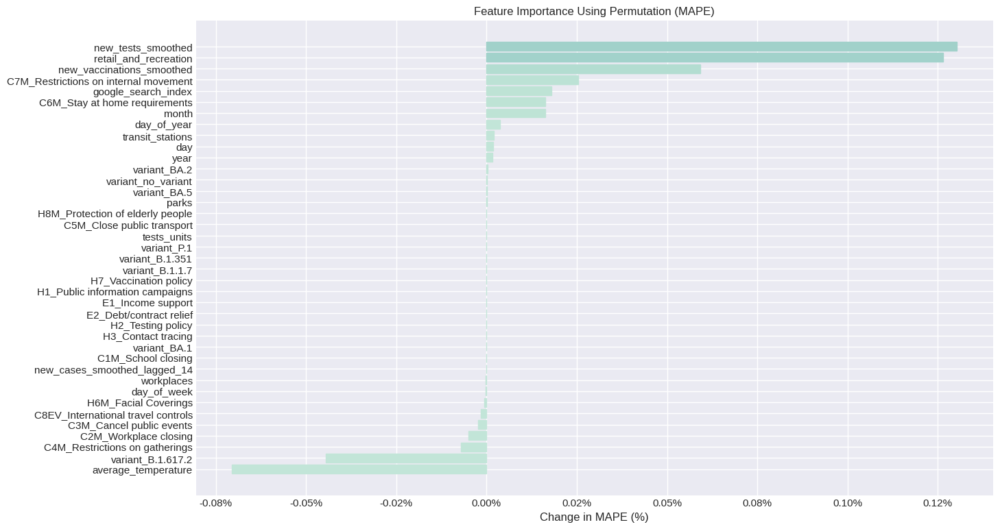

In [ ]:
# Adjust the features list by excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Prepare the evaluation dataset without the target variable in the features set
X_eval = np.array([df_covid_full_LSTM.loc[:, features_columns].iloc[i:i + sequence_length].values for i in range(test_start_index - 14, total_days - sequence_length)])
y_eval = df_covid_full_LSTM['new_cases_smoothed'][test_start_index:].values  # this should already be correct

# Assuming all previous variables and model are correctly defined and imported
# Evaluate model performance on unshuffled data
initial_mape = evaluate_model_mape(X_eval, y_eval, model, target_scaler)

# Compute permutation importance for each feature
importance_scores_mape = []
n_repeats = 10  # Number of times to shuffle each feature

for feature_idx in range(X_eval.shape[2]):
    score_changes = []
    for _ in range(n_repeats):
        X_permuted = np.copy(X_eval)
        # Shuffle each feature across all timesteps and samples
        for i in range(X_permuted.shape[0]):
            np.random.shuffle(X_permuted[i, :, feature_idx])

        permuted_mape = evaluate_model_mape(X_permuted, y_eval, model, target_scaler)
        score_change = permuted_mape - initial_mape
        score_changes.append(score_change)

    importance_scores_mape.append(np.mean(score_changes))

# Sort indices for better visual arrangement
sorted_idx = np.argsort(importance_scores_mape)

# Plotting feature importance
plt.style.use('seaborn-darkgrid')  # Using seaborn style for better aesthetics
fig, ax = plt.subplots(figsize=(15, 9))  # Increased figure size for better visibility
bars = ax.barh(range(len(importance_scores_mape)), np.array(importance_scores_mape)[sorted_idx], color=sns.color_palette("viridis", len(importance_scores_mape)))
ax.set_yticks(range(len(importance_scores_mape)))
ax.set_yticklabels(np.array(features_columns)[sorted_idx])
ax.set_xlabel('Change in MAPE (%)')
ax.set_title('Feature Importance Using Permutation (MAPE)')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}%'))  # Format x-axis labels as percentages

# Adding color gradient effect
gradient_color = []
for bar in bars:
    bar.set_color(sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)(bar.get_width()))

plt.show()

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 19ms/step


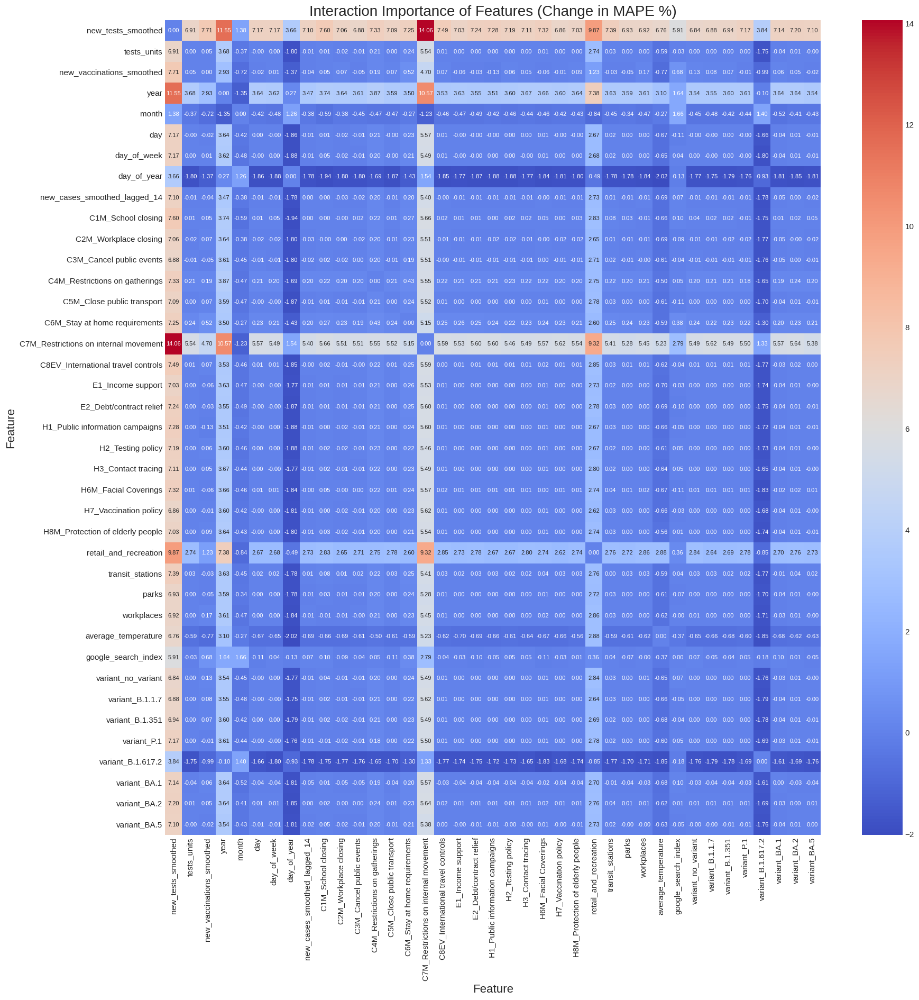

In [ ]:
# Assume X_eval and y_eval are already prepared for evaluation
# Define your feature columns, excluding the target variable
features_columns = [col for col in df_covid_full_LSTM.columns if col != 'new_cases_smoothed']

# Calculate feature interaction importance
interaction_importance_scores = feature_interaction_importance(X_eval, y_eval, model, target_scaler, features_columns)

# Visualize the interaction importance
fig, ax = plt.subplots(figsize=(20, 20))  # Adjust the figure size as needed
sns.heatmap(interaction_importance_scores, annot=True, fmt=".2f", cmap='coolwarm', xticklabels=features_columns, yticklabels=features_columns, annot_kws={"size": 8})
ax.set_title('Interaction Importance of Features (Change in MAPE %)', fontsize=20)
ax.set_xlabel('Feature', fontsize=16)
ax.set_ylabel('Feature', fontsize=16)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.yticks(rotation=0)  # Adjust rotation if necessary
plt.show()

In [ ]:
# Data from the table
data = {
    "Period": [1, 2, 3, 4, 5, 6],
    "ARIMA": [95.5, 40.8, 81.2, 378.4, 66.0, 55.8],
    "SVM": [84.3, 70.2, 29.3, 48.7, 45.1, 34.8],
    "RF": [64.5, 77.8, 42.6, 76.1, 34.2, 53.3],
    "GP": [98.5, 84.3, 19.2, 138.4, 25.8, 70.5],
    "LSTM": [65.0, 41.3, 16.0, 91.3, 53.8, 41.3],
    "CHRONOS": [68.7, 56.7, 56.0, 93.2, 107.4, 34.4]
}

# Load data into DataFrame
df = pd.DataFrame(data)

# Plotting the data
plt.figure(figsize=(12, 8))

# Plot each model's data
for column in df.columns[1:]:
    if column == "ARIMA":
        plt.plot(df["Period"], [95.5, 40.8, 81.2, None, 66.0, 55.8], label=column, marker='o')
    else:
        plt.plot(df["Period"], df[column], label=column, marker='o')

# Set the y-axis limit to a maximum value
plt.ylim(0, 150)

plt.xlabel('Period', fontsize=14)
plt.ylabel('MAPE (%)', fontsize=14)
plt.title('MAPE Values Over Periods for Different Models', fontsize=16)
plt.legend(fontsize=12, loc='upper left')
plt.grid(True)

# Annotate the missing ARIMA point
plt.text(5.1, 140, 'ARIMA value of 378.4% for period 4 not shown', fontsize=12, ha='center', bbox=dict(facecolor='white', edgecolor='black'))

# Adjust the layout
plt.tight_layout()

plt.show()

## CHRONOS

In [51]:
# Calculate the total number of rows for each group
rows_per_group = [105, 158, 210, 263, 315, 368, 420, 473, 525, 478, 630, 683, 735]  # 735 rows in total

# Initialize an empty list to hold the dataframes
grouped_dataframes = []

# Use the rows_per_group to slice df_covid_full and create each group
for i, rows in enumerate(rows_per_group):
    # Slice the DataFrame up to the current number of rows
    current_group_df = df_covid_full.iloc[:rows, :].copy()

    # Append the sliced DataFrame to the list
    grouped_dataframes.append(current_group_df)

# Assigning each DataFrame to a variable for easier reference
chronos0 = grouped_dataframes[0]
chronos1 = grouped_dataframes[1]
chronos2 = grouped_dataframes[2]
chronos3 = grouped_dataframes[3]
chronos4 = grouped_dataframes[4]
chronos5 = grouped_dataframes[5]
chronos6 = grouped_dataframes[6]
chronos7 = grouped_dataframes[7]
chronos8 = grouped_dataframes[8]
chronos9 = grouped_dataframes[9]
chronos10 = grouped_dataframes[10]
chronos11 = grouped_dataframes[11]
chronos12 = grouped_dataframes[12]

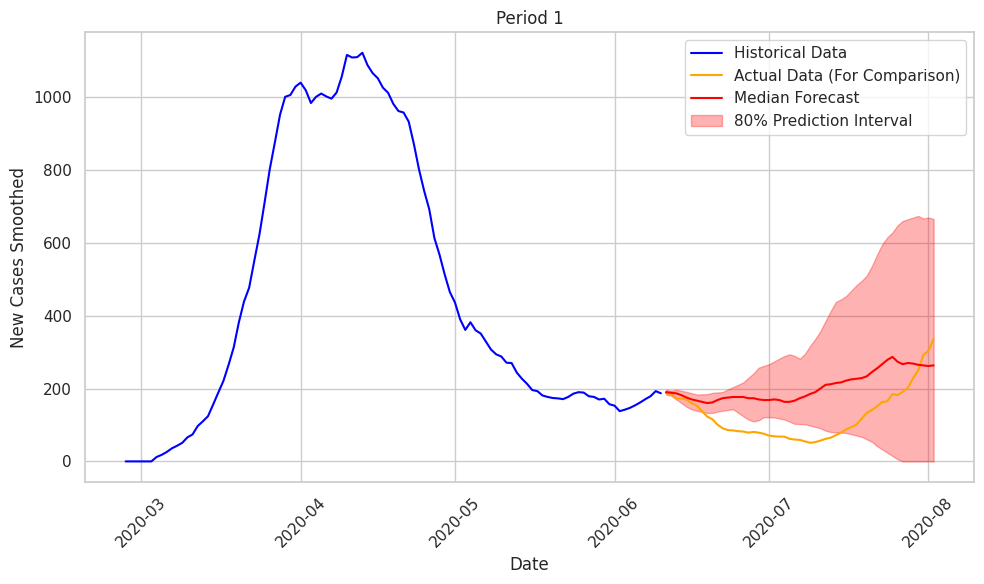

Mean Absolute Error (MAE): 84.04916252280181
Root Mean Squared Error (RMSE): 94.36508632146455
Mean Absolute Percentage Error (MAPE): 99.0038132627868


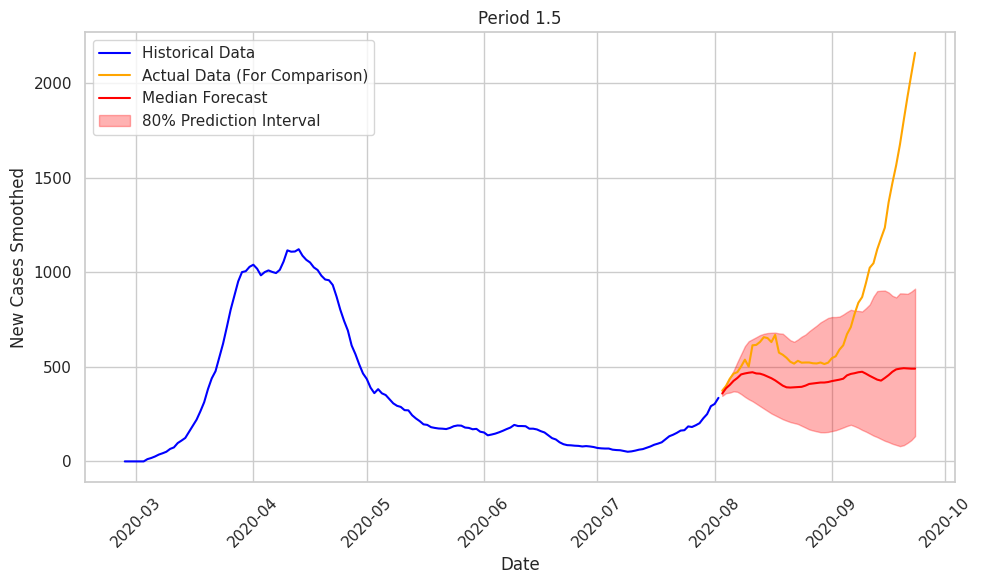

Mean Absolute Error (MAE): 375.0377816420335
Root Mean Squared Error (RMSE): 572.8808089006735
Mean Absolute Percentage Error (MAPE): 34.92827957184213

Mean Absolute Error (MAE): 228.1578119913737
Root Mean Squared Error (RMSE): 331.34430131307283
Mean Absolute Percentage Error (MAPE): 67.27116800631897


In [52]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos1["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 53

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos1["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos1.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae1 = mean_absolute_error(actual_data_for_comparison, median)
rmse1 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape1 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 1")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae1)
print("Root Mean Squared Error (RMSE):", rmse1)
print("Mean Absolute Percentage Error (MAPE):", mape1)

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos2["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 52

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos2["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos2.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae2 = mean_absolute_error(actual_data_for_comparison, median)
rmse2 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape2 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 1.5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae2)
print("Root Mean Squared Error (RMSE):", rmse2)
print("Mean Absolute Percentage Error (MAPE):", mape2)

print()

print("Mean Absolute Error (MAE):", (mae1 * 53/105 + mae2 * 52/105))
print("Root Mean Squared Error (RMSE):", (rmse1 * 53/105 + rmse2 * 52/105))
print("Mean Absolute Percentage Error (MAPE):", (mape1 * 53/105 + mape2 * 52/105))


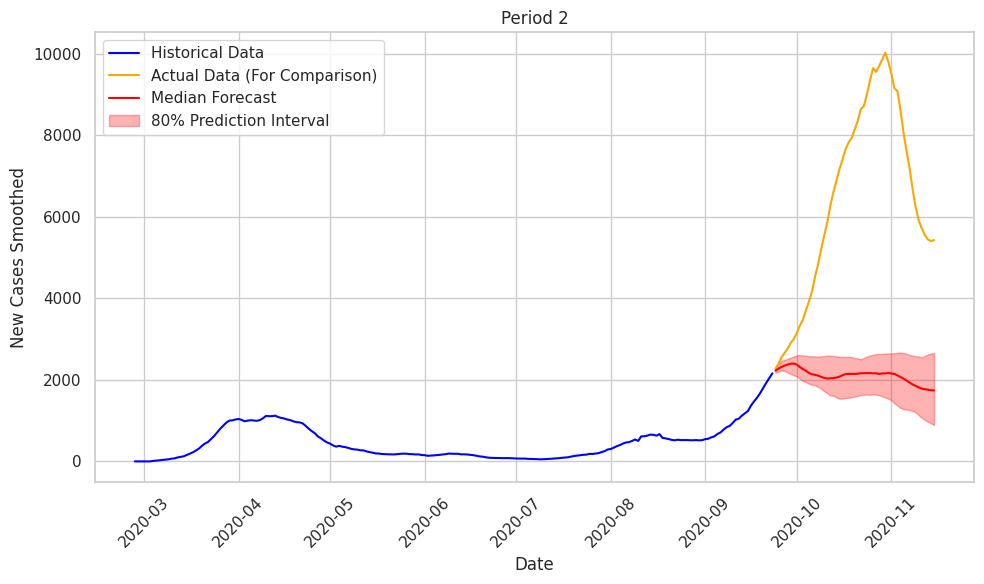

Mean Absolute Error (MAE): 4316.154825462485
Root Mean Squared Error (RMSE): 4952.573003732152
Mean Absolute Percentage Error (MAPE): 59.741211123822836


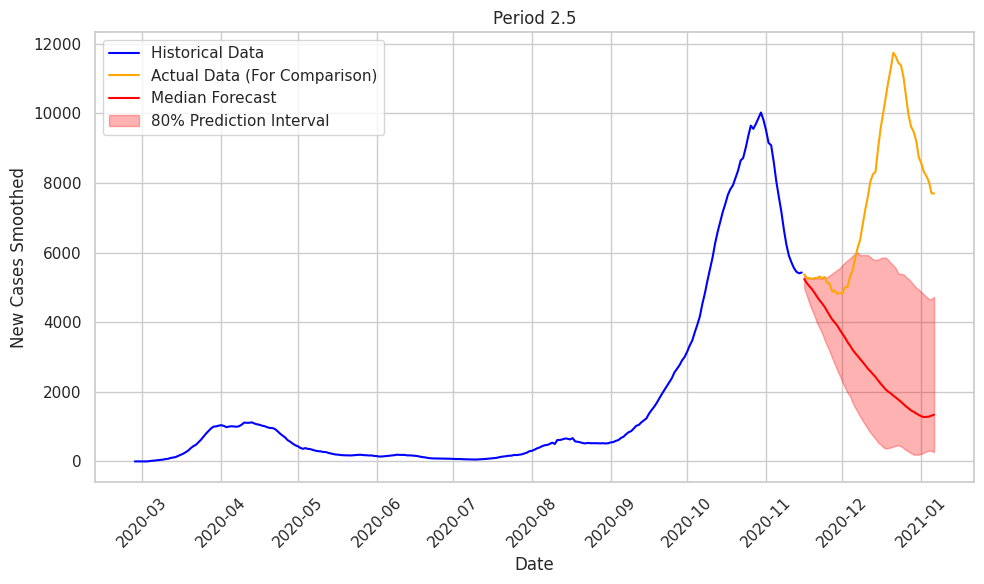

Mean Absolute Error (MAE): 4691.288648165189
Root Mean Squared Error (RMSE): 5798.380040119271
Mean Absolute Percentage Error (MAPE): 53.88954208843635

Mean Absolute Error (MAE): 4501.935385277157
Root Mean Squared Error (RMSE): 5371.448869371487
Mean Absolute Percentage Error (MAPE): 56.843241696774285


In [53]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos3["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 53

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos3["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos3.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae3 = mean_absolute_error(actual_data_for_comparison, median)
rmse3 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape3 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 2")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae3)
print("Root Mean Squared Error (RMSE):", rmse3)
print("Mean Absolute Percentage Error (MAPE):", mape3)

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos4["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 52

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos4["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos4.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae4 = mean_absolute_error(actual_data_for_comparison, median)
rmse4 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape4 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 2.5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae4)
print("Root Mean Squared Error (RMSE):", rmse4)
print("Mean Absolute Percentage Error (MAPE):", mape4)

print()

print("Mean Absolute Error (MAE):", (mae3 * 53/105 + mae4 * 52/105))
print("Root Mean Squared Error (RMSE):", (rmse3 * 53/105 + rmse4 * 52/105))
print("Mean Absolute Percentage Error (MAPE):", (mape3 * 53/105 + mape4 * 52/105))


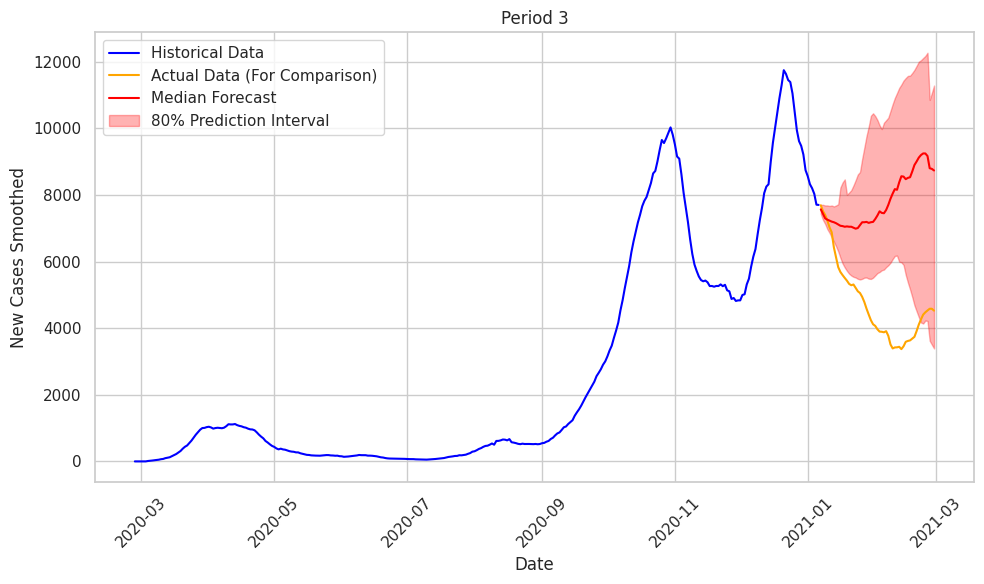

Mean Absolute Error (MAE): 3061.0603534050706
Root Mean Squared Error (RMSE): 3494.709246974369
Mean Absolute Percentage Error (MAPE): 75.55881163346892


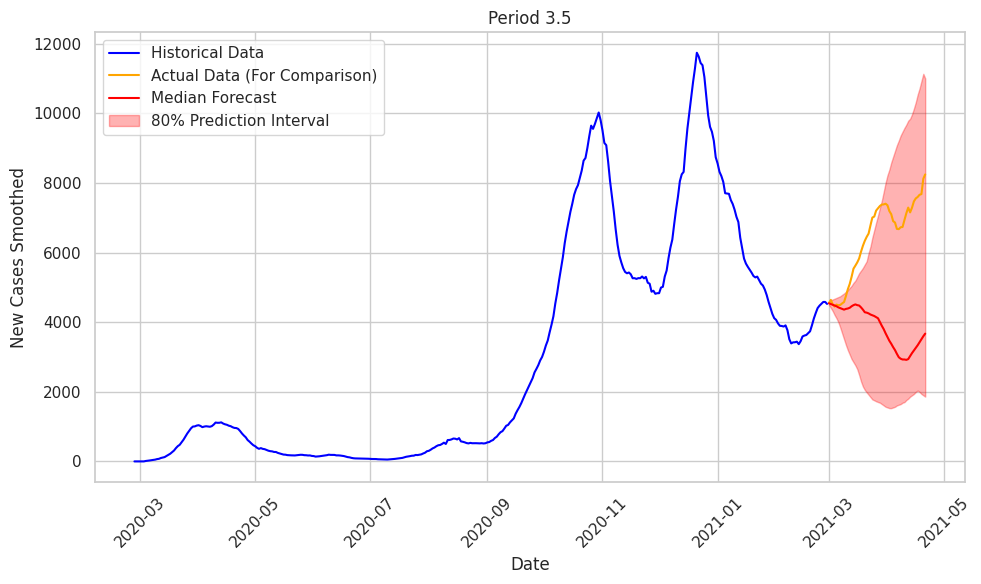

Mean Absolute Error (MAE): 2520.9667194073018
Root Mean Squared Error (RMSE): 2981.728008599323
Mean Absolute Percentage Error (MAPE): 35.90673327234479

Mean Absolute Error (MAE): 2793.5854108537947
Root Mean Squared Error (RMSE): 3240.6613955886314
Mean Absolute Percentage Error (MAPE): 55.92159187367412


In [54]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos5["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 53

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos5["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos5.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae5 = mean_absolute_error(actual_data_for_comparison, median)
rmse5 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape5 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 3")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae5)
print("Root Mean Squared Error (RMSE):", rmse5)
print("Mean Absolute Percentage Error (MAPE):", mape5)

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos6["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 52

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos6["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos6.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae6 = mean_absolute_error(actual_data_for_comparison, median)
rmse6 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape6 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 3.5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae6)
print("Root Mean Squared Error (RMSE):", rmse6)
print("Mean Absolute Percentage Error (MAPE):", mape6)

print()

print("Mean Absolute Error (MAE):", (mae5 * 53/105 + mae6 * 52/105))
print("Root Mean Squared Error (RMSE):", (rmse5 * 53/105 + rmse6 * 52/105))
print("Mean Absolute Percentage Error (MAPE):", (mape5 * 53/105 + mape6 * 52/105))


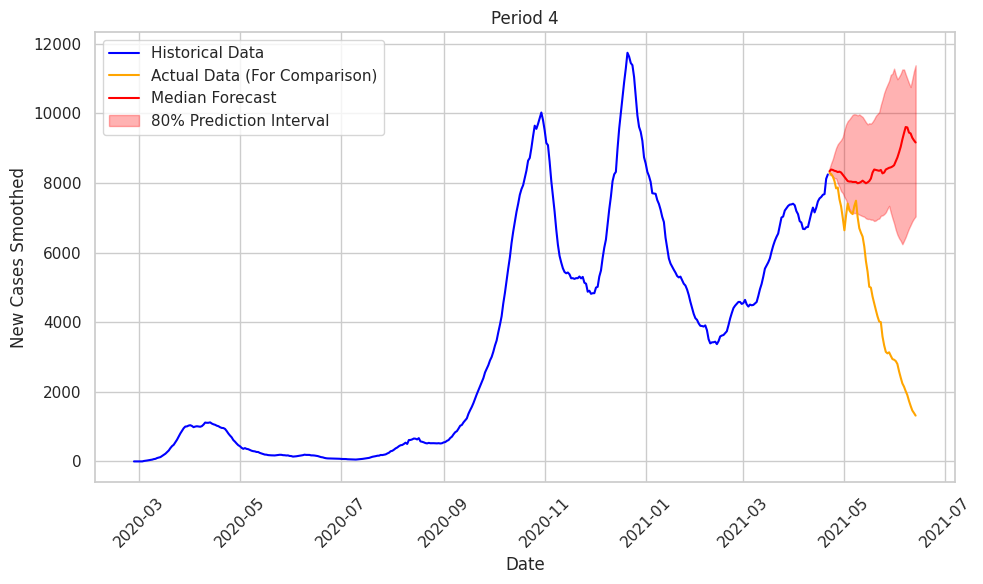

Mean Absolute Error (MAE): 3574.9357633770637
Root Mean Squared Error (RMSE): 4447.892841466122
Mean Absolute Percentage Error (MAPE): 139.33180694420602


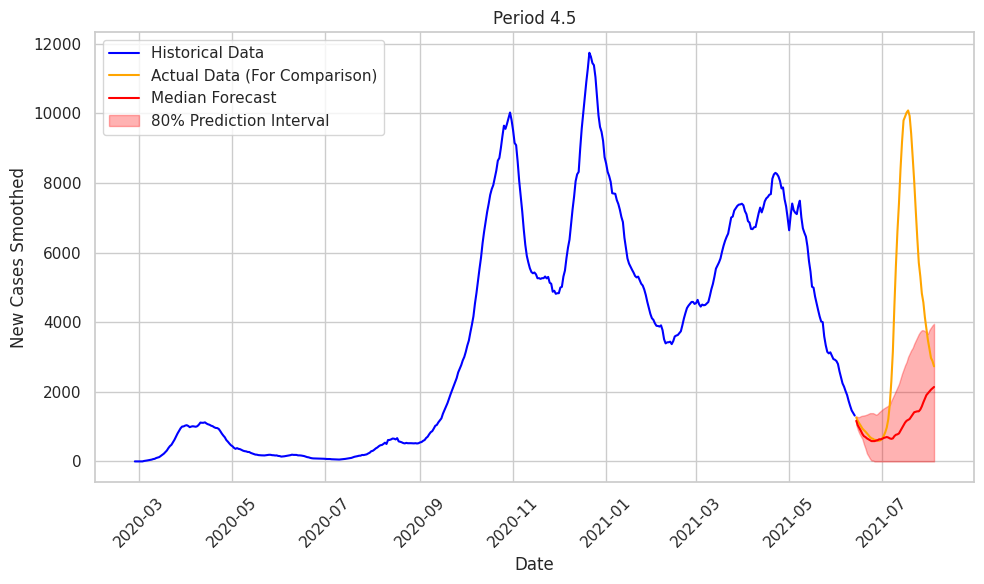

Mean Absolute Error (MAE): 2787.14417384221
Root Mean Squared Error (RMSE): 4221.059902563244
Mean Absolute Percentage Error (MAPE): 46.57314839015844

Mean Absolute Error (MAE): 3184.7913571312315
Root Mean Squared Error (RMSE): 4335.556528866601
Mean Absolute Percentage Error (MAPE): 93.39418556505865


In [56]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos7["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 53

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos7["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos7.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae7 = mean_absolute_error(actual_data_for_comparison, median)
rmse7 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape7 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 4")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae7)
print("Root Mean Squared Error (RMSE):", rmse7)
print("Mean Absolute Percentage Error (MAPE):", mape7)

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos8["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 52

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos8["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos8.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae8 = mean_absolute_error(actual_data_for_comparison, median)
rmse8 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape8 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 4.5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae8)
print("Root Mean Squared Error (RMSE):", rmse8)
print("Mean Absolute Percentage Error (MAPE):", mape8)

print()

print("Mean Absolute Error (MAE):", (mae7 * 53/105 + mae8 * 52/105))
print("Root Mean Squared Error (RMSE):", (rmse7 * 53/105 + rmse8 * 52/105))
print("Mean Absolute Percentage Error (MAPE):", (mape7 * 53/105 + mape8 * 52/105))

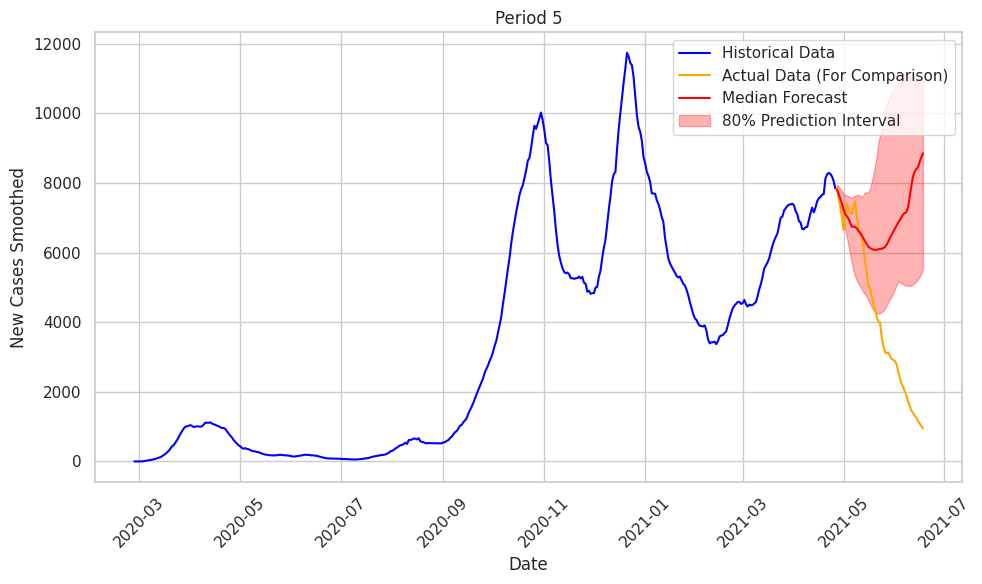

Mean Absolute Error (MAE): 2837.5820634949882
Root Mean Squared Error (RMSE): 3792.8151391800725
Mean Absolute Percentage Error (MAPE): 159.0434998215069


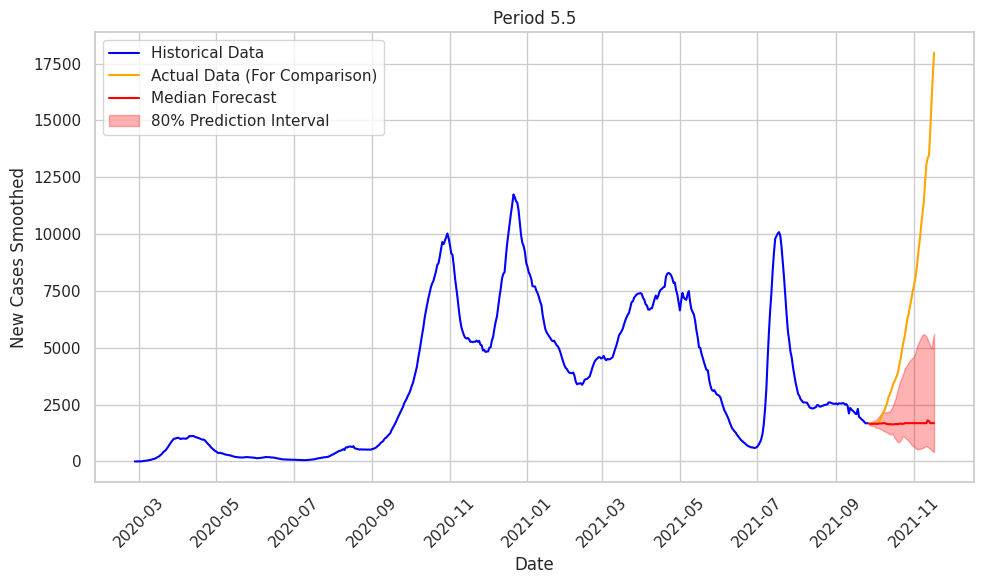

Mean Absolute Error (MAE): 4596.559518667368
Root Mean Squared Error (RMSE): 6451.699012000463
Mean Absolute Percentage Error (MAPE): 54.56828347267971

Mean Absolute Error (MAE): 3708.69470796131
Root Mean Squared Error (RMSE): 5109.595723814932
Mean Absolute Percentage Error (MAPE): 107.30339267732582


In [57]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos9["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 53

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos9["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos9.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae9 = mean_absolute_error(actual_data_for_comparison, median)
rmse9 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape9 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae9)
print("Root Mean Squared Error (RMSE):", rmse9)
print("Mean Absolute Percentage Error (MAPE):", mape9)

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos10["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 52

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos10["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos10.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae10 = mean_absolute_error(actual_data_for_comparison, median)
rmse10 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape10 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 5.5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae10)
print("Root Mean Squared Error (RMSE):", rmse10)
print("Mean Absolute Percentage Error (MAPE):", mape10)

print()

print("Mean Absolute Error (MAE):", (mae9 * 53/105 + mae10 * 52/105))
print("Root Mean Squared Error (RMSE):", (rmse9 * 53/105 + rmse10 * 52/105))
print("Mean Absolute Percentage Error (MAPE):", (mape9 * 53/105 + mape10 * 52/105))


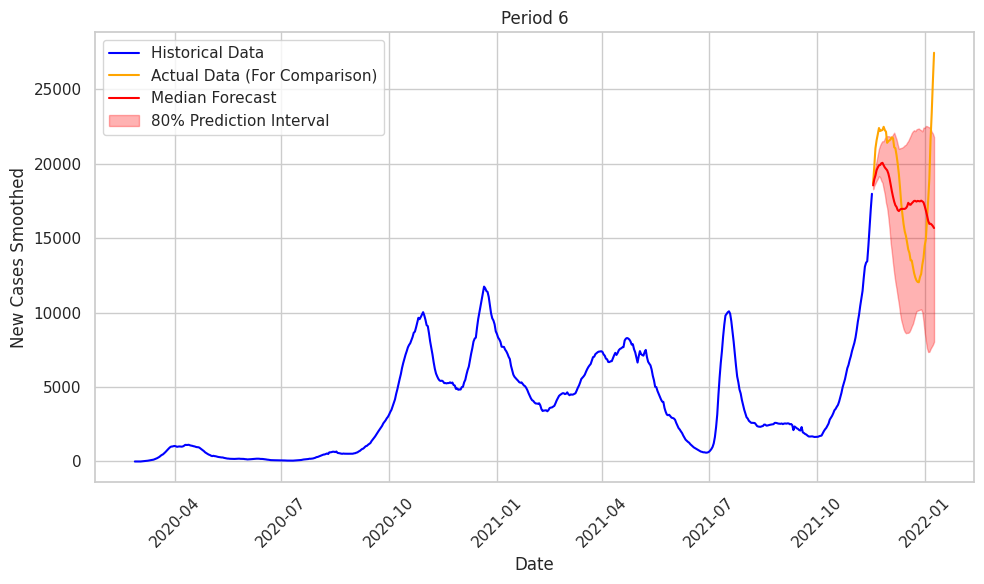

Mean Absolute Error (MAE): 3260.538095150354
Root Mean Squared Error (RMSE): 3898.8222993229087
Mean Absolute Percentage Error (MAPE): 19.05389607265232


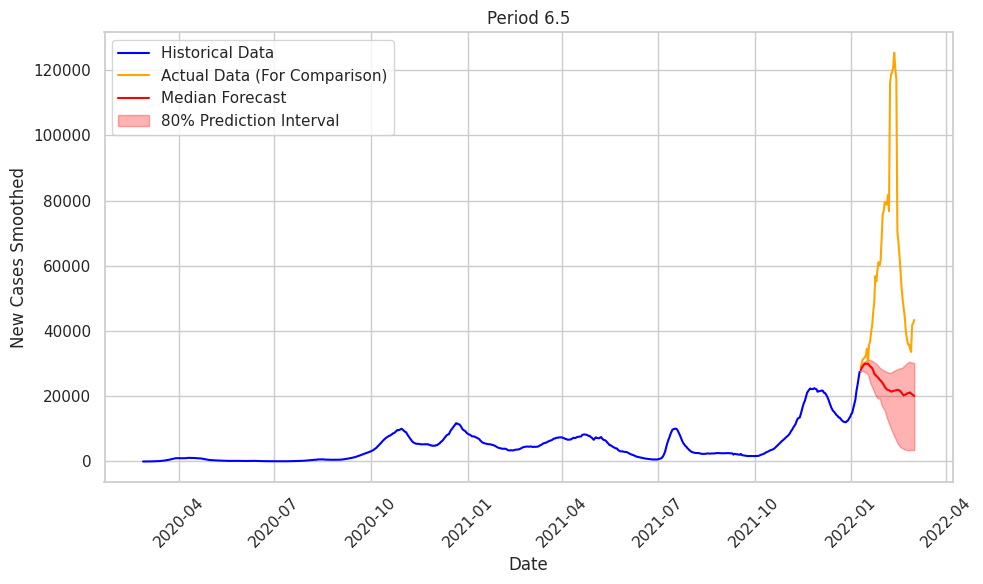

Mean Absolute Error (MAE): 35680.78384164663
Root Mean Squared Error (RMSE): 46505.46060871391
Mean Absolute Percentage Error (MAPE): 50.135727273600864

Mean Absolute Error (MAE): 19316.27884579613
Root Mean Squared Error (RMSE): 24999.252700164165
Mean Absolute Percentage Error (MAPE): 34.446802953122074


In [59]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos11["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 53

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos11["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos11.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae11 = mean_absolute_error(actual_data_for_comparison, median)
rmse11 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape11 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 6")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae11)
print("Root Mean Squared Error (RMSE):", rmse11)
print("Mean Absolute Percentage Error (MAPE):", mape11)

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a ChronosPipeline using the pre-trained 'chronos-t5-tiny' model
pipeline = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cuda" if torch.cuda.is_available() else "cpu",  # Use GPU if available
    torch_dtype=torch.bfloat16,  # For memory efficiency
)

# Prepare the context (historical data)
context = torch.tensor(chronos12["new_cases_smoothed"].values)

# Set the prediction length (number of time steps to forecast)
prediction_length = 52

# Generate the forecast
forecast = pipeline.predict(context[:-prediction_length], prediction_length)

# Extracting historical data
historical_data = chronos12["new_cases_smoothed"].values

# Extracting dates for historical data
dates = chronos12.index

# Generating forecast dates
forecast_dates = pd.date_range(start=dates[-prediction_length], periods=prediction_length)

# Extracting forecasted values
forecast_values = forecast[0].numpy()

# Calculating percentiles for the forecast
low, median, high = np.quantile(forecast_values, [0.1, 0.5, 0.9], axis=0)

# Calculate evaluation metrics
actual_data_for_comparison = historical_data[-prediction_length:]
mae12 = mean_absolute_error(actual_data_for_comparison, median)
rmse12 = np.sqrt(mean_squared_error(actual_data_for_comparison, median))
mape12 = mean_absolute_percentage_error(actual_data_for_comparison, median)

# Plotting
plt.figure(figsize=(10, 6))

# Plot historical data
plt.plot(dates[:-prediction_length], historical_data[:-prediction_length], label="Historical Data", color="blue")

# Plot actual data for the forecast period (to compare with forecast)
plt.plot(dates[-prediction_length:], actual_data_for_comparison, label="Actual Data (For Comparison)", color="orange")

# Plot forecasted median
plt.plot(forecast_dates, median, label="Median Forecast", color="red")

# Fill between the percentiles for prediction interval
plt.fill_between(forecast_dates, low, high, color="red", alpha=0.3, label="80% Prediction Interval")

plt.title("Period 6.5")
plt.xlabel("Date")
plt.ylabel("New Cases Smoothed")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("Mean Absolute Error (MAE):", mae12)
print("Root Mean Squared Error (RMSE):", rmse12)
print("Mean Absolute Percentage Error (MAPE):", mape12)

print()

print("Mean Absolute Error (MAE):", (mae11 * 53/105 + mae12 * 52/105))
print("Root Mean Squared Error (RMSE):", (rmse11 * 53/105 + rmse12 * 52/105))
print("Mean Absolute Percentage Error (MAPE):", (mape11 * 53/105 + mape12 * 52/105))
